<a href="https://colab.research.google.com/github/SimplyDifficult/ML-for-Wireless/blob/main/6.%20UCB_20_dim_user_case_BOGP_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
P_max = 30 #in dBm

In [8]:
var = 20
number_of_cells = 4

In [ ]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

In [ ]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

In [ ]:
!wget https://www.dropbox.com/s/utf73kdk09gjvsu/RR.mat
!wget https://www.dropbox.com/s/52gyqiq137mo2bb/SE.mat

In [1]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [8]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [28]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [36]:
def UCBobjective(Xsamples, X, model, beta):
  Xsamples = Xsamples[np.newaxis,:]
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  sigma = beta
  probs = mu + sigma * std
  return -probs[0]

In [38]:
#optimize the acquisition function
def opt_acquisition(X, y, model, iteration):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  beta = 2/np.power(0.1*iteration, 0.5)
  
  for i in range(3):
    result = dual_annealing(UCBobjective, bounds, args=(X,model,beta))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [39]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_2.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_2.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_2.npy")

x_next is [ 27.39540963  19.96932768   0.68100691 -18.88031901  27.60821226
 -16.44745503   0.91272393   6.62532418  19.63212196   7.17475255
 -29.46583441  -4.33990595  11.18921948  29.42988749 -16.43016116
  19.59618022  15.41249711 -22.81813451   1.48399385  17.59159777]
f()=0.000000, actual=37.742
0


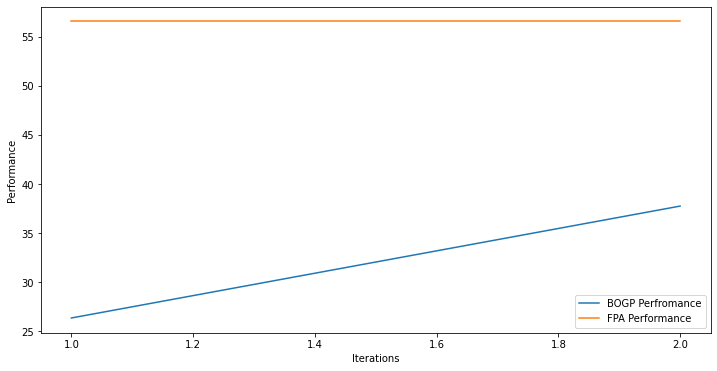

x_next is [ 30. -31. -31. -31.  30. -31. -31. -31. -31. -31. -31. -31. -31.  30.
 -31.  30. -31. -31. -31. -31.]
f()=28.235036, actual=23.015
1


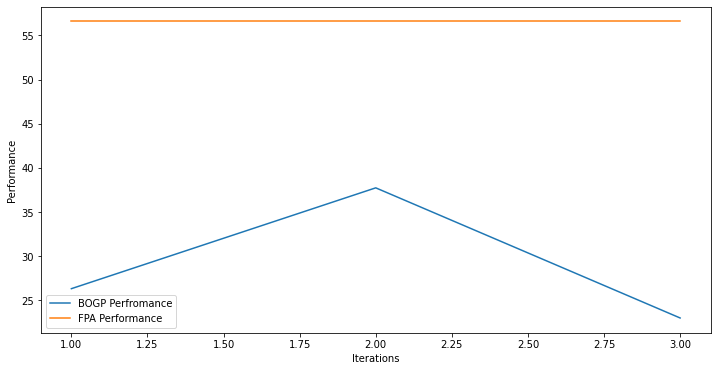

x_next is [-30.99995257  29.99960528  29.99997561  29.99994089 -30.99993321
  29.99997631  29.99994726  29.99995295  29.99997905  29.99999947
  29.99989227  29.99969776  30.         -30.99995534  29.99997631
 -30.99986137  30.          29.99986097  30.          29.99998481]
f()=28.344421, actual=44.964
2


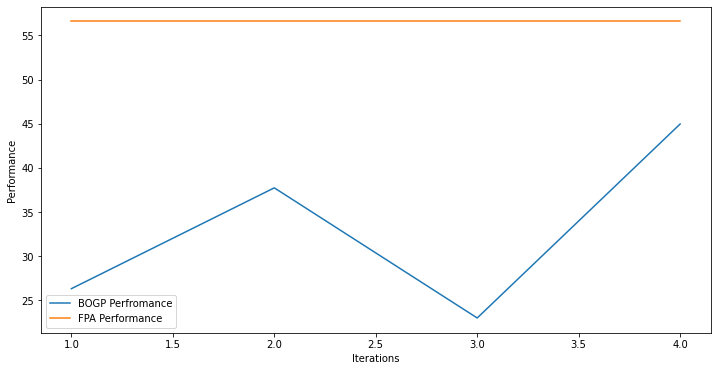

x_next is [ 10.12150936  26.46731887 -30.97426973  28.15714832  -6.90922479
 -28.60316661  21.91248603   3.27102567 -10.10616484  29.64346039
  14.64771006 -19.99828444  28.05780976 -26.97987165 -30.90828323
   5.53397091 -24.83914611  -4.84888234  17.78598026  -3.28333369]
f()=32.231267, actual=31.381
3


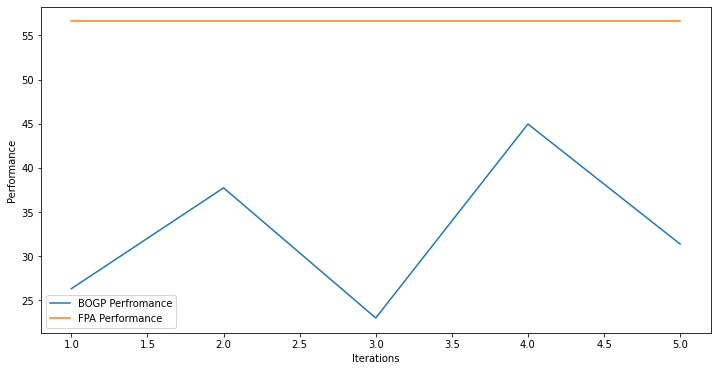

x_next is [ -5.26677297 -18.42895482  19.12747758   8.57730039  -7.14880744
 -29.00489659  -5.17373757 -16.40537465 -20.52415194  27.48340448
  12.60411297   4.53777198   6.93752566   0.35494161  10.61327954
  28.72446625  28.41427065  24.98783751  -9.86809672 -28.49617455]
f()=32.209604, actual=28.181
4


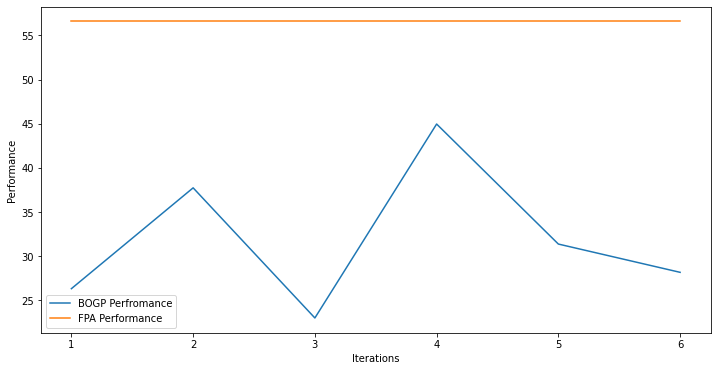

x_next is [-31.  30.  30. -31. -31.  30.  30.  30.  30.  30. -31.  30.  30.  30.
  30. -31.  30. -31.  30.  30.]
f()=38.963916, actual=42.180
5


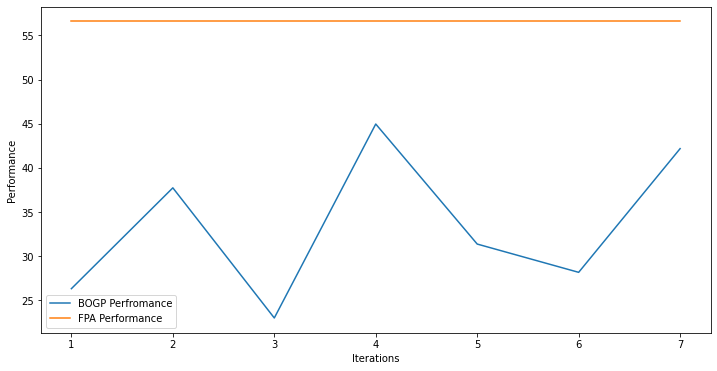

x_next is [-11.15007151 -10.94481549  -9.40010949  12.33920647 -11.44598181
  -5.30053891 -30.51195237  -3.18340702 -21.82010752 -16.4766163
 -11.75984957 -28.19717817  22.04805436  15.73929009  15.46957534
  12.9559455  -24.57228909  12.19117774  27.66523075 -15.95731934]
f()=33.100630, actual=28.779
6


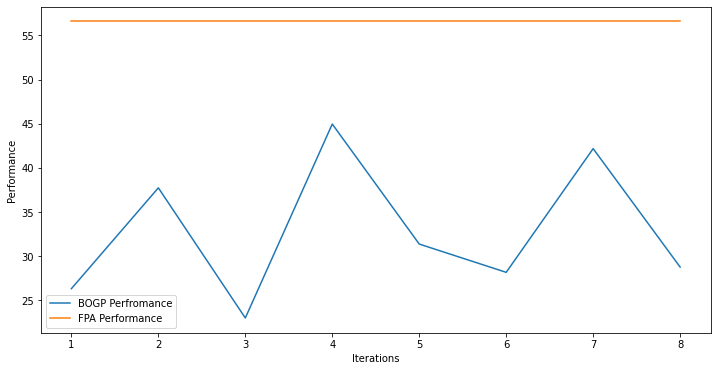

x_next is [ 28.18399889   1.79513373   1.72553876  -8.11030762  25.3959843
  -4.57176986  -5.12032677   4.11421909  13.92049238 -16.2896067
 -20.80862854  15.88808435   6.62055014   3.38451534  -1.98398009
   6.84652904  29.50103443  -1.15272605 -14.35531789  10.42683819]
f()=32.583651, actual=31.536
7


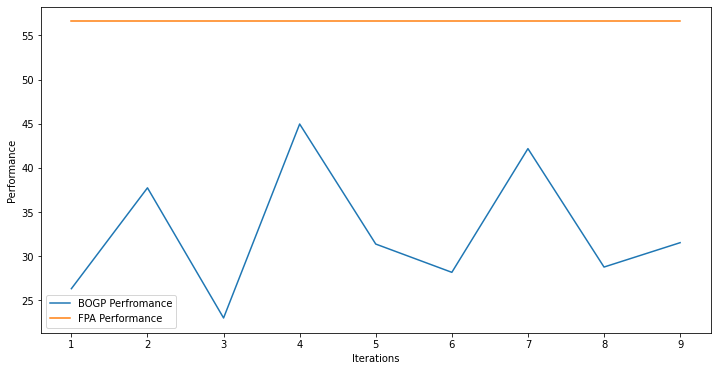

x_next is [-31.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.
 -31. -31.  30. -31.  30.  30.]
f()=40.512857, actual=46.381
8


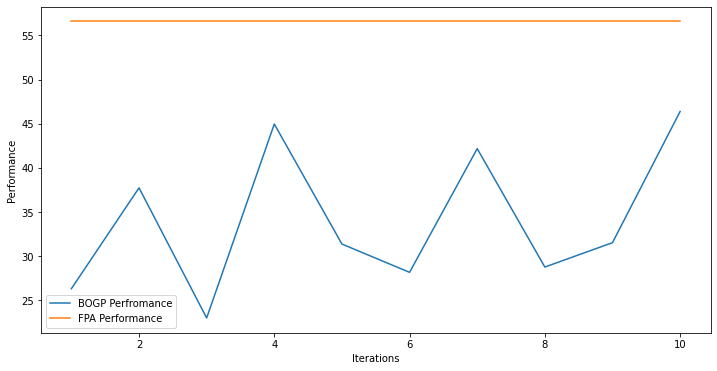

x_next is [-31.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30.
 -31. -31.  30.  30.  30.  30.]
f()=43.403602, actual=49.122
9


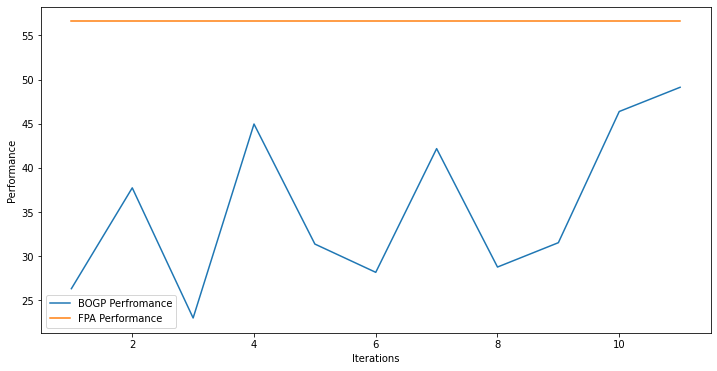

x_next is [-31.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31. -31.  30.  30.
 -31. -31.  30.  30.  30.  30.]
f()=46.160378, actual=48.168
10


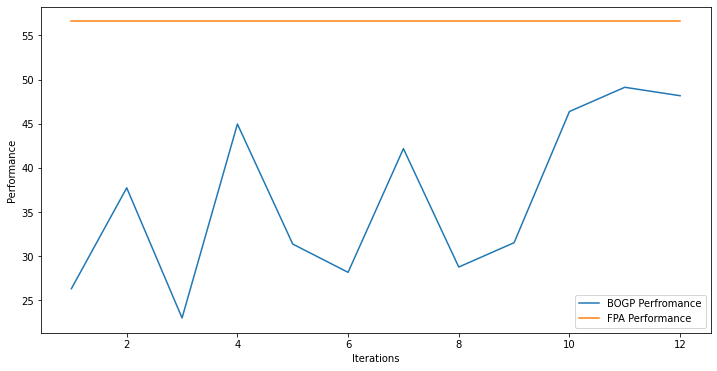

x_next is [ 11.00958186  -5.63924033 -25.22086408  14.43433223  -3.10067737
 -20.81165521  14.66398117  -7.2967647    5.02655461  -3.22701721
  -2.58897965 -15.04372983  14.80909984  13.58828724  -5.59920159
  10.64920898  23.20239103  -4.4086225   -7.50640729 -19.77995409]
f()=36.281685, actual=30.941
11


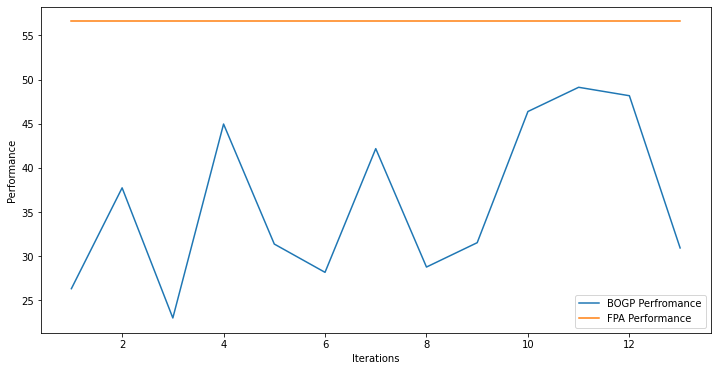

x_next is [-30.99992066  29.99983277  29.99996194  29.99982411  29.9997953
  29.99995611  29.99995335  29.99998697  29.9998923   29.99984652
  29.99969376  29.99980359  29.99996559  29.99958403 -30.99868439
 -30.99999314  29.99986774  29.99981361  29.99986216  29.99997022]
f()=35.879222, actual=48.940
12


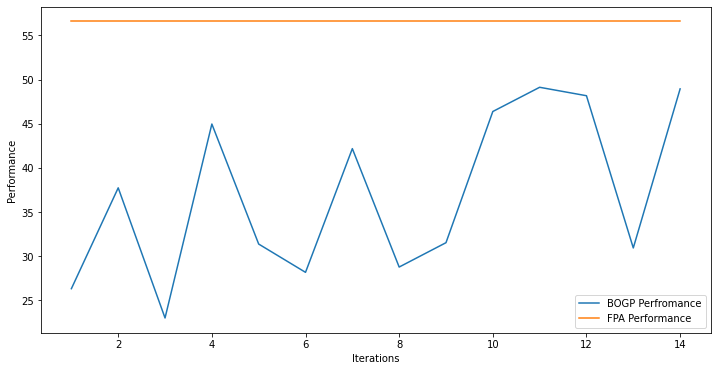

x_next is [-31.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30.
 -31.  30.  30.  30.  30.  30.]
f()=47.357825, actual=52.439
13


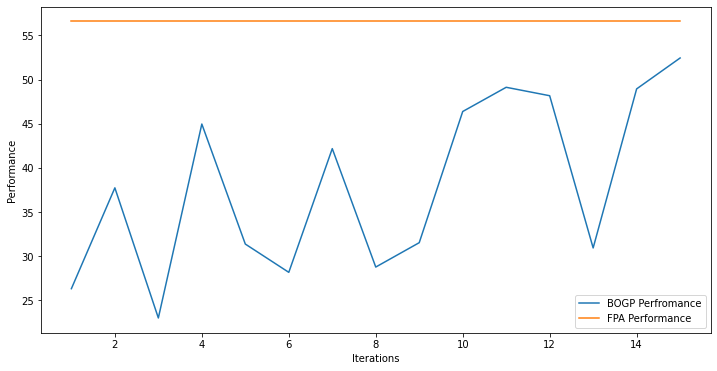

x_next is [-31.  30. -31.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30.
  30.  30.  30.  30.  30.  30.]
f()=48.381721, actual=52.960
14


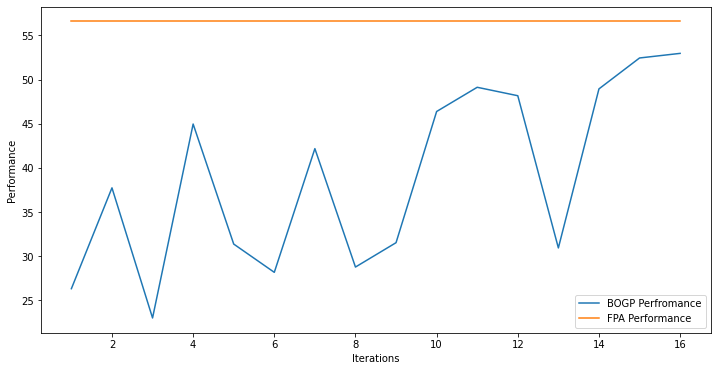

x_next is [-31.  30.  30.  30.  30. -31.  30.  30.  30.  30. -31.  30.  30.  30.
  30.  30.  30.  30.  30.  30.]
f()=51.815340, actual=50.151
15


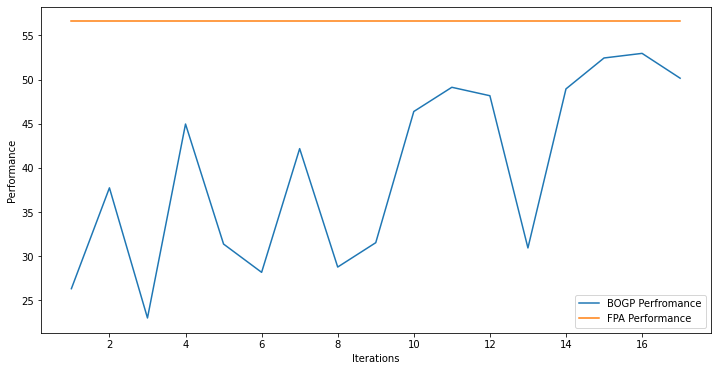

x_next is [-30.99978051  29.99996595 -30.99969032  29.99991268 -30.99973523
 -30.99986198 -30.99982342  29.99997207  29.99991199  29.9998837
 -30.99975407  29.99967703  29.99995481  29.99986317 -30.99997965
  29.99990693  29.99990649  29.99991246  29.99999483  29.99993169]
f()=53.377218, actual=43.715
16


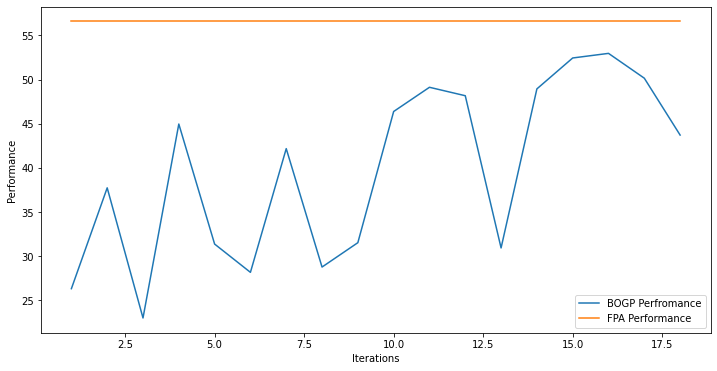

x_next is [-30.99491254  29.99422353  29.9990484   29.99710483  29.99797838
  29.99648441  29.99725296  29.99813676  29.99549332  29.99964671
 -30.9951712   29.99727334  29.9950681   29.99664756  29.98673234
 -30.99929064  29.99920175  29.99775575  29.9967573   29.99585465]
f()=39.688786, actual=49.930
17


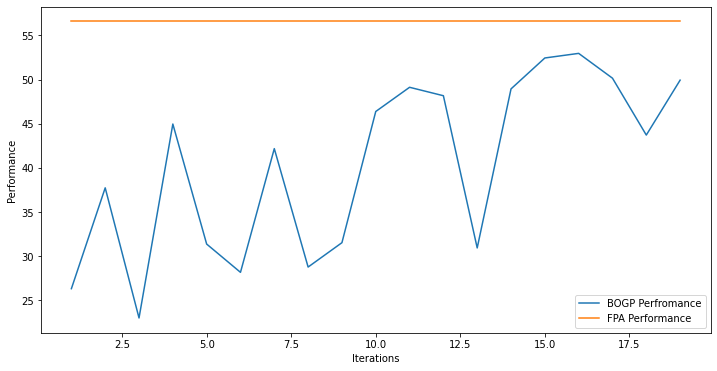

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30.
  30.  30.  30.  30.  30.  30.]
f()=52.180775, actual=56.660
18


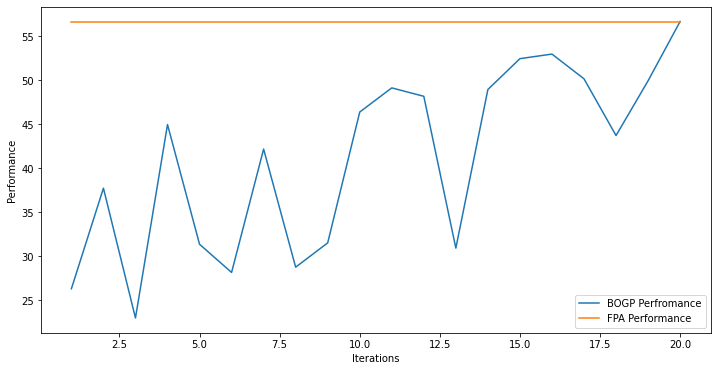

x_next is [-30.99993272  29.99988726  29.99974194  29.9998592   29.99993507
  29.99990925  29.99982598  29.9999861   29.99989351  29.99993406
 -30.99999557  29.99986788  29.99992908  29.99990367  29.99981067
 -30.99994962  29.99977905  29.99975306  29.9999448   29.99996636]
f()=41.044119, actual=49.934
19


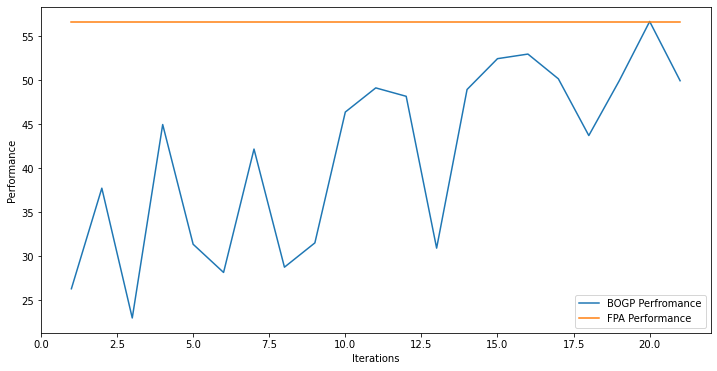

x_next is [ 29.99987161  29.99994293  29.99879411  29.99996291  29.99988934
  29.99938567  29.99993003 -30.99969252  29.99941766  29.99972488
 -30.99825589  29.99952436  29.99997445  29.99949754  29.99987855
  29.99970654  29.99875617  29.99896149  29.99976363  29.99991791]
f()=53.796702, actual=55.344
20


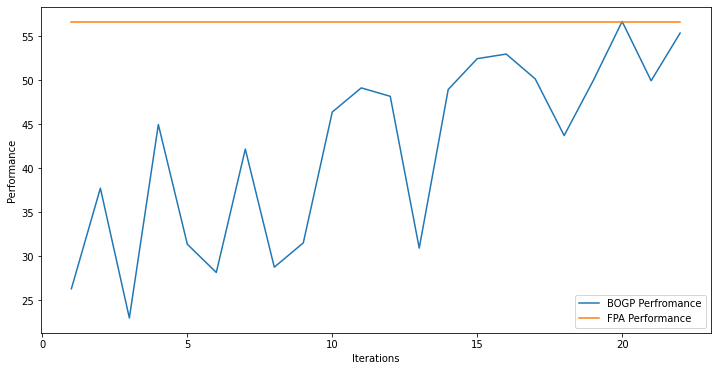

x_next is [29.99907529 29.99969509 29.99870857 29.99932739 29.99568911 29.99998049
 29.99988805 29.99974259 29.99971915 29.99991995 29.99925392 29.9958511
 29.9998362  29.99987921 29.99975711 29.9998478  29.9996428  29.99907514
 29.99869106 29.99982431]
f()=55.872157, actual=56.571
21


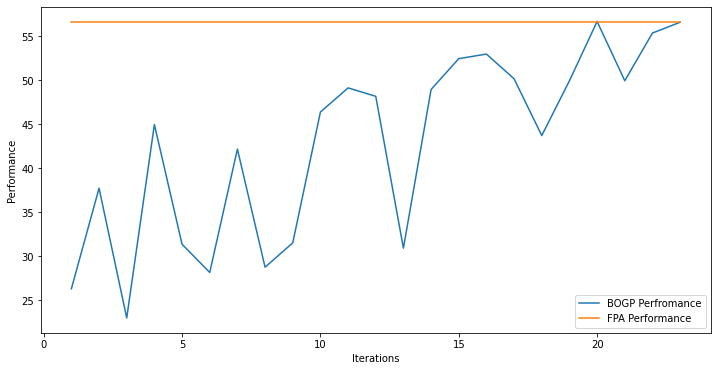

x_next is [ 29.99939267  29.99889299  29.9980083   29.99724165  29.99977619
  29.99989202  29.99905162  29.99978376  29.99893856  29.99803221
 -30.98819819 -30.99881084  29.99921908  29.99942558  29.99944006
  29.99975527  29.9946533   29.99898816  29.99688364  29.99995893]
f()=55.760715, actual=55.872
22


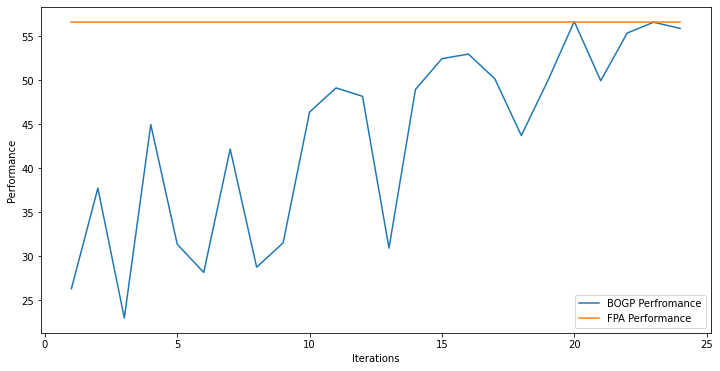

x_next is [ 29.99976197  29.99880656  29.99948797  29.9999815   29.99888256
  29.99964519  29.99861161  29.99981631  29.99933951  29.99979832
 -30.99728528  29.99947292  29.99903142  29.9996962   29.99999741
  29.99877642  29.99929576  29.99741026  29.99994385 -30.99562191]
f()=53.670125, actual=53.792
23


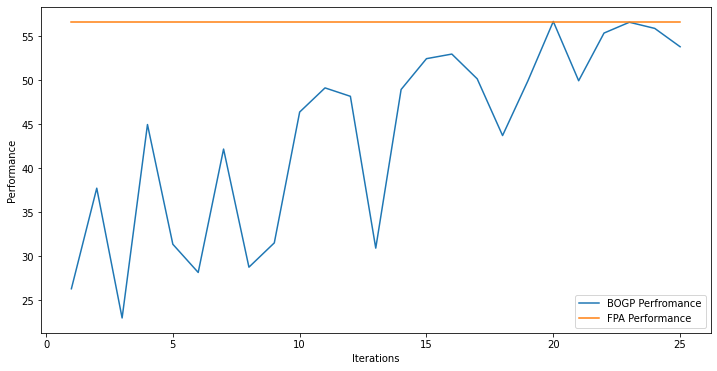

x_next is [ 29.99883734  29.99974538 -30.99314865  29.99942921  29.99419142
  29.99845846  29.99851822  29.99729313  29.99964831  29.99807609
  29.99651364  29.99849971  29.99985721  29.99962434  29.99800521
  29.99992053  29.99986091  29.99399322  29.99744139  29.99966124]
f()=55.639932, actual=56.284
24


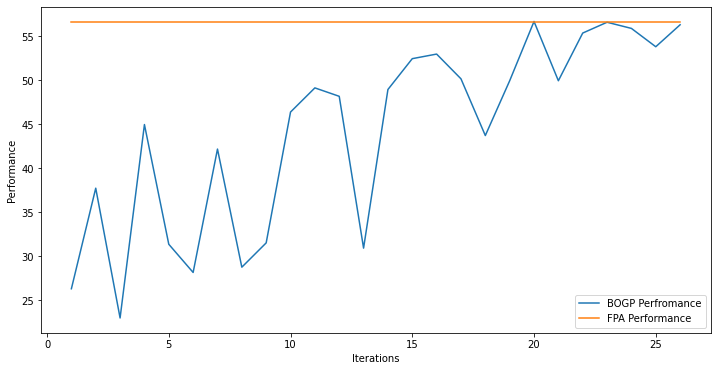

x_next is [ 29.99730194  29.99816081 -30.98677563  29.99986081  29.9991368
  29.99915747  29.99635549  29.99948939  29.99881637  29.99957155
 -30.99269321  29.9737799   29.99541269  29.99915194  29.98863883
  29.99320279  29.99778976  29.9972434   29.99993488  29.99566182]
f()=56.289633, actual=56.363
25


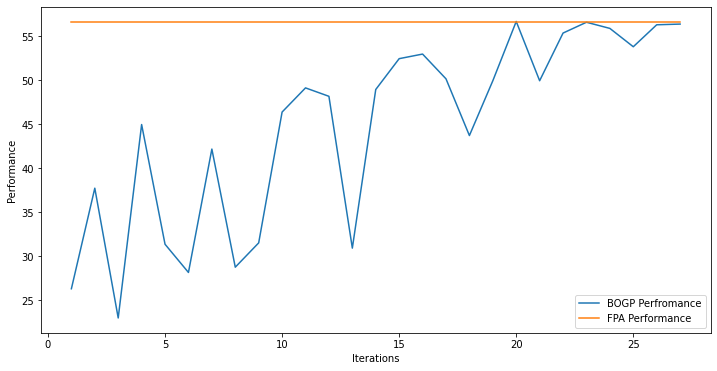

x_next is [29.99236036 29.99845318 29.89148306 29.98821282 29.99087935 29.99108428
 29.97289268 29.98847742 29.99886895 29.99685772 -2.55540474 29.98707042
 29.9875355  29.98636162 29.95445119 29.99221257 29.97096518 29.99097073
 29.99931349 29.99951963]
f()=56.573653, actual=56.640
26


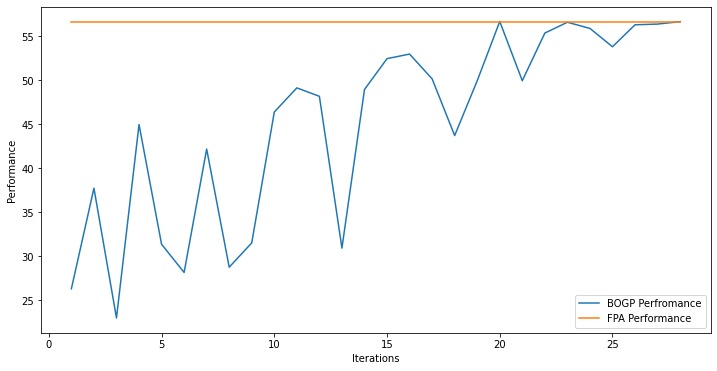

x_next is [29.99416498 29.94142698  3.68448213 29.99376985 29.93923665 29.9952727
 29.99863368 29.95537061 29.96099461 29.97769715 -8.20645974 29.88949045
 29.98737664 29.94516412 29.95350985 29.99517765 29.98735522 29.95230222
 29.95358026 29.99896683]
f()=56.465506, actual=56.348
27


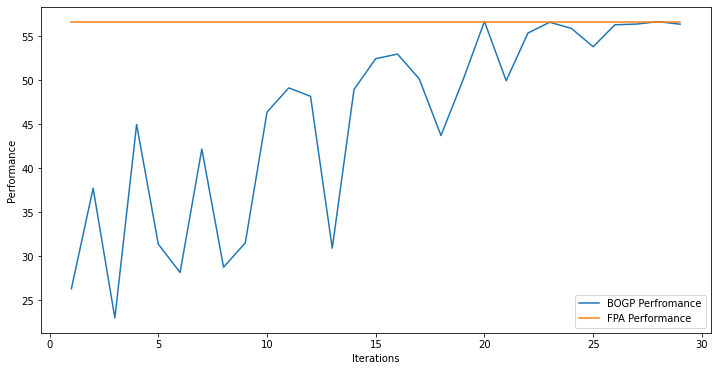

x_next is [ 29.99925761  29.83029439  29.79742542  29.81908797  29.92838666
  29.90190036  29.94176998  29.82827669  29.98191553  29.93832606
 -16.88297618  29.98977602  29.97507493  29.98721251  29.94713534
  29.96787958  29.91520711  29.91661502  29.97551604  29.9482289 ]
f()=56.588797, actual=56.678
28


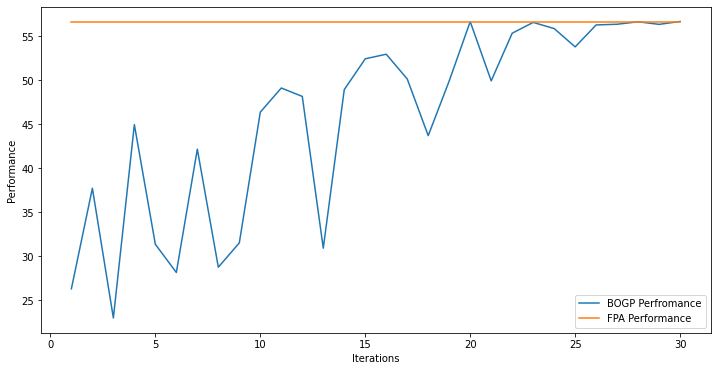

x_next is [ 29.81634776  29.81551799  29.87183562  29.72166878  29.96838435
  29.90298714  29.85154559  29.54604607  29.96687047  29.85941405
 -16.49076696  29.8474388   29.88064749  29.95048648  29.75663612
  29.99722957  29.75206952  29.99611886  29.79659013  29.97078254]
f()=56.608643, actual=56.776
29


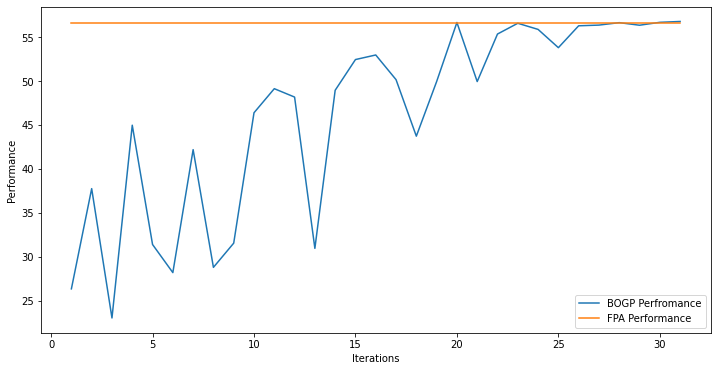

x_next is [ 29.99999952  29.9999966   29.99999524  29.99999868  29.99999857
  29.99999709  29.99999878  29.99982362  29.99994708  29.99993124
 -16.92227634  29.99999875  29.99985301  29.99991882  29.99999395
  29.99999831  29.99994616  29.99999926  29.99999905  29.99999881]
f()=56.776772, actual=56.660
30


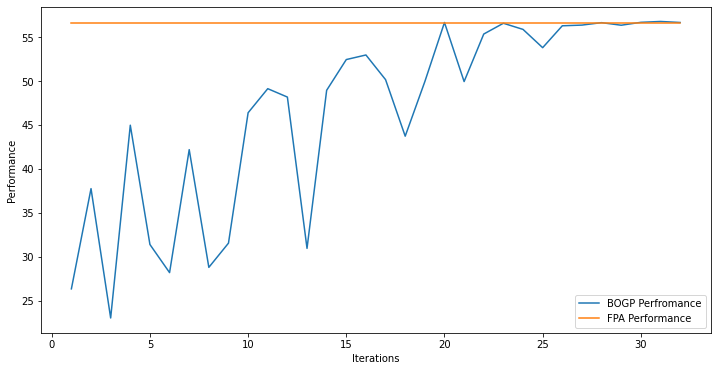

x_next is [ 29.99999993  29.99999863  29.9999982   29.99999973  29.99987001
  29.99999952  29.99999972  29.99999582  29.99999918  29.99999793
 -16.95678098  29.99999685  29.99999724  29.99999949  29.99999889
  29.99999997  29.9999992   29.99999945  29.99999953  29.99999598]
f()=56.741636, actual=56.660
31


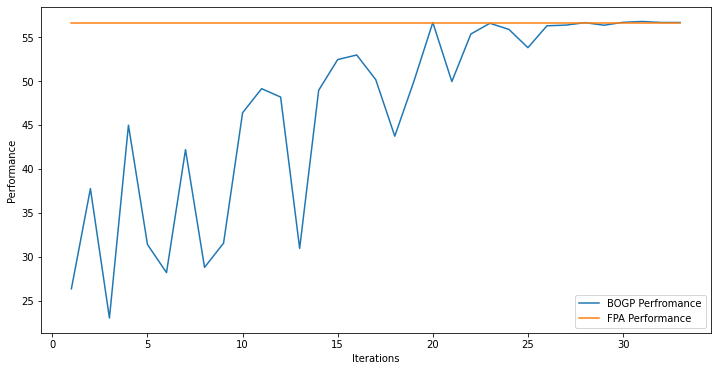

x_next is [ 29.99999963  29.9999995   29.99999949  29.99999965  29.99999996
  29.99999964  29.99999962  29.99999991  29.99999961  29.99999975
 -16.46731222  29.99999935  29.99999979  29.99999975  29.99999953
  29.99999962  29.99999954  29.99999973  29.99999999  29.99999972]
f()=56.724337, actual=56.660
32


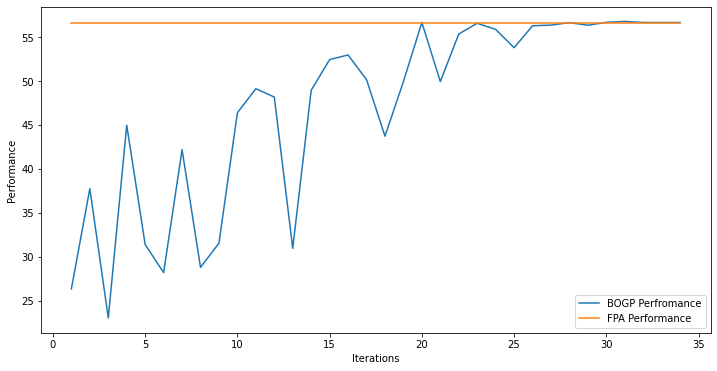

x_next is [ 29.99999842  29.99999987  29.99999999  29.99999843  29.99999997
  29.99999951  29.99979985  29.99999985  29.99999817  29.99999762
 -18.14692128  29.99999555  29.99990545  29.99999994  29.99999714
  29.99999821  29.99999587  29.99999881  29.99999977  29.99999849]
f()=56.712805, actual=56.660
33


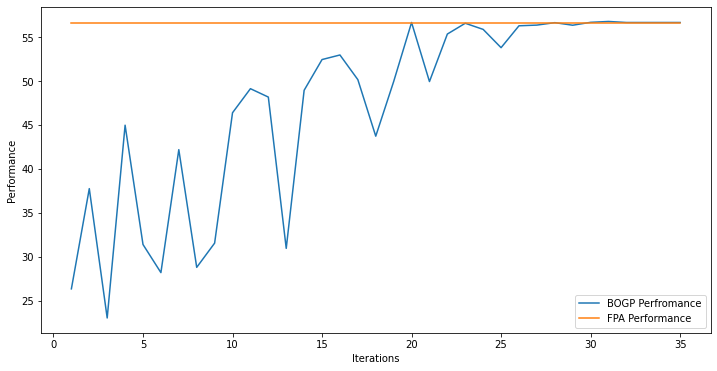

x_next is [ 29.99999699  29.99999865  29.99999899  29.99999954  29.99999995
  29.99999892  29.9999969   29.99999781  29.99999799  29.99999955
 -14.10449918  29.99999838  29.99999959  29.99999491  29.99999873
  29.99999538  29.99999896  29.99988061  29.99999848  29.9999974 ]
f()=56.704445, actual=56.660
34


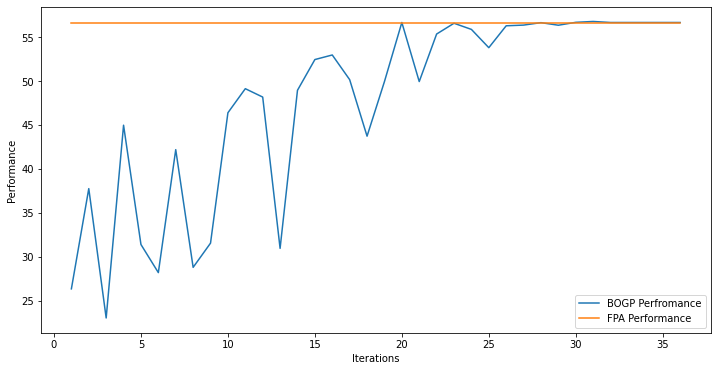

x_next is [ 29.9706155   29.99755117  29.99944034  29.99394275  29.99482815
  29.99862563  29.99669084  20.49051934  29.99934862  29.99865056
 -15.28321667  27.47672778  29.99833269  29.99818231  29.99642006
  29.99838999 -30.9987655   29.99820601 -23.58096552  29.99841316]
f()=59.287688, actual=51.061
35


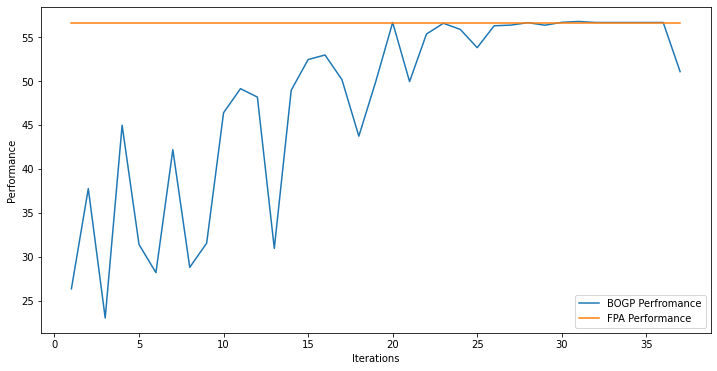

x_next is [ 29.99609581  29.99555655  29.99623878  29.99909057  29.99998174
  29.99852317  29.99527806  29.99051833  29.99751356  29.99716351
 -30.97973561  29.99984711  29.99999977  29.99940466  29.99761839
  29.99871429  29.9998936   29.9963354   29.99579181  29.9995096 ]
f()=47.733319, actual=56.660
36


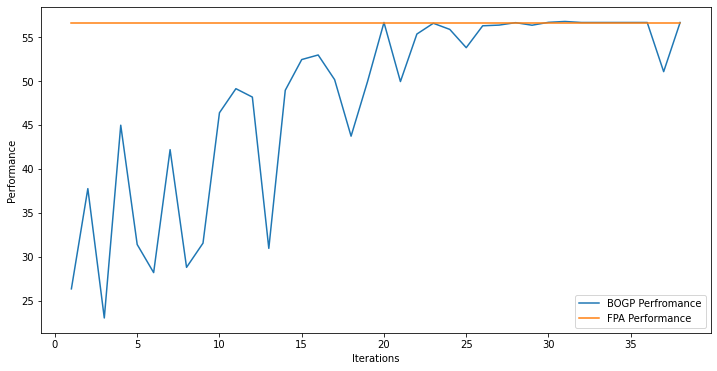

x_next is [ 29.87163467  29.9985354   29.99150894 -10.43073862  29.99969896
  29.99542787  29.99909201  10.80138039  29.99948618  29.99955584
  -5.75014607  14.37228861  29.99887596  29.99506858  16.45883446
  29.99968014  14.23612719  29.99928666  29.99661279  29.99332159]
f()=58.512180, actual=49.068
37


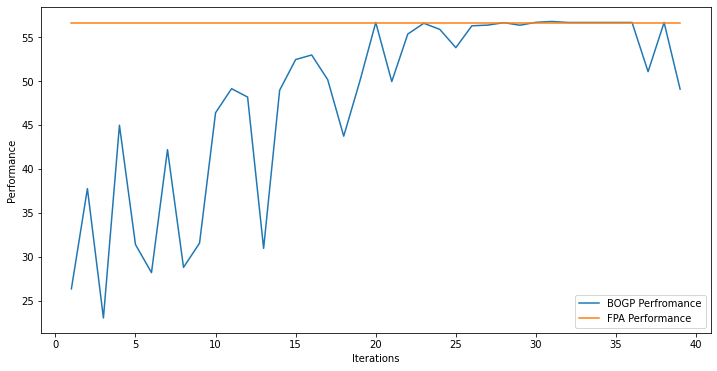

x_next is [ 23.68528585  29.99949973  28.55505362  29.99893876  29.99906233
  29.99735179  29.99443917  15.54766345  29.99986873 -11.83523617
 -24.03049405  18.91132854  29.99488159  29.99794218  24.74499529
  29.99817527  19.77414506  29.99960594  29.99810461  29.99787393]
f()=57.033311, actual=53.557
38


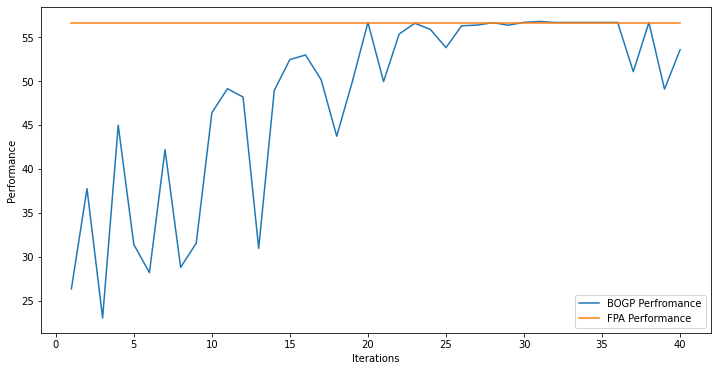

x_next is [ 29.99563164  29.99740542  29.99586456  29.99985984  29.99829094
  29.99997144  29.99855191  29.99992687  29.99892866  29.9980574
 -30.99926931  29.99686441  29.99911033  29.99964861  29.99809423
  29.9900593   29.99906139  29.99995197  29.99816268  29.99731387]
f()=48.138996, actual=56.660
39


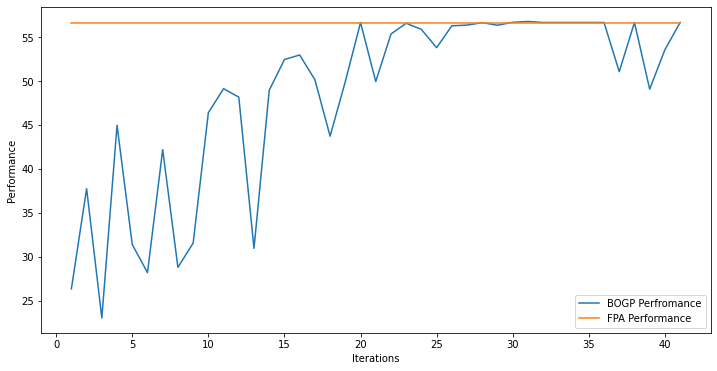

x_next is [ 30.          30.          30.          30.         -30.99999973
  30.          30.          29.99999999  30.          30.
 -30.99999929  30.          30.          30.          30.
  30.          30.          30.          30.          30.        ]
f()=55.829441, actual=53.301
40


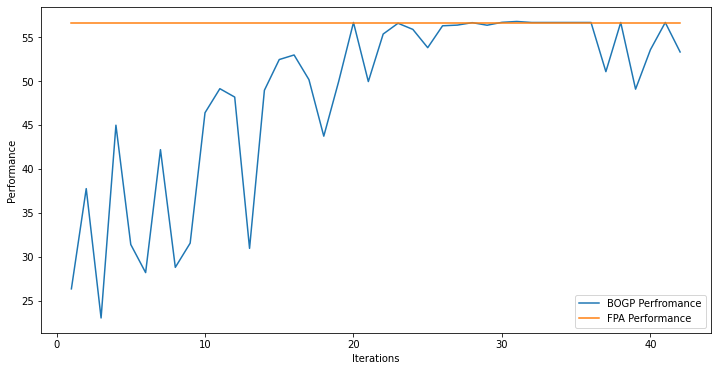

x_next is [ 25.52944985  29.99977129  24.77115354  29.99959355  29.99738211
  29.99512864  -5.29871606  14.06655579  29.99904911  29.99772619
 -19.01950776  16.65378387  29.94572023  29.9965921   23.63403565
  29.9989731   24.53658894  29.99962975  27.01482059  29.99607918]
f()=57.444346, actual=52.417
41


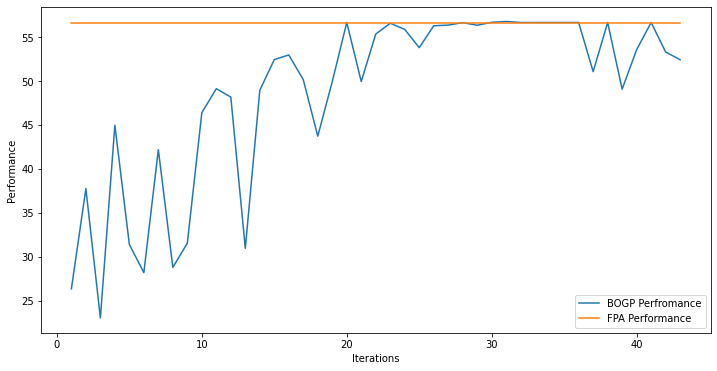

x_next is [ 29.99999954  29.99999992  29.99997286  29.99999984  29.99999946
  29.99999954  29.99999969  29.99999972  29.99999987  29.99999986
 -30.99995756  29.9999306   29.99999979  29.99999974  29.99999984
  29.99999919  29.99999985 -30.99996561  29.99999947  29.99999935]
f()=55.378810, actual=54.087
42


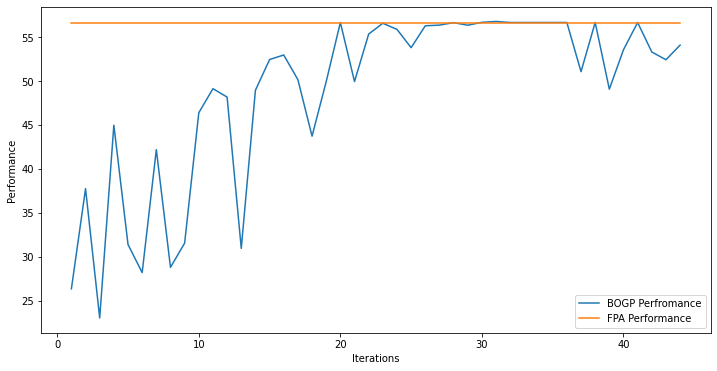

x_next is [ 29.9999995   29.99999977  29.99999954  29.99999915  29.99999778
  29.99999983  29.99999965  29.99999985  29.99999969  29.99999945
 -16.7735775   29.99999997  29.9999999   29.99999935  29.99999989
  29.99999911  29.99999966  29.99999967  29.99999983  29.99999993]
f()=56.704520, actual=56.660
43


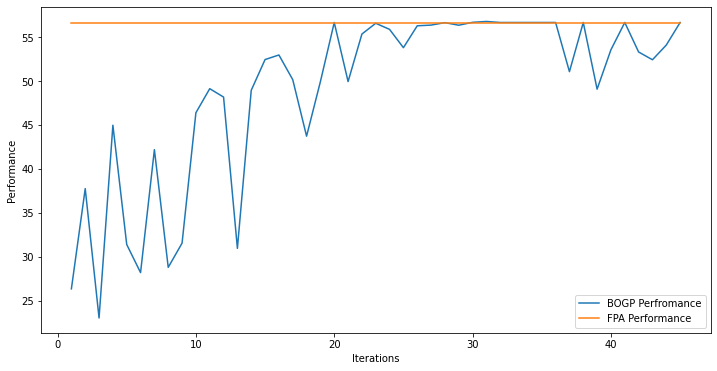

x_next is [ 29.99884894  29.99996264  29.99826554  29.99797532  29.99828428
  29.99613894  29.99867219  29.99998199  29.99836624  29.99851865
 -30.99947479  29.99942349  29.99720255  29.99971607  29.99932048
  29.99664808  29.9969767   29.99976933  29.99881128  29.99411285]
f()=48.863794, actual=56.659
44


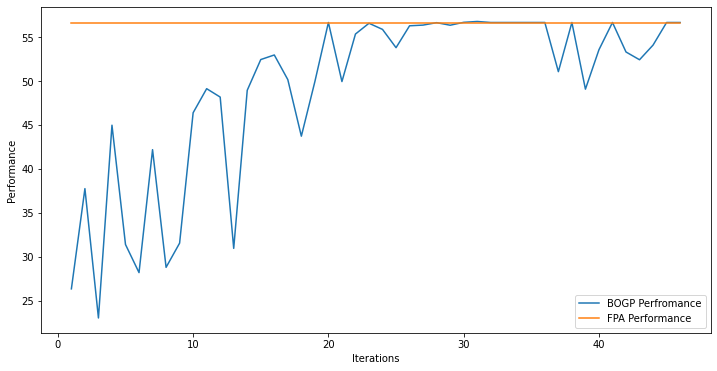

x_next is [ 19.9914031   20.67931324  -0.71287218   8.20565054  -1.07385395
 -10.52324582   5.2086438   -7.6900366    7.84745004  -8.94070825
  -2.64630443  -6.39196782  11.02916944  -9.74869518 -18.99871906
  12.48538838  -7.2831401   11.02217471  17.69615025  -5.66816169]
f()=49.033803, actual=33.210
45


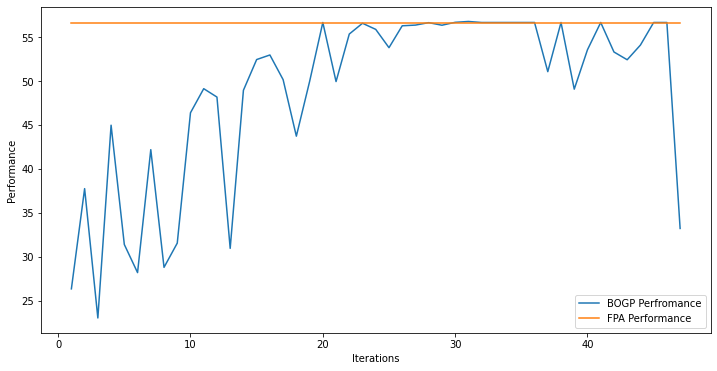

x_next is [ 28.83173478  29.98384727  26.71877406  29.99816531  29.97193743
  29.99383943  29.9983283   15.10387702  29.993315    29.98550596
 -17.97575713  22.38163299   7.60841624  29.99584948  13.62760859
  29.99018388  29.9860558   29.99255972  14.00043975  29.99817599]
f()=58.147079, actual=52.817
46


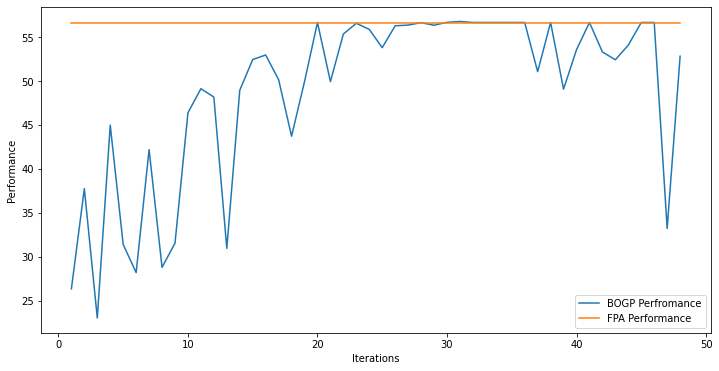

x_next is [ 11.89454716  29.99833922  29.9216985   29.99780365  29.99247569
  29.98810136  29.99390102  17.03844647  29.99632605  29.99972065
 -18.3194001   23.71386232  29.99894951  29.99225993  29.99365313
  29.99386053   9.54700996  29.983063    29.99151345  29.99756227]
f()=58.564428, actual=50.707
47


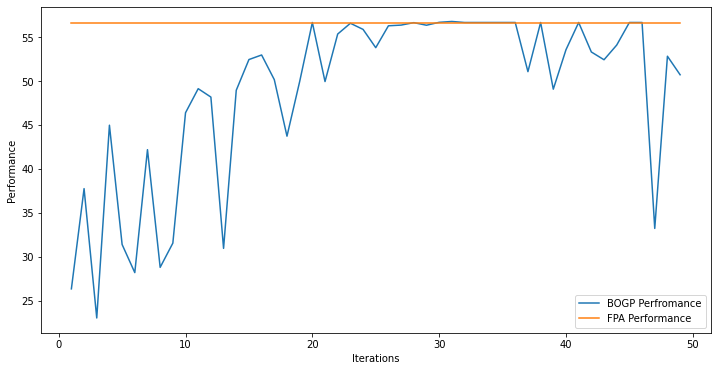

x_next is [ 29.99897663  29.99937069  29.98553521  29.99887895  29.99038882
  29.99156481  29.9992394   29.99916566  29.99632413  26.09872518
 -30.99983338  29.98884228  29.99944962  29.99563799  29.99349979
  29.99992002  29.99910097  29.99907795 -30.98661758  29.98867374]
f()=58.710417, actual=56.115
48


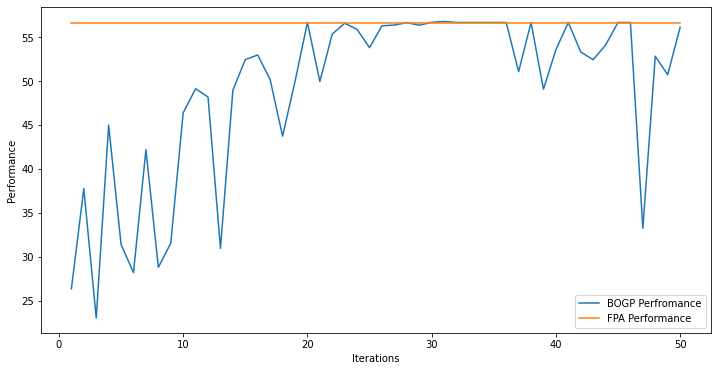

x_next is [29.99890241 29.99923103 24.59458143 29.99782375 29.99675    29.99812221
 29.9979555  29.99644251 29.99932086 20.56259154 16.24193125 29.99688392
 29.99946741 29.98898491  0.84401946 29.99848774 29.9996895  29.99797568
  2.92861219 29.99676269]
f()=57.844813, actual=56.134
49


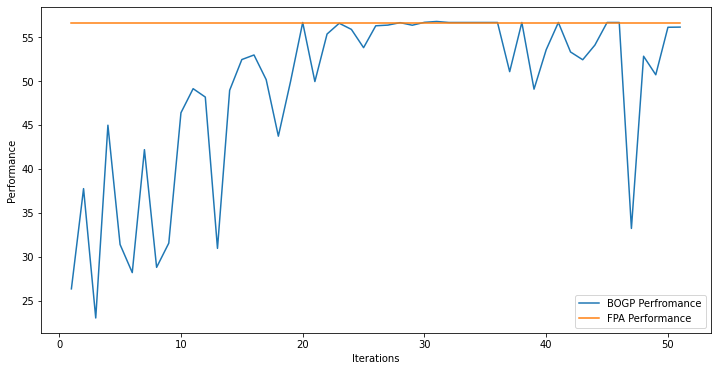

x_next is [ 29.99999996  29.99999952  29.99990819  29.99999981  29.99999982
  29.99999994  29.99999981  29.99999981  29.9999145  -30.99956372
  29.99999984  29.99999985  29.99999989  29.99999978 -30.99988945
  29.99999977  29.99999996  29.99999997  29.9999998   29.99999978]
f()=56.014597, actual=56.414
50


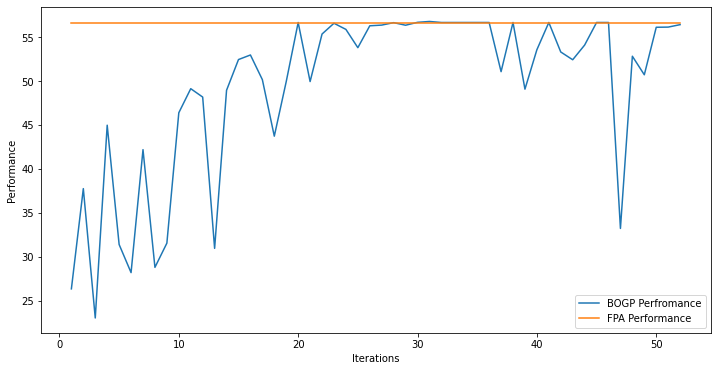

x_next is [ 29.99999993  29.99999985  29.99999948  29.99999983  29.99999948
  29.99999965  29.99999976  29.99999959  29.99999992  29.99999955
 -30.99986315  29.99999977  29.99999963  29.99989824 -30.99995029
  29.99999983  29.99999989  29.99999969  29.99999975  29.99999986]
f()=56.624796, actual=55.848
51


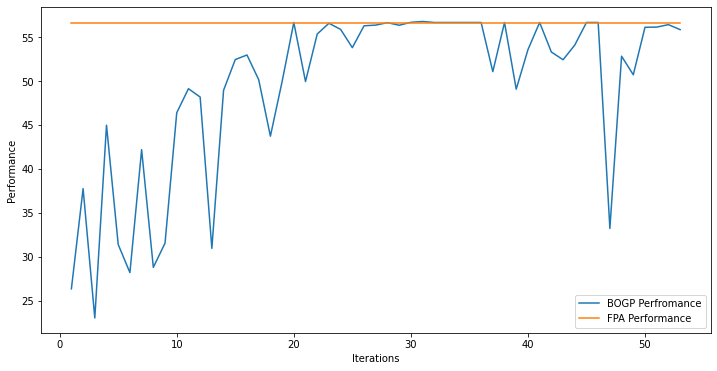

x_next is [ 29.99733574  29.99500363  29.98514716  29.99801376  29.98252684
  29.97993365  29.99108348  29.96133829  29.99894607  22.17998857
 -30.97012362  22.40113865  29.99862554   9.70748862  19.09236083
  29.98985622  29.99591764  29.99182827  12.89452202  29.9914405 ]
f()=57.390605, actual=57.534
52


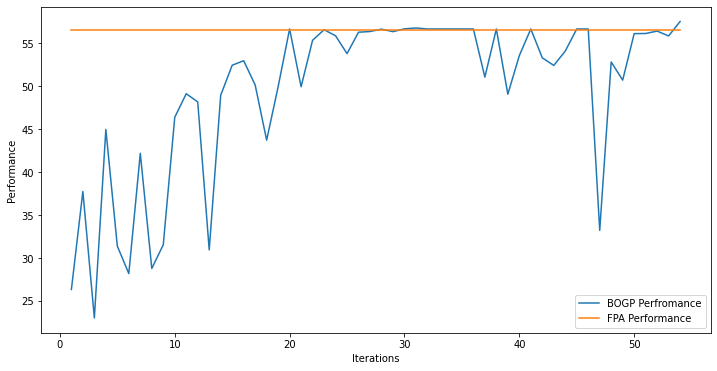

x_next is [ 29.98776454  29.99642867  29.99921988  29.96387348  29.99185463
  29.97223865  29.97582442  29.98781626  29.99734851  20.76288663
 -30.99977335  19.30170679  29.99783692  29.99701007  17.20878487
  29.98115728  29.99823988  29.99711436  12.1525313   29.99930715]
f()=58.175184, actual=58.734
53


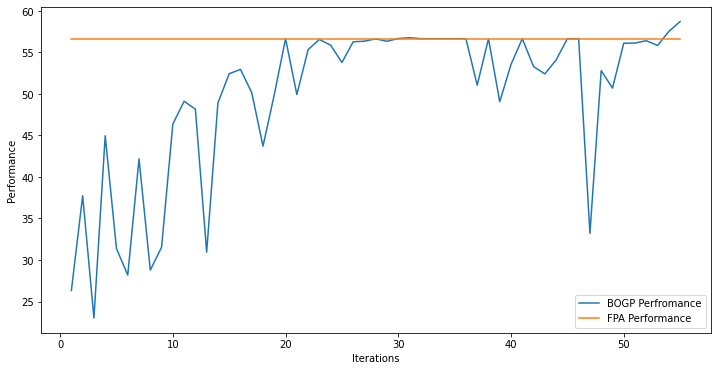

x_next is [ 29.99534128  29.99189406  29.98335655  29.99398868  29.98047854
  29.81795313  29.99272261  22.49744558  29.986593    20.6297938
 -19.61900855  29.32529867  29.99308357  29.9722373   20.80490879
  29.98442509  29.99652202  29.99013372  13.96030175  29.91488306]
f()=58.589633, actual=59.989
54


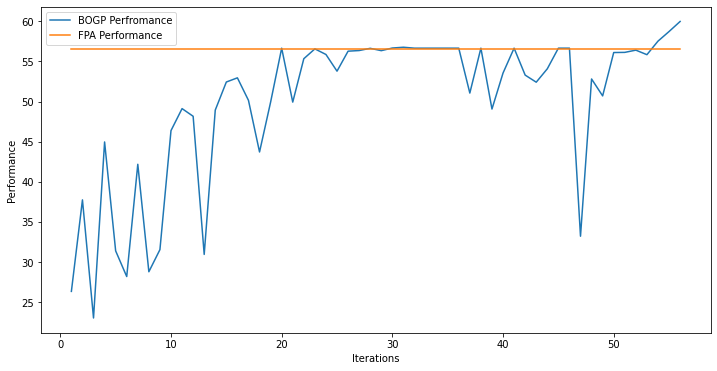

x_next is [ 29.98676874  29.99261046  29.96651362  29.99636968  29.99607551
  21.45259786  29.99763023  16.25951776  29.98854853  18.76888555
 -17.33008159  29.99193329  29.99664909  29.93328175  24.19608616
  29.99685461  29.9974186   29.99256036   9.74644316  29.98974015]
f()=59.720463, actual=59.639
55


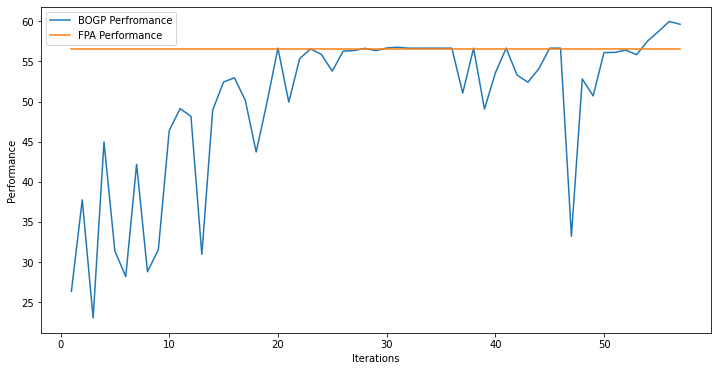

x_next is [ 29.98428041  29.9911396   29.99275419  29.99605191  29.97295636
  29.93421427  29.97437915  16.95260865  29.97251223  18.74353718
 -16.90260753  29.98342298  29.99667483  29.98572883  23.63268575
  29.99658966  29.99997956  29.9935107   10.49598551  23.81100898]
f()=59.829123, actual=58.368
56


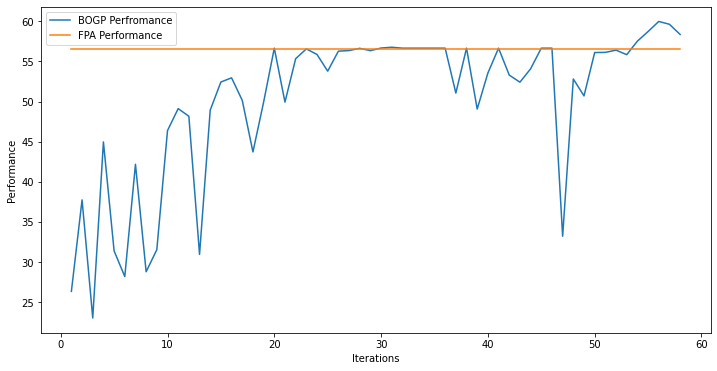

x_next is [ 29.98492997  29.99396503  29.99996254  29.99667122  29.98215816
  15.32464389  29.99869371  27.14363139  29.99606114  17.4666821
 -20.43901494  29.98868432  29.99981384  29.99949341  13.03145278
  29.99864298  29.99931023  29.99697532  15.8916995   29.99802519]
f()=60.114540, actual=59.158
57


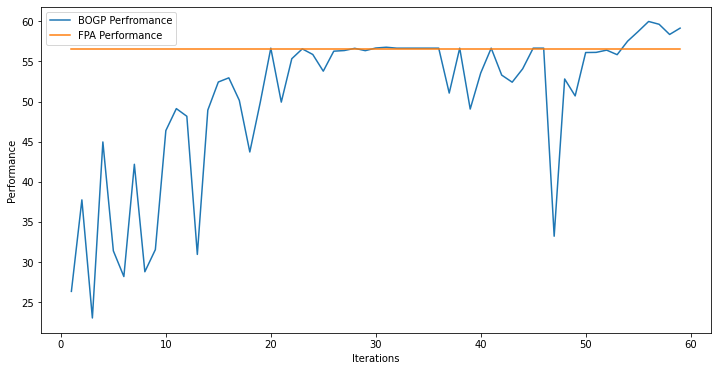

x_next is [ 29.9773362   29.99397929  29.94697862  29.9074717   29.952851
  25.15322249  29.97757353  22.9738533   29.99564058  24.73325499
 -20.74888907  29.98881951  29.99880104  29.92250905  19.77708558
  29.92572197  29.99534105  29.98026105  11.71315227  29.99982959]
f()=59.977950, actual=58.146
58


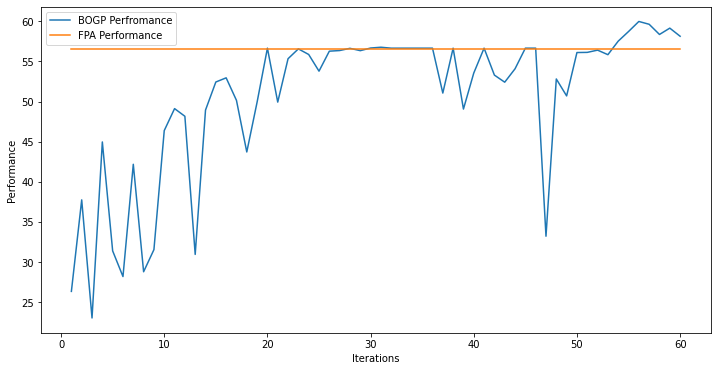

x_next is [ 29.99923056  29.9995043   29.99123098  29.9999182   29.99616238
  29.0664505   29.99938075  29.99606599  29.99350622  -0.1502764
 -11.23782993  29.99839459  29.99933504  29.99929428  29.93248726
  29.99033825  29.99893992  29.99800046   7.28152643  29.99998142]
f()=61.126536, actual=56.839
59


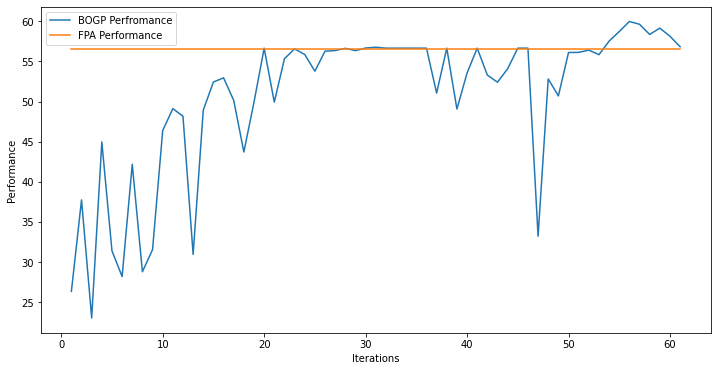

x_next is [ 29.99810688  29.99706807  29.98099487  29.9975856   29.99927211
  29.30806163  29.99931085  16.18819494  29.9960901   10.62242485
 -16.24689787  29.98956443  29.99901459  29.99129607  11.85635029
  29.99925131  29.99972951  29.99808535  26.67181024  29.99873155]
f()=61.135391, actual=58.709
60


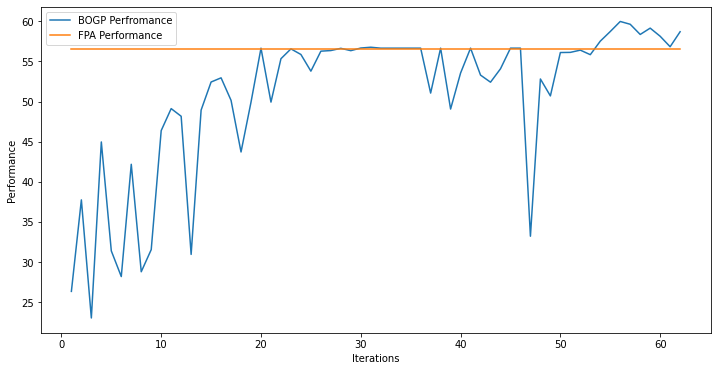

x_next is [ 29.99989414  29.99968244  16.85830483  29.99940333  29.99957484
  -9.36016375  29.99803093  29.99991922  29.99925138   0.34804274
  26.56622385  29.99327599  29.99954657  29.9997974  -23.46102601
  29.99946481  29.99996002  29.99939752  29.99899038  29.99966337]
f()=56.973360, actual=54.214
61


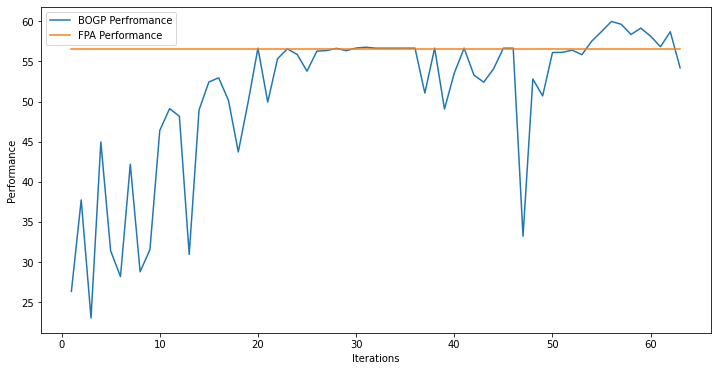

x_next is [ 29.99746174  29.99687916  29.9452083   29.99224832  29.98610198
  27.85419244  29.99397734  20.72891952  29.9934147   13.9705452
 -21.1025292   24.84240008  29.99681286  29.99478122  24.37146372
  29.97812806  29.99608172  29.98226619  17.71029775  29.99697559]
f()=60.618029, actual=60.957
62


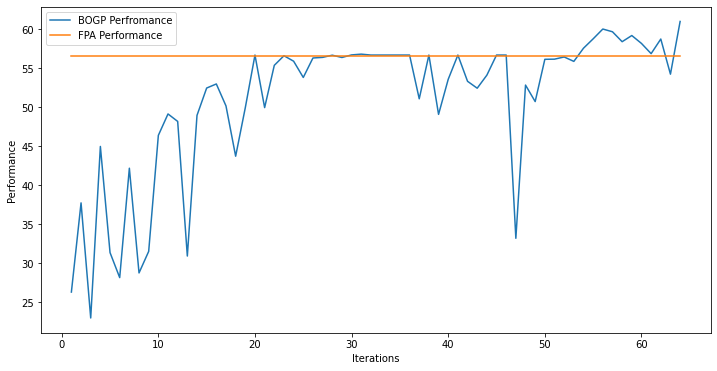

x_next is [ 29.9991678   29.99992932  -9.51587022  29.99956801  29.99833475
  29.99958645  29.99985323  29.99948306  29.99970156  -2.65176361
 -30.99828227  20.70977284  29.9997269   29.99788281 -30.98533157
  29.99949637  29.9983622   29.99967682  29.99942246  29.99903879]
f()=56.298936, actual=55.660
63


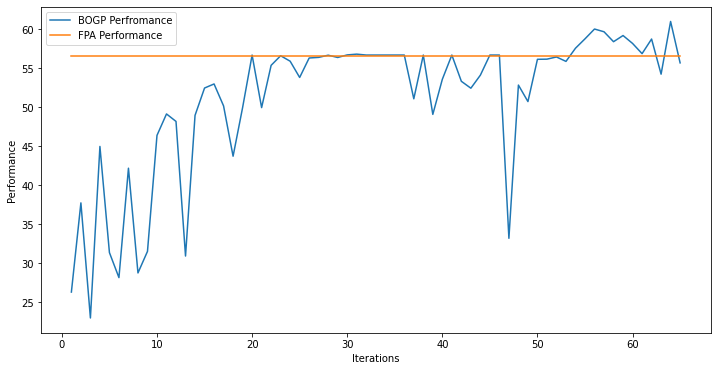

x_next is [ 29.99719808  29.99796605  29.99281553  29.99834945  29.98414451
  27.76598644  29.99806294  20.32044324  23.56809764  13.83528332
 -21.31867403  24.80739442  29.99968557  29.98922239  24.51649994
  29.98690497  29.99950554  29.99644357  17.57089963  29.99921553]
f()=60.467685, actual=60.655
64


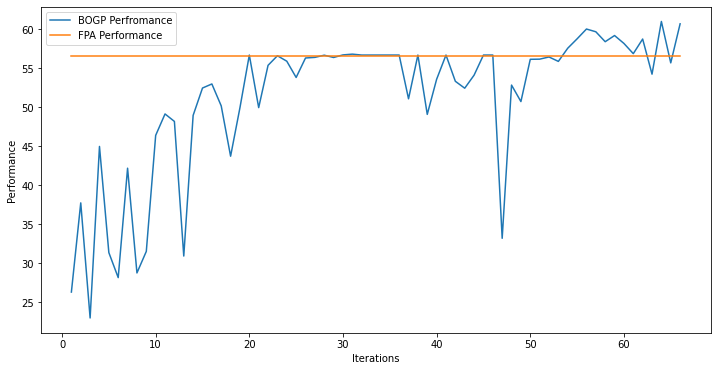

x_next is [ 29.99485517  29.98784961  29.98291733  29.98932231  29.99029573
  26.25753542  29.99522857  18.46447556  29.96552868  11.81914682
 -27.11378149  27.30446032  29.99874071  29.98365279  25.90292088
  29.99682354  29.9968594   29.99943996  16.56903711  29.99750603]
f()=60.691736, actual=61.018
65


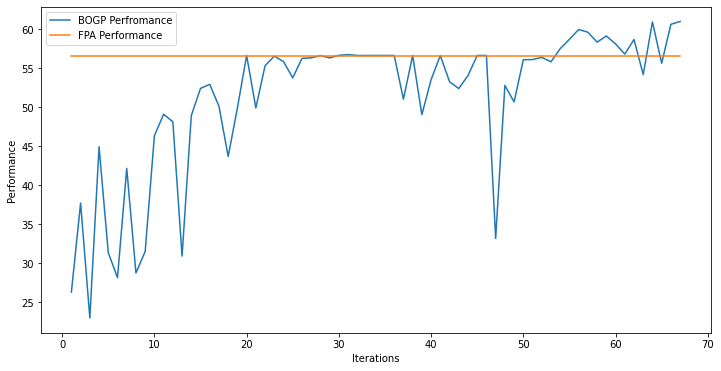

x_next is [ 29.99975729  29.99673941  29.97320537  29.99494507  29.99656229
  16.85258716  29.99738298  14.25290942  29.99708337  10.06968845
 -30.98515299  23.94377576  29.99997002  29.99615806  29.99095161
  29.98927783  29.99929769  29.99805545  15.37444156  29.998113  ]
f()=60.610721, actual=60.157
66


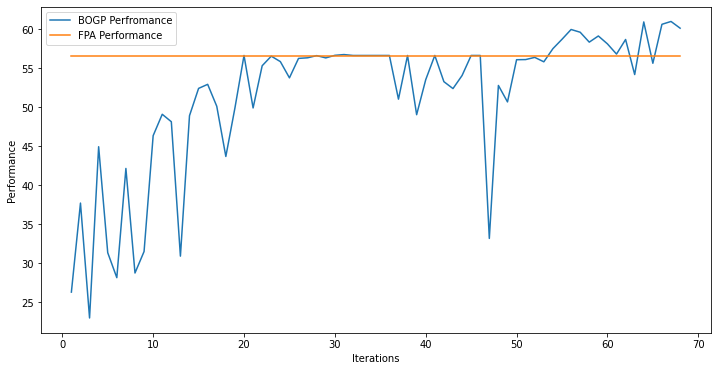

x_next is [ 29.99764396  29.9951554   29.97727032  29.98960831  25.30625322
  29.08316689  29.97734028  19.93584211  29.94072106  12.47829887
 -25.09900698  27.90062475  29.99502298  29.98644989  24.57578238
  29.99167925  29.99987126  29.99502455  16.97928894  29.99882672]
f()=60.867720, actual=60.148
67


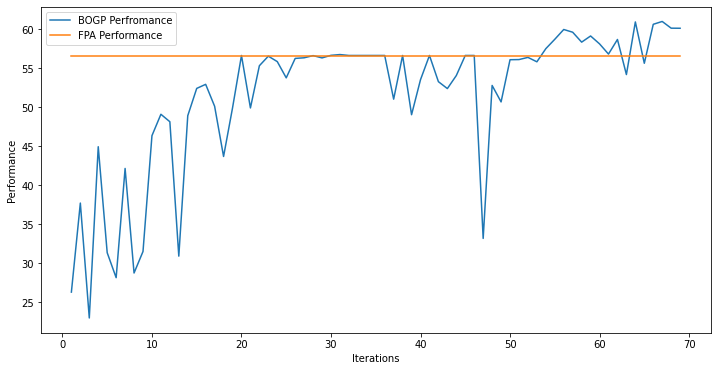

x_next is [ 29.99185297  29.98611359  26.26185295  29.99437864  29.99861133
  26.61388978  29.97693237  19.91755691  29.92175535  12.55214947
 -24.57346111  27.76863391  29.99906996  29.97862511  24.87842637
  29.99117301  29.99117767  29.99675684  17.09729189  29.99919106]
f()=60.922258, actual=60.526
68


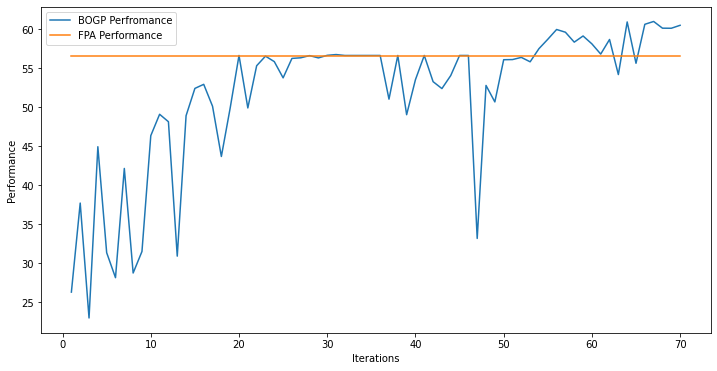

x_next is [ 29.99921776  29.99844373  29.99114928  29.99511697  29.99857353
  28.19750773  29.98072307  18.30078083  29.97025614  12.74924711
 -25.68821844  25.69179853  29.99911424  29.96936137  25.85044675
  25.93524956  29.9968602   29.99993285  16.49836431  29.99977613]
f()=60.867172, actual=60.287
69


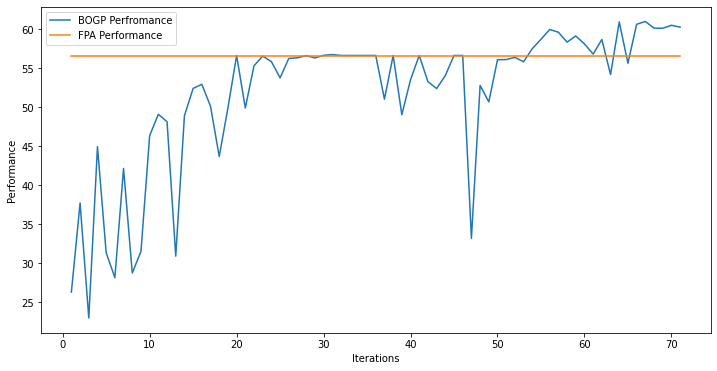

x_next is [ 15.21964671  29.99981668  15.54580123  29.99999833  26.1089842
  27.81891965  29.99988335  29.99986893  29.99986993   4.43389405
  10.53226441  18.70973613  29.99995007  29.99989451 -17.83308718
  28.81101666  29.9999271   17.42502657  29.99995144  29.99958695]
f()=59.279055, actual=53.903
70


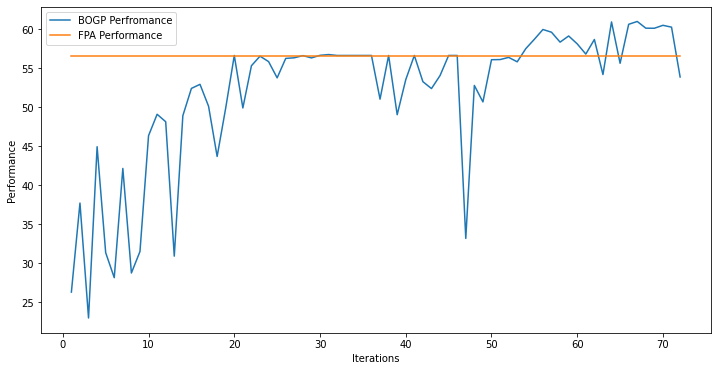

x_next is [ 29.99988379  25.96257962  29.99953936  29.99390821  29.99281888
  26.12291327  29.99702992  20.32527303  29.82505388  12.17990945
 -24.73626567  26.98911686  29.99881445  29.98443258  24.66756214
  29.9996199   29.99344583  29.99541768  17.40244944  29.9957968 ]
f()=60.801628, actual=60.278
71


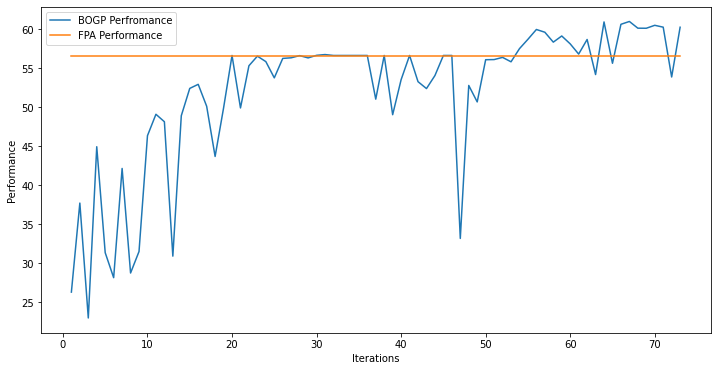

x_next is [ 29.99661962  29.99930666  29.99868963  26.29803532  29.99925973
  26.12564734  29.98939322  19.47824295  29.84383794  12.48973729
 -25.20578105  26.7460784   29.9965674   29.99812437  25.06239543
  29.99558457  29.9937232   29.99891038  17.07976231  29.99470853]
f()=60.875558, actual=62.326
72


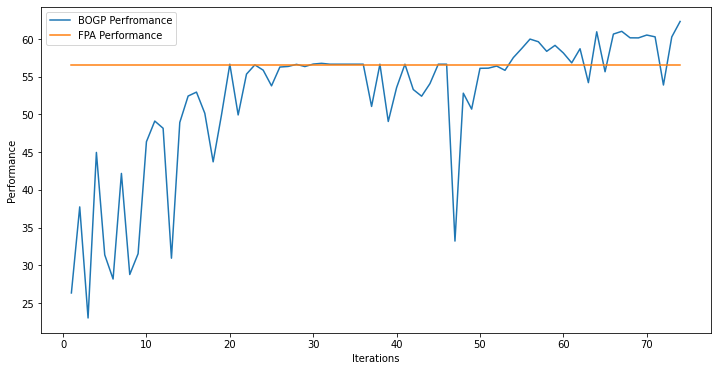

x_next is [ 29.99830221  29.99798409  29.99881137   4.11782046  29.99936648
  25.4623534   29.99896519  22.78071282  29.99904816   7.97602885
 -30.99806432  29.99864932  29.99967588  29.9941771   26.94412041
  29.99965797  29.9992912   29.99903481  15.06201466  29.99842727]
f()=63.960555, actual=59.467
73


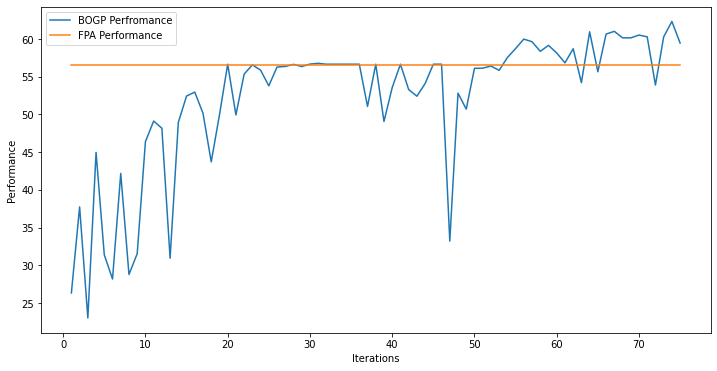

x_next is [ 28.9123059   27.62895648  29.80125129  29.20302976  28.66306593
  28.6461469   29.67731355  28.43820413  29.57809562  29.87073908
 -30.82616602  29.63765236  28.56435661  29.50413412  27.43163412
  28.4922053   29.66099867  26.27240766  28.9229508   29.13886557]
f()=53.555863, actual=55.270
74


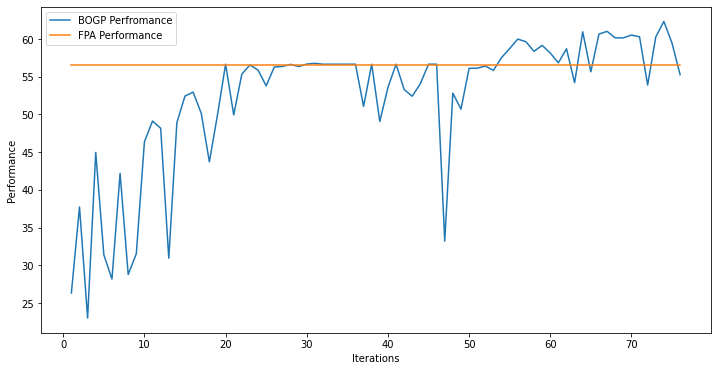

x_next is [ 29.99182147  29.99913112  29.99522986  19.20178377  29.99991236
  24.98280538  29.99609322  19.61374222  29.97845019  12.48319695
 -23.6033426   25.42702833  29.99867442  29.96222659  24.46509703
  29.99642932  29.99539436  29.9981079   17.77612719  29.99926498]
f()=63.036384, actual=62.494
75


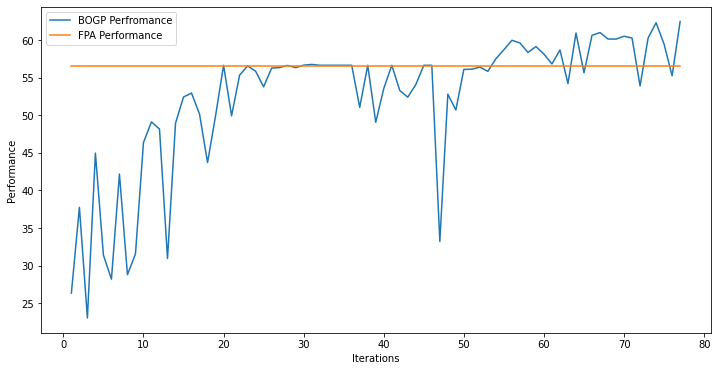

x_next is [ 29.99740627  29.99631209  29.9995398   21.65262358  29.99606281
  25.95475956  29.95163403  21.11017482  29.55210027  12.45217621
 -25.41625079  28.62767329  29.99707688  29.95465288  25.44399023
  29.99730705  29.99647689  29.99634618  17.33882743  29.99875896]
f()=62.715587, actual=62.989
76


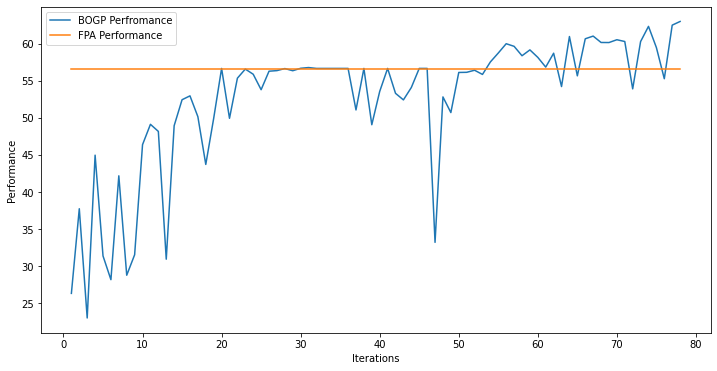

x_next is [ 29.99683892  29.99964075  29.9986129   21.25245241  29.99981938
  25.91400859  27.93523223  21.93327057  29.09167944  12.22939324
 -24.97850512  29.66946422  29.99850317  29.97654427  25.73402452
  29.99934681  29.99531998  29.98978464  17.94026204  29.99509112]
f()=62.902384, actual=62.892
77


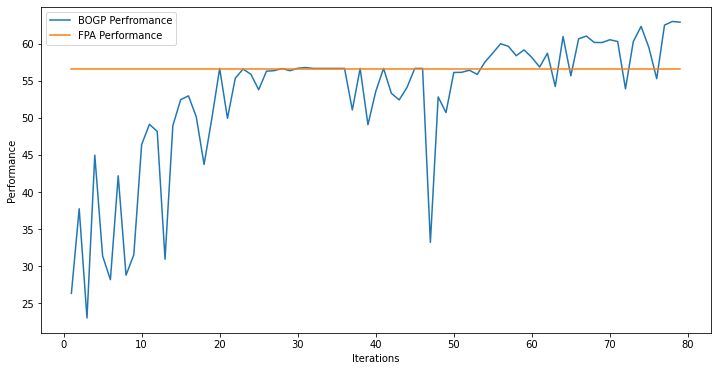

x_next is [ 29.99138278  29.98881769  29.99989641  21.15079065  29.99834181
  25.70427228  29.99163124  20.86135692  29.7034746   12.7114539
 -24.89077917  29.87218223  29.99828072  29.99037759  27.17045998
  29.99948692  29.99880487  29.99440059  18.30539561  29.99759567]
f()=62.937565, actual=63.402
78


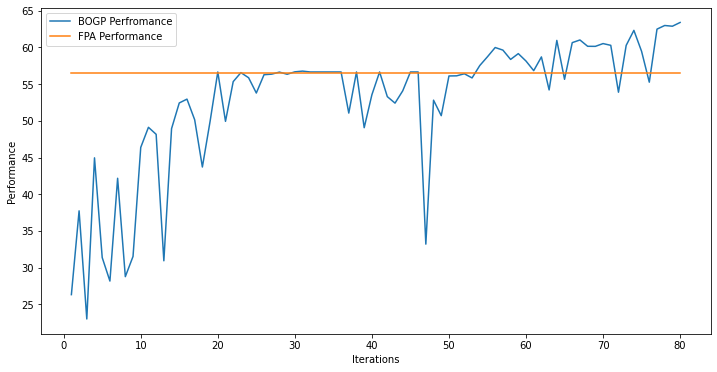

x_next is [ 29.99785741  29.9972966   29.99913513  20.13244342  29.9973807
  24.08656168  29.99592581  18.68506865  29.93986089  12.81599248
 -23.26194547  29.99937005  29.99908502  29.99318742  29.99613211
  29.99943198  29.99528293  29.99852716  21.30088855  29.99988911]
f()=63.646944, actual=63.684
79


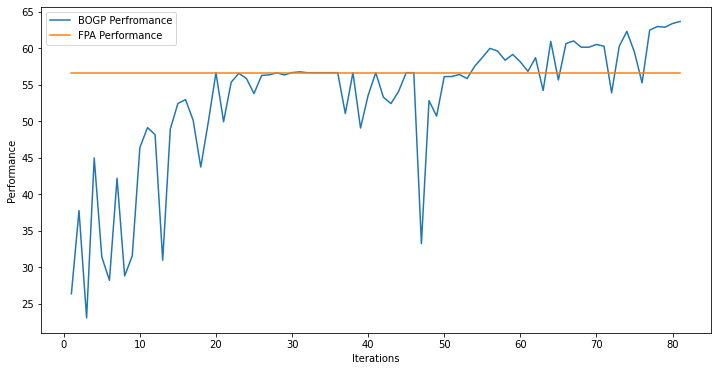

x_next is [ 29.98926189  29.99934181  29.99092052  20.10218896  29.99886314
  26.66617801  29.99955854  18.81425179  29.97217568  13.36084331
 -23.4197238   29.98987732  29.99976002  29.98615966  29.99556885
  29.99983925  29.99985663  29.99752795  19.83229969  29.99908548]
f()=63.657000, actual=63.702
80


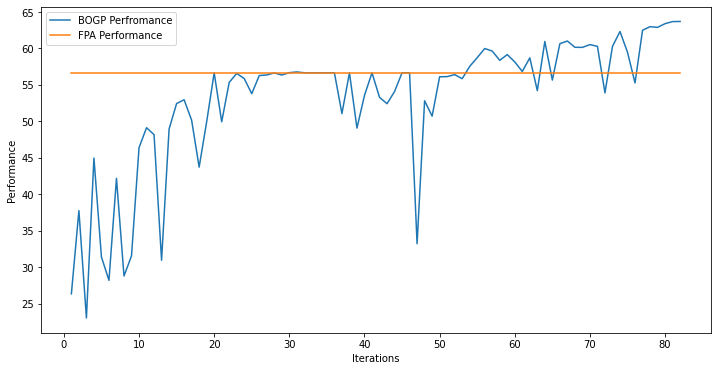

x_next is [ 29.99117681  29.99415122  29.99611252  20.11124732  29.99346759
  25.41821169  29.99597114  19.2341855   29.94088547  13.2708541
 -23.24992962  29.99177162  29.99298948  27.87796988  29.99820935
  29.99612005  29.99926094  29.99370245  20.14283629  29.99667908]
f()=63.627423, actual=63.726
81


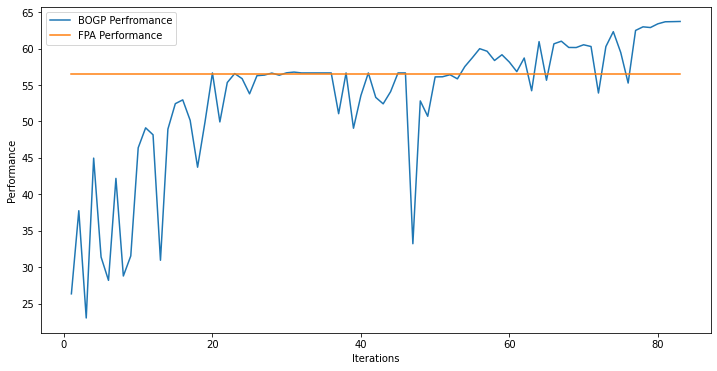

x_next is [ 29.98331287  29.9908929   29.99761496  20.07199303  29.98832256
  25.05343476  29.97918609  20.33044365  29.93381589  13.42146899
 -22.35087222  29.99041502  29.99986779  29.23302631  29.98862573
  29.99483163  29.99581397  29.99239481  19.46019225  29.9979055 ]
f()=63.695791, actual=63.907
82


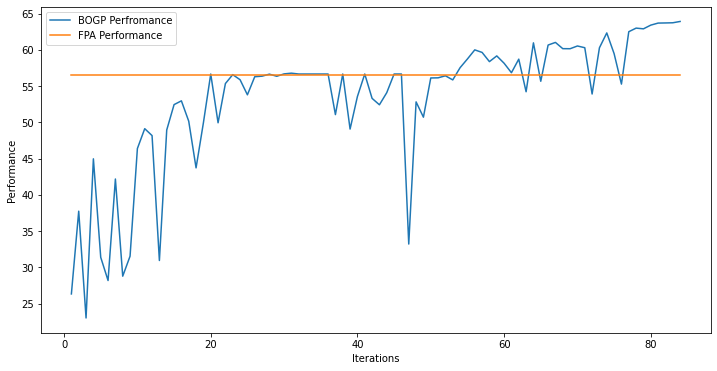

x_next is [ 29.98322419  29.99942452  29.99556705  19.21002499  29.99470882
  24.53396923  29.99973417  21.72833613  29.88406751  13.58614569
 -19.7871853   29.99881623  29.99481537  29.73197971  29.99366772
  29.99044678  29.99849232  29.99525319  19.52779803  29.99897604]
f()=63.916869, actual=63.945
83


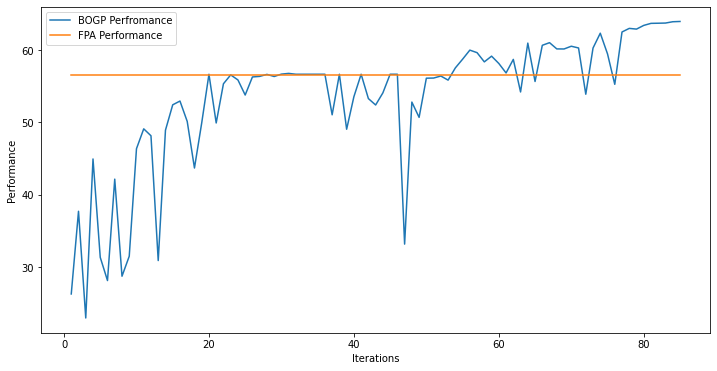

x_next is [ 29.99872608  29.99441366  29.98018893  19.58315921  29.99862057
  23.74347849  29.97468875  20.85434333  29.96961299  14.1325915
 -20.82494253  29.99874836  29.99614714  29.90242949  29.9965428
  29.99751901  29.99614658  29.99944958  18.5798029   29.98890511]
f()=63.940288, actual=63.933
84


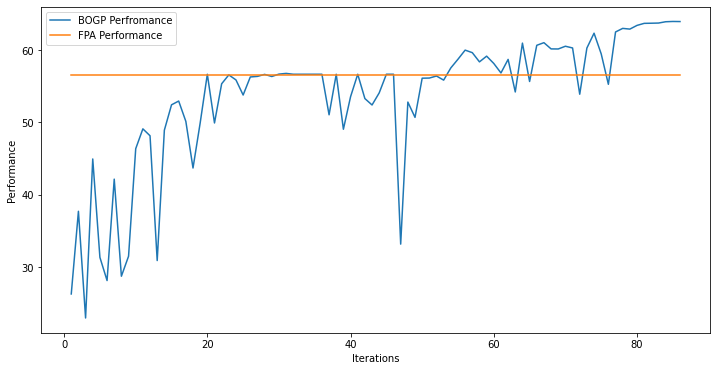

x_next is [ 29.97355047  29.99778022  29.99805368  19.80192432  29.99029071
  24.50924772  29.99623016  22.34398981  29.97794311  13.93143414
 -21.46927777  29.93831039  29.996167    29.64434804  29.9620894
  29.9976944   29.99913698  29.99710071  19.60041514  29.99103191]
f()=63.937291, actual=64.097
85


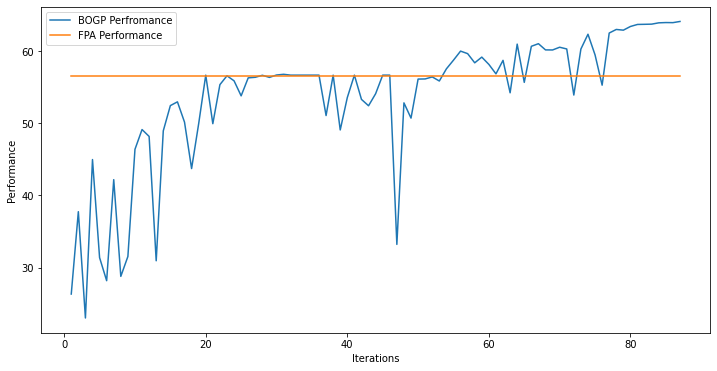

x_next is [ 29.98629658  29.99976914  29.9809295   18.80010361  29.99707506
  23.87221251  29.99932471  25.23691775  29.983533    14.44958687
 -22.4066837   29.9640454   29.99957592  29.8934368   29.99998442
  29.99476378  29.99781748  29.99833069  20.61744363  29.99769908]
f()=64.117929, actual=64.202
86


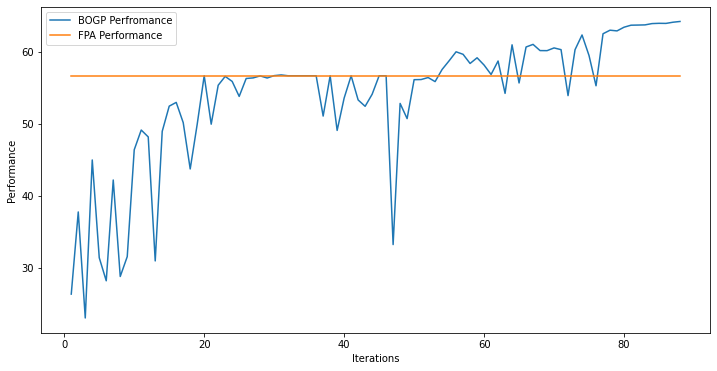

x_next is [ 28.53139624  29.99301046  29.99419958  19.08883324  29.9968895
  23.76939203  29.99595727  24.74543144  29.99631747  14.49868996
 -22.42233479  29.9532565   29.99987516  29.95315524  29.99605358
  29.9883098   29.99968523  29.99756117  20.17450838  29.99984702]
f()=64.131051, actual=64.407
87


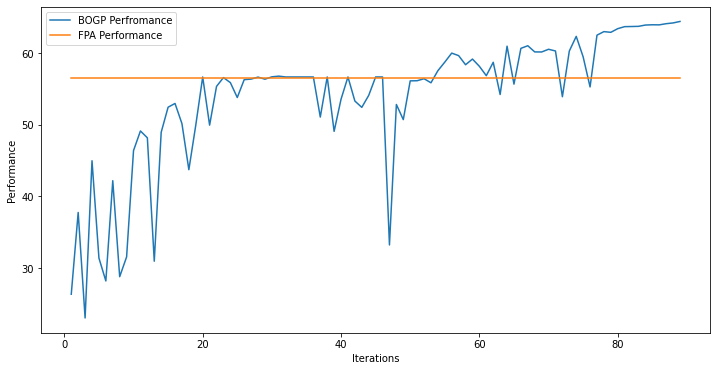

x_next is [ 22.49848967  29.99668485  29.99981444  18.25246594  29.99846793
  23.49101604  29.9987568   26.17173016  29.99000347  14.15066878
 -22.47904996  29.97564653  29.99797101  29.97253913  29.99545738
  29.99935995  29.9973621   29.99909839  20.68849653  29.99921455]
f()=64.534749, actual=63.921
88


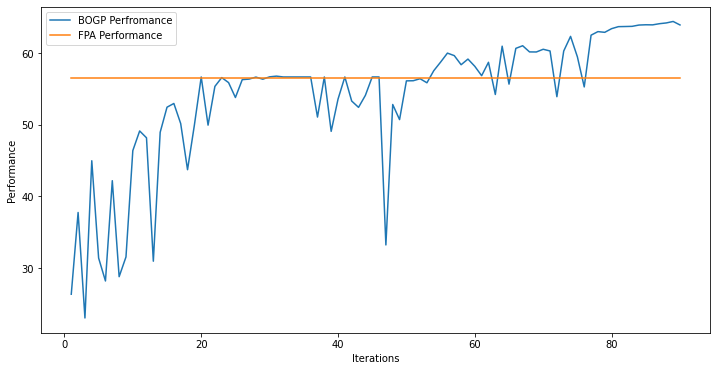

x_next is [-10.28159168 -17.23978469   6.76261146 -23.80921993  -5.57457004
 -28.80294651  -0.18695156  -3.25125205 -24.92466048 -16.66018821
  19.1757199   13.60915678 -30.12549605  -2.02360395  -7.16928914
 -18.99386031  12.15508837   5.92675483  -6.53266609  16.56952846]
f()=54.004752, actual=18.647
89


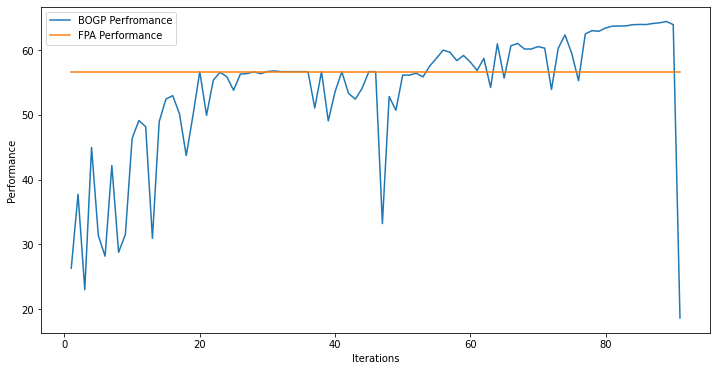

x_next is [-29.42335076  10.62274101  20.99689287  -6.03288358 -24.94153605
  -1.14738191  -7.76848243   6.69718929 -24.06083643   3.4947843
  -0.37112243 -25.91269083 -13.16310222 -18.75969362   0.58326967
  16.93678423   4.12713518 -11.32682998  12.83987886   4.30641342]
f()=53.613454, actual=24.688
90


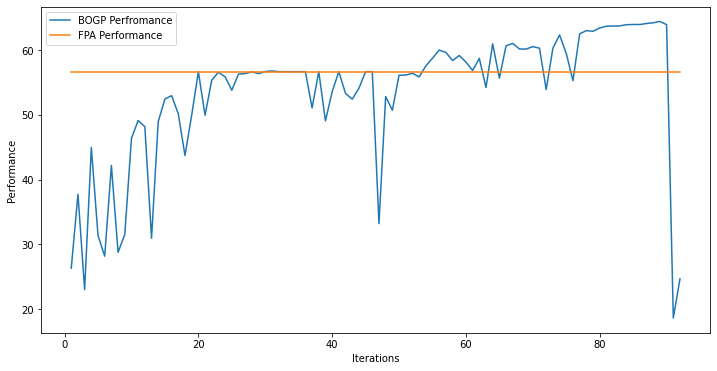

x_next is [ 26.91476436  29.99884001  29.99306542  19.27483938  29.99704075
  24.28383042  29.98908434  24.04381475  29.99635614  15.05503942
 -22.94774303  29.97072461  29.9887028   29.94738385  29.98678135
  29.99499376  29.99730046  29.99662556  19.84126122  29.98768714]
f()=64.448928, actual=64.519
91


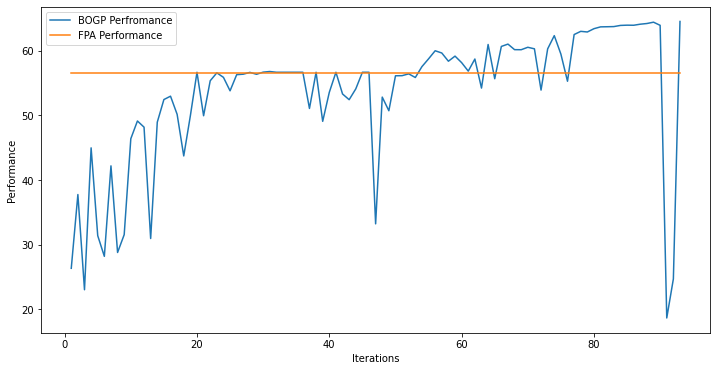

x_next is [ 26.8126144   29.99506126  29.98321675  18.64871338  29.99981622
  24.47473571  29.99964054  24.14429505  29.91150052  15.67776057
 -22.7073001   29.95806671  29.99515726  29.99799753  29.98836463
  29.99174707  29.99486605  29.98612521  19.84048227  29.99954201]
f()=64.508128, actual=64.489
92


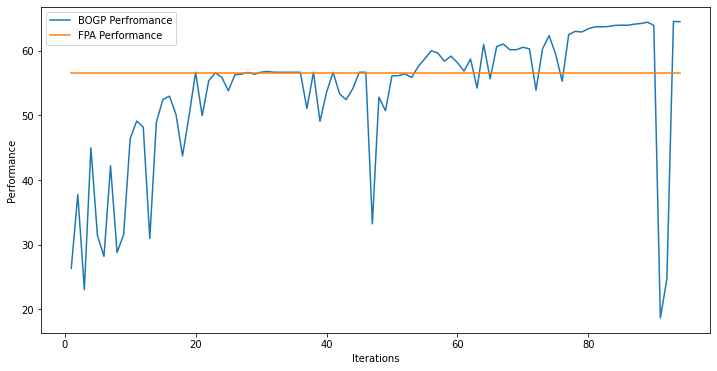

x_next is [ 26.70591142  29.99626042  29.99228034  19.42272989  29.99349499
  24.08809122  29.98145644  23.81762902  29.92092373  14.98923363
 -23.09591674  29.70187141  29.99868825  29.92918454  29.99111062
  29.95944864  29.99820434  29.97588133  19.61233315  29.99276534]
f()=64.504968, actual=64.509
93


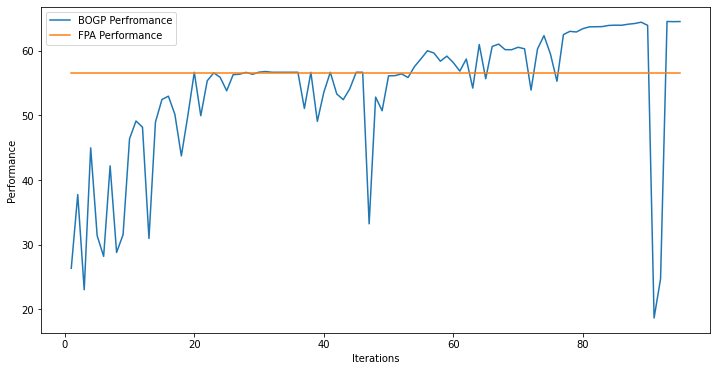

x_next is [ 26.74393864  29.9870714   29.99721469  19.73928714  29.98372374
  24.25340162  29.95690403  23.62529611  29.93833841  15.28322316
 -22.82247324  29.94341872  29.98147214  29.95237521  29.99548179
  29.99749939  29.99076002  29.99516217  19.97866321  29.99167939]
f()=64.503547, actual=64.556
94


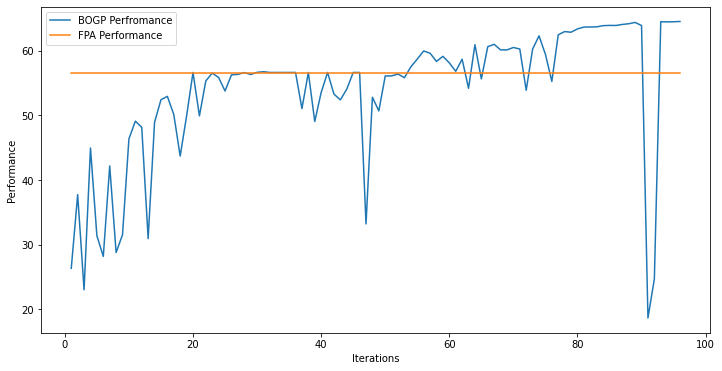

x_next is [ 26.31405182  29.9947095   29.97645944  20.22774944  29.99639204
  23.72600879  29.9876956   23.4531028   29.93668759  15.7029176
 -22.31920836  29.90596416  29.9968956   29.91817894  29.99669535
  29.99740647  29.99503737  29.99604048  20.52538375  29.98452133]
f()=64.575835, actual=64.582
95


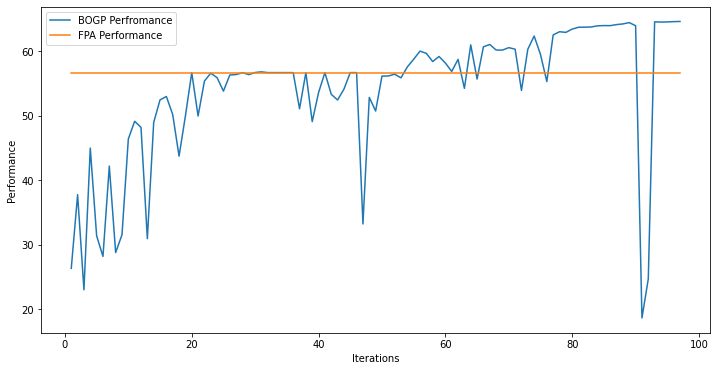

x_next is [ 26.77353077  29.97669007  29.99228192  20.22512319  29.99543632
  24.08640772  29.99719967  23.6911212   29.21477127  15.57787174
 -22.30617286  29.94503885  29.9693413   29.92106075  29.9866934
  29.99416266  29.99258988  29.99738571  20.55538788  29.99069775]
f()=64.560411, actual=64.554
96


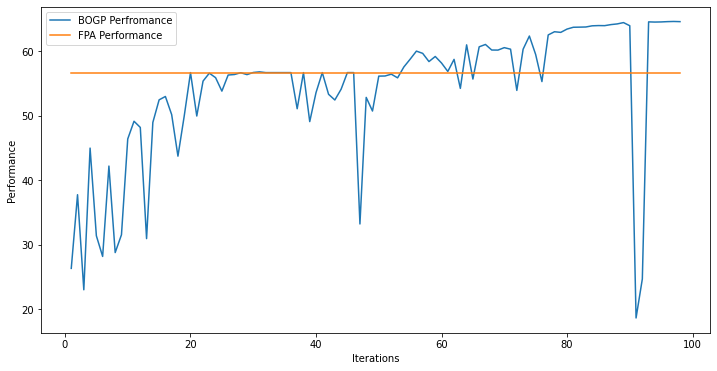

x_next is [ 26.52224774  29.9999416   29.99990393  20.17619868  29.99978401
  23.92929013  29.99966586  23.3797758   29.99931945  15.66066666
 -22.47708459  29.99982135  29.99998762  29.99930102  29.99995786
  29.99986855  29.99981554  29.99988923  20.47366096  29.99980238]
f()=64.597159, actual=64.603
97


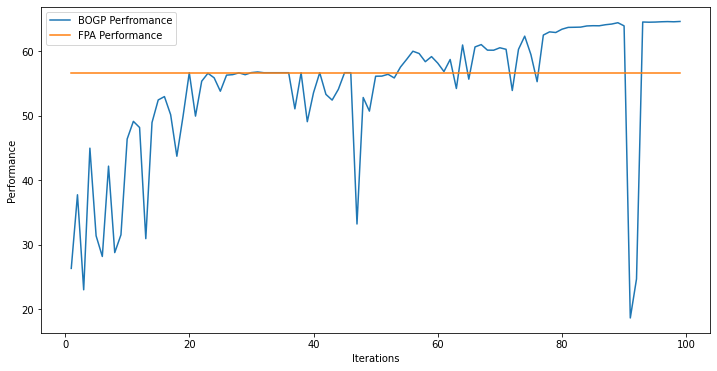

x_next is [ 26.61330453  30.          30.          20.17122319  30.
  23.95795856  30.          23.27226998  29.99999999  15.68377887
 -22.6214277   30.          30.          30.          30.
  30.          30.          30.          20.61515244  30.        ]
f()=64.604568, actual=64.598
98


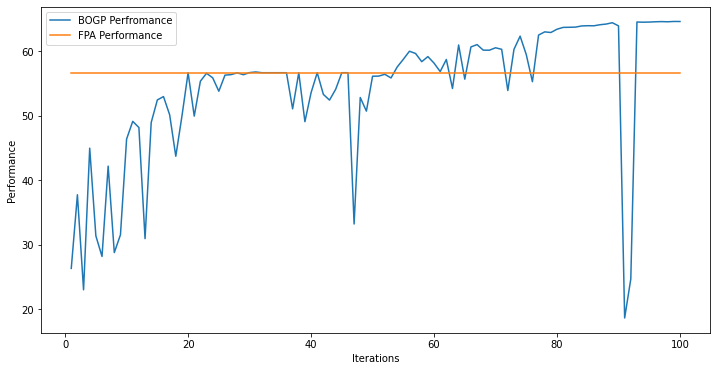

x_next is [ 26.56889973  29.99275899  29.99625138  20.29222822  29.97846004
  24.05338102  29.99969124  23.4444636   29.91667407  15.57010021
 -22.20242845  29.98206859  29.98863346  29.95708672  29.99502519
  29.99227481  29.98889988  29.99931313  20.38393785  29.99369466]
f()=64.590483, actual=64.613
99


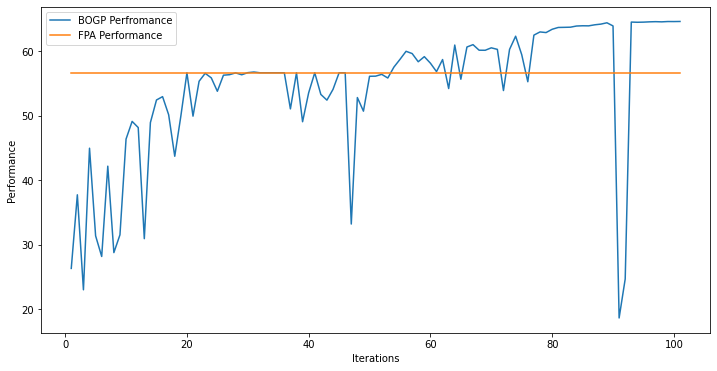

x_next is [ 26.5199935   29.99669383  29.99442894  20.58413003  29.9933841
  25.15063328  29.99727988  23.43486777  29.99529352  15.41910226
 -21.37954526  29.58510762  29.99685863  29.99284044  29.9938267
  29.98562857  29.99759074  29.98524105  20.52280943  29.99922172]
f()=64.649284, actual=64.631
100


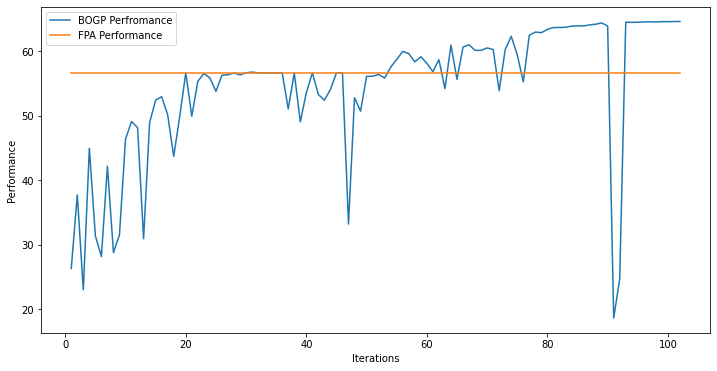

x_next is [ 26.8034947   29.99664444  29.98159754  20.79332104  29.99096061
  24.6707937   29.96912172  23.13866165  29.98011554  15.49802628
 -21.76028501  29.90770264  29.99003191  29.94454482  29.96141854
  29.92842595  29.97637735  29.98069162  20.37725894  29.99916392]
f()=64.624264, actual=64.673
101


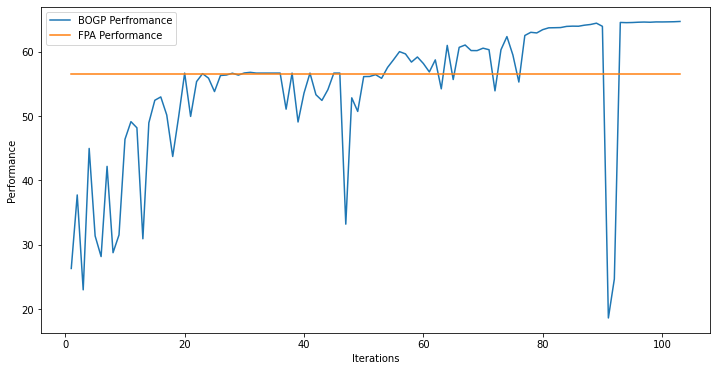

x_next is [ 26.19126062  29.99044648  29.9954755   21.48879331  29.98722455
  25.06291755  29.99435396  22.3680708   29.98485592  15.9390445
 -21.7773228   29.98871758  29.99331941  29.65197007  29.99852197
  29.97296349  29.99693784  29.98909867  19.76944221  29.99255021]
f()=64.692611, actual=64.660
102


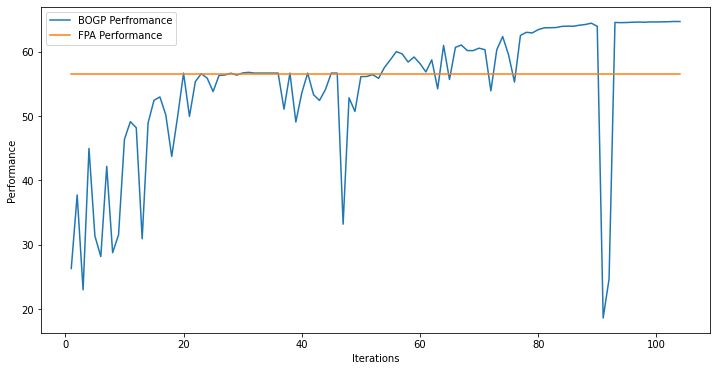

x_next is [ 26.94426842  29.98953984  29.99887235  21.40900285  29.99874456
  24.66370767  29.99483932  23.31522673  29.99299983  15.76720311
 -21.79291953  29.9985067   29.98643003  29.94749471  29.99245037
  29.94566985  29.99930858  29.99192862  19.90152865  29.99827382]
f()=64.688741, actual=64.730
103


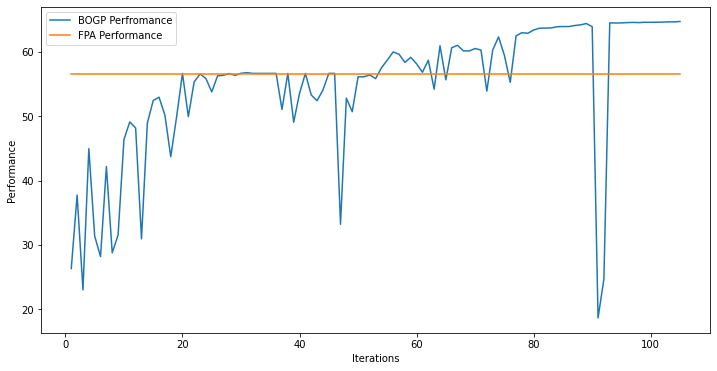

x_next is [ 24.06055581   6.9878817   23.00534548 -21.2419694   -8.88048587
   7.03624666 -30.67892706  14.70213945  18.81530866  23.3213568
 -24.50862647  -0.56850708  29.09819584  27.42034611  -7.63956869
 -25.62485444 -10.59787577   6.86105098   7.79659128 -23.5795538 ]
f()=54.696346, actual=31.275
104


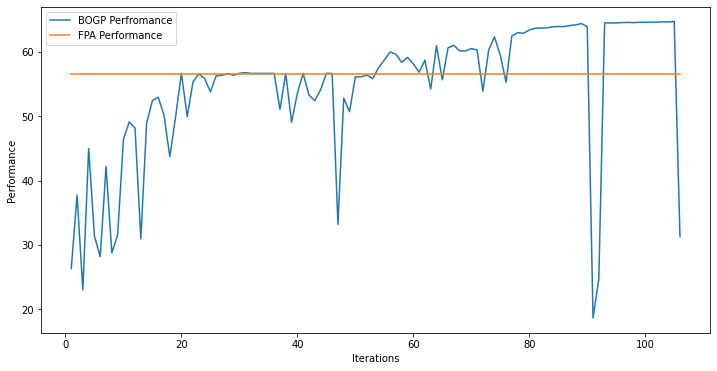

x_next is [ 27.04084881  29.99991497  29.97373979  21.65454475  29.98808875
  24.72682493  29.99137328  23.51745731  29.99464887  15.8283156
 -21.75583227  29.97421208  29.95673414  29.95423489  29.98665572
  29.97861239  29.98891007  29.99153637  19.87528909  29.98369741]
f()=64.724989, actual=64.735
105


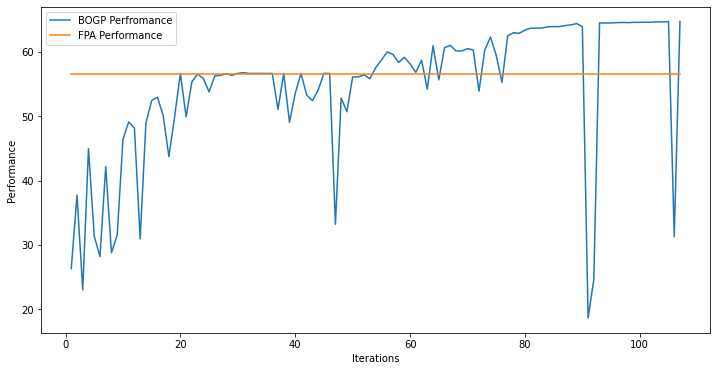

x_next is [ 27.04943694  29.99416828  29.996341    21.87874108  29.99371063
  24.7112546   29.96670966  23.71715961  29.98955116  16.04678633
 -21.92322172  29.98009563  29.98393406  29.88837883  29.97608469
  29.99608249  29.99491167  29.99245976  19.84314911  29.99915981]
f()=64.742041, actual=64.753
106


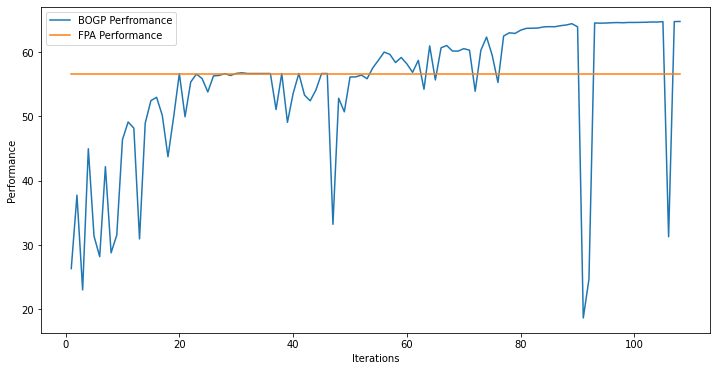

x_next is [ 27.07629988  29.99645473  29.98752124  22.0698857   29.98493729
  24.78166556  29.98111483  23.95924726  29.99587095  16.22437015
 -22.01727207  29.983667    29.99974492  29.90100221  29.99239817
  29.8754636   29.99481141  29.99604142  19.90328051  29.99931443]
f()=64.755434, actual=64.824
107


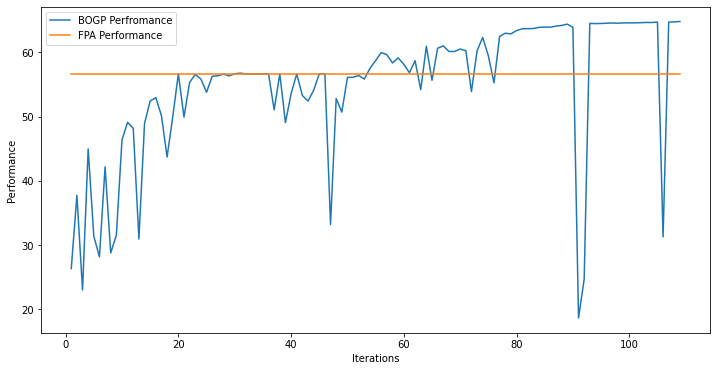

x_next is [-27.25450219  18.39122172 -22.67172332 -28.60945159  -5.46722423
 -12.98474462 -23.53305699  14.67168625   4.21457414   0.73389804
  24.77562648 -23.59081358 -25.25691584  10.06557211  15.71034657
 -27.39528355   5.14160533 -19.48906477  12.69962293  22.96272113]
f()=54.758132, actual=26.564
108


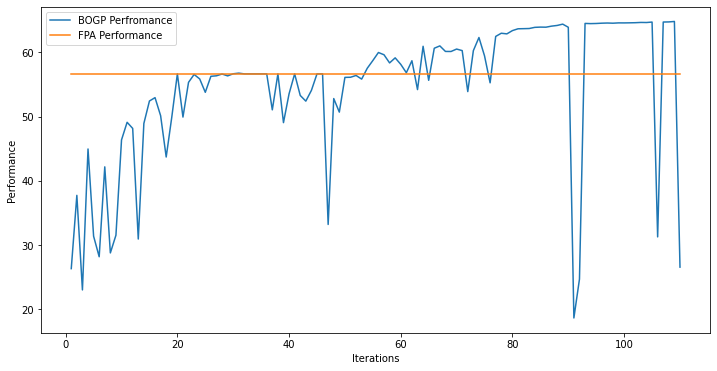

x_next is [-14.08504309 -13.48376522  -2.93223308  -3.11955878 -16.88037805
  -6.46795283  -5.93804412  16.3688324    1.28472081 -20.37271975
 -12.84531884   4.93007581 -21.94663862  24.03900408 -20.33631252
  17.02718131  19.44783339  29.07951868  17.79787013   0.25911857]
f()=54.500697, actual=30.593
109


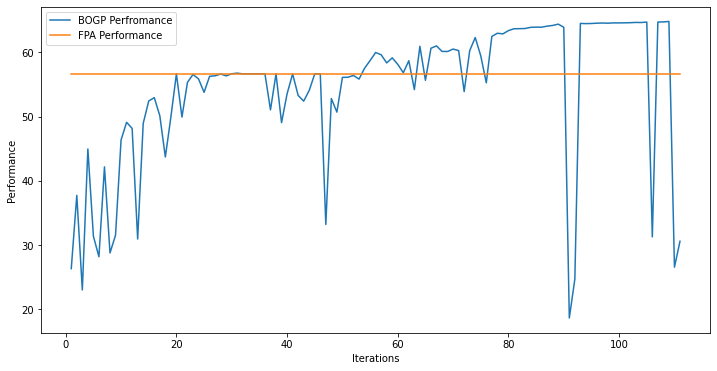

x_next is [ 26.45868459  29.99994258  29.99790092  20.66059807  29.99679866
  24.59379893  29.99954988  25.66973228  29.99709536  16.37608172
 -21.41060482  29.99793881  29.99860487  29.99617296  29.99810008
  23.67185284  29.99985784  29.99773091  19.95873428  29.99890221]
f()=65.379597, actual=65.932
110


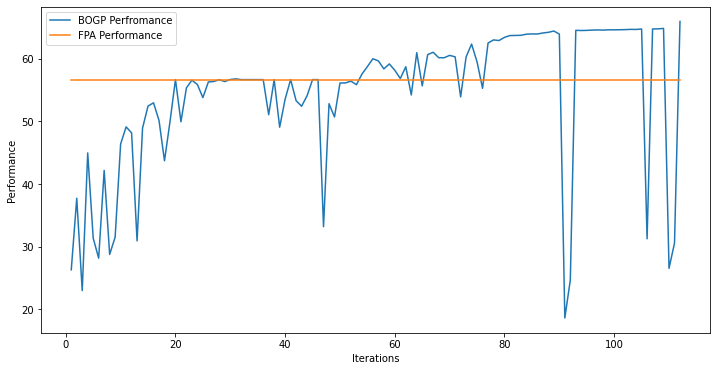

x_next is [ 23.84982521  28.62078946  26.50511892  29.5747944   22.0667885
  29.74910214  29.03376657  25.77824286  29.85934857 -28.55678407
 -28.75797621  20.66680144  29.61321285  25.8300962   29.62558081
  28.18702909  26.00273067  29.15617837  25.163592    29.47091173]
f()=57.571593, actual=56.207
111


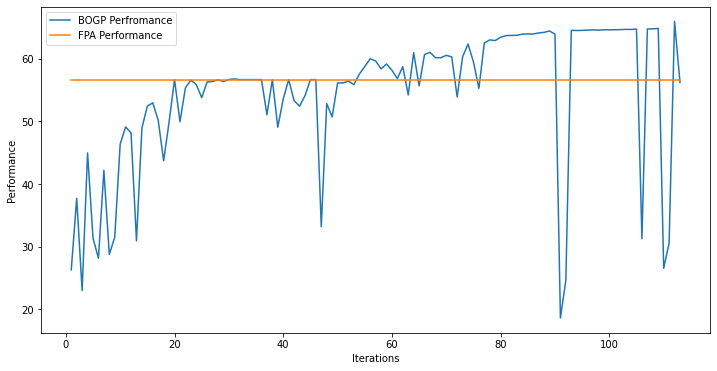

x_next is [ 25.84304877  29.99970695  29.99935277  18.60170435  29.99914081
  23.41951611  29.99960773  27.17206984  29.99995194  16.02579538
 -20.31756631  29.99782312  29.99930265  29.98758992  29.99954799
  18.83345278  29.99844477  29.99905678  20.25685964  29.99931694]
f()=65.889362, actual=65.437
112


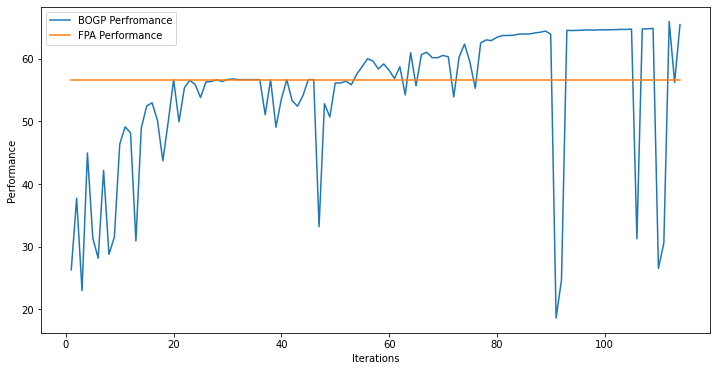

x_next is [ 26.37297714  29.99684977  29.99682644  20.71686764  29.99342769
  24.98278501  29.99969244  25.67733075  29.99280049  16.49615538
 -22.03361777  29.99896933  29.99159078  29.96290089  29.99972473
  23.14377191  29.99626264  29.995518    19.92411881  29.98057668]
f()=65.922713, actual=65.919
113


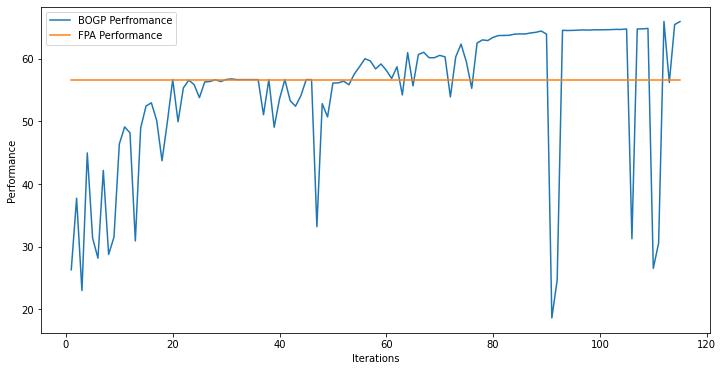

x_next is [ 26.24239139  29.99842515  29.99335339  20.95865527  29.99959763
  24.8075622   29.99281748  25.39303914  29.98767001  16.52206904
 -21.3224929   29.95918365  29.99672687  29.97838658  29.99867132
  23.23631272  29.99284197  29.98571409  20.2324586   29.99935326]
f()=65.922872, actual=65.884
114


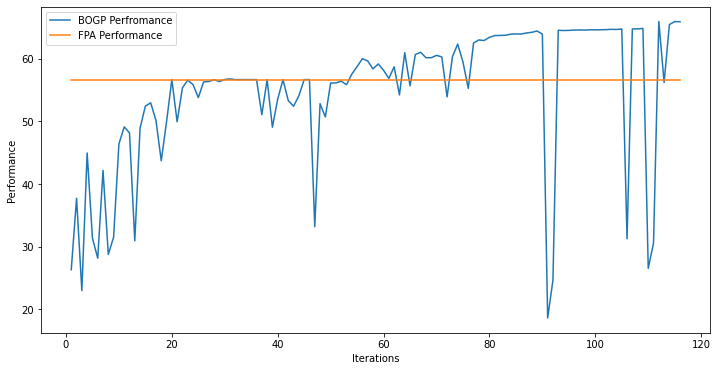

x_next is [ 26.7137544   29.99840433  29.99898111  20.66384196  29.98867606
  24.58486056  29.99426348  26.86916325  29.99076044  16.03058827
 -21.9975137   29.99530818  29.99089746  29.99646033  29.99916946
  23.43931117  29.98954217  29.99364035  19.47015135  29.99760025]
f()=65.933556, actual=65.904
115


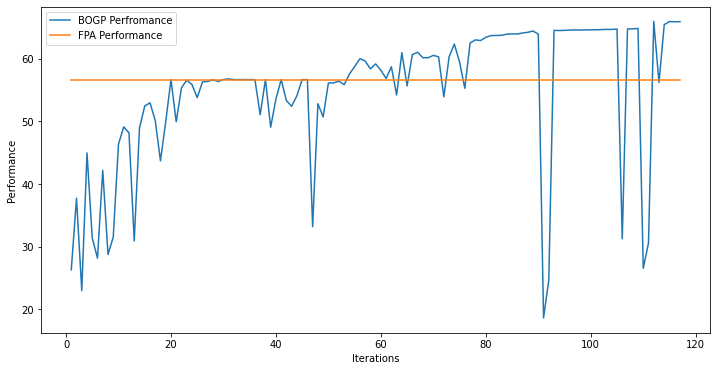

x_next is [ 26.89844664  29.99265233  29.99642336  20.03708405  29.98765567
  24.53733658  29.99555048  25.53144455  29.99040533  16.50261159
 -21.94094109  29.98393878  29.99090817  29.94058177  29.9965238
  23.49205606  29.99739696  29.99919258  19.29314933  29.99944686]
f()=65.936573, actual=65.949
116


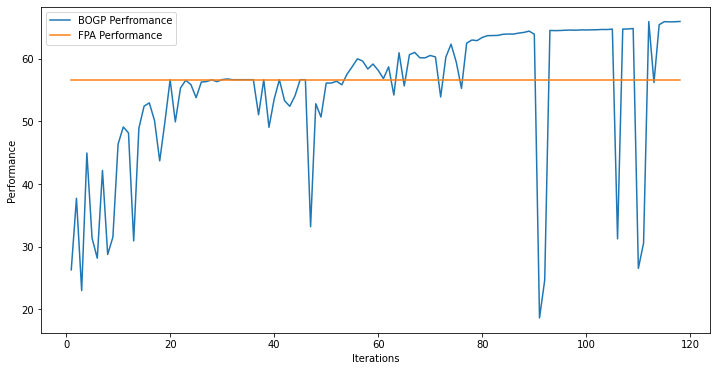

x_next is [ 26.65290118  29.99793491  29.99710095  20.07989658  29.96774209
  24.18212213  29.99885653  25.65329067  29.98591199  16.40918436
 -21.99671745  29.99184592  29.98739497  29.97560016  29.98781505
  23.31508611  29.99021931  29.99929506  19.46882005  29.99845268]
f()=65.946527, actual=65.938
117


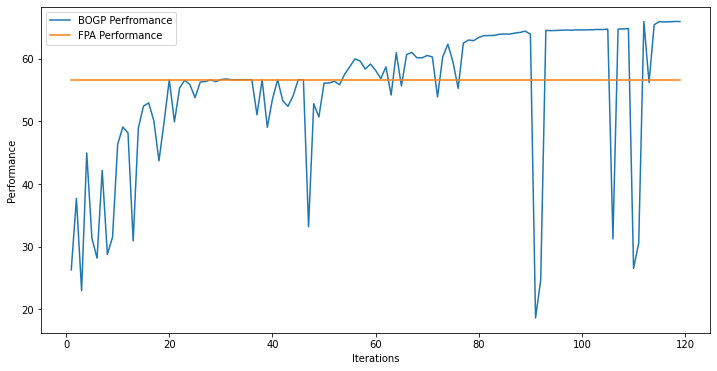

x_next is [ 26.47021428  29.99134362  29.98541149  19.87188626  29.9815714
  24.79611181  29.99217874  25.71030949  29.96707976  16.81755481
 -21.66665044  29.99094413  29.97926758  29.90368018  29.99967936
  23.52899152  29.99543138  29.99889436  19.279787    29.98755802]
f()=65.939041, actual=65.962
118


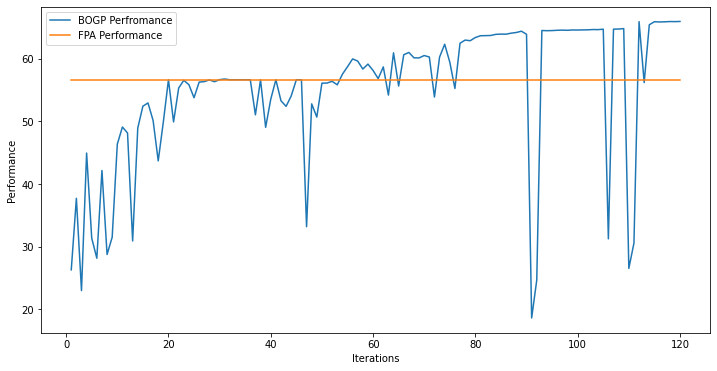

x_next is [ 26.50620508  29.99921021  29.97680811  19.80550035  29.97457808
  24.93421058  29.99727713  25.82162864  29.97140145  16.95117113
 -21.68097664  29.96676866  29.99876572  29.96735092  29.99575014
  23.34610694  29.99689875  29.99302616  19.12178943  29.99464427]
f()=65.965397, actual=65.960
119


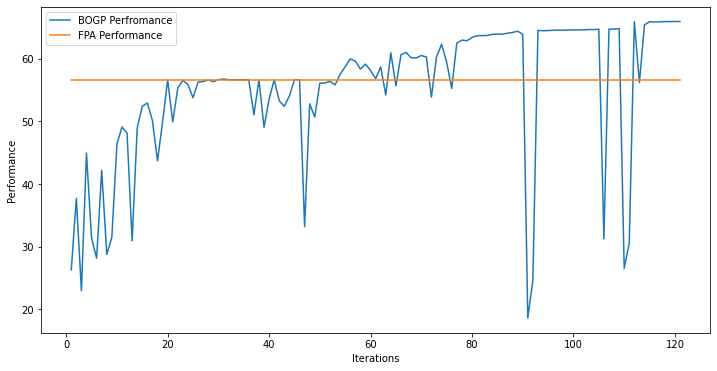

x_next is [ 26.36090296  29.99963715  29.9975735   19.87364167  29.99844051
  24.97146082  29.99995375  25.90686546  29.99953067  16.56014521
 -21.5771717   29.99952194  29.99897495  29.08350375  29.99917009
  23.37140664  29.99959144  29.99924042  19.15704189  29.99901616]
f()=65.953660, actual=65.936
120


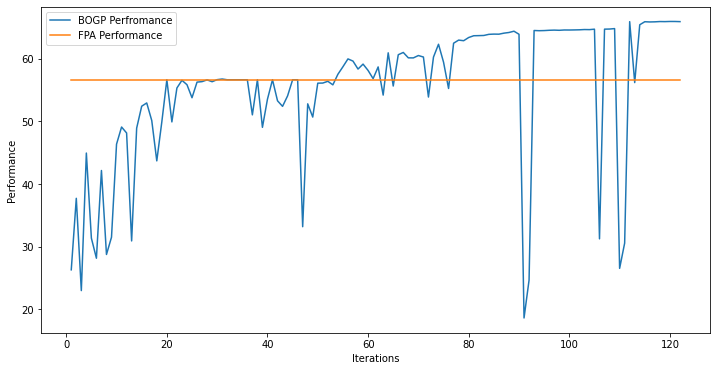

x_next is [-30.37140468   0.71557572 -25.49239632 -16.4509007   -1.13764119
 -26.43029473 -29.97511228 -13.95164354  26.34853491 -20.31225429
  -2.09924385  -9.15251778 -29.75500195   0.36996242 -21.47328561
 -14.36365594 -21.10818291  -4.69733813 -14.47247361  16.97658898]
f()=55.251432, actual=12.383
121


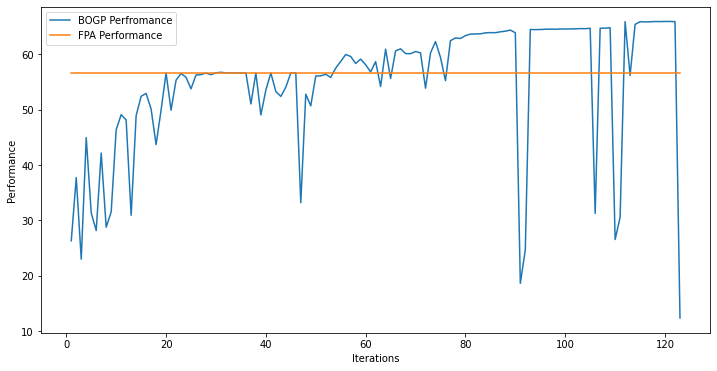

x_next is [ 26.45599918  29.99963652  29.96545788  19.92516521  29.99581848
  24.99994088  29.99007309  25.83845014  29.97071656  16.8836754
 -21.79726768  29.99474691  29.99139118  29.98064989  29.99544223
  23.62284772  29.99890682  29.99908321  19.45583517  29.98903843]
f()=65.965004, actual=65.973
122


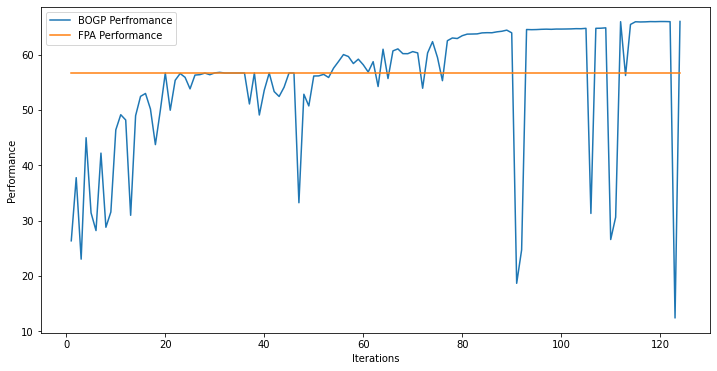

x_next is [ 26.67596163  29.99927924  29.97638328  19.42969001  29.99032551
  25.12733258  29.95357601  26.03372498  29.98796987  16.91583882
 -21.67396124  29.96401992  29.98770848  29.89036589  29.99224528
  23.51746452  29.9999466   29.98038533  19.99519684  29.95004878]
f()=65.954938, actual=66.032
123


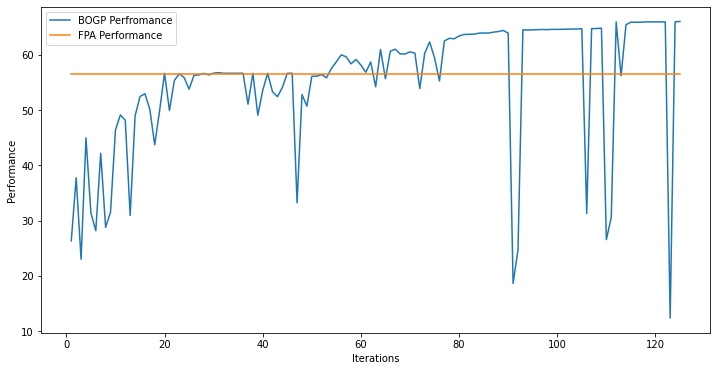

x_next is [ 27.27921492  29.99596349  29.99553458  18.76455256  29.99658312
  25.38599292  29.98822193  26.42791559  29.98397274  16.72568341
 -21.43487095  29.9685696   29.97933519  29.94265222  29.9965139
  22.92284988  29.9960624   29.99793296  20.58497799  29.99798893]
f()=66.063298, actual=66.019
124


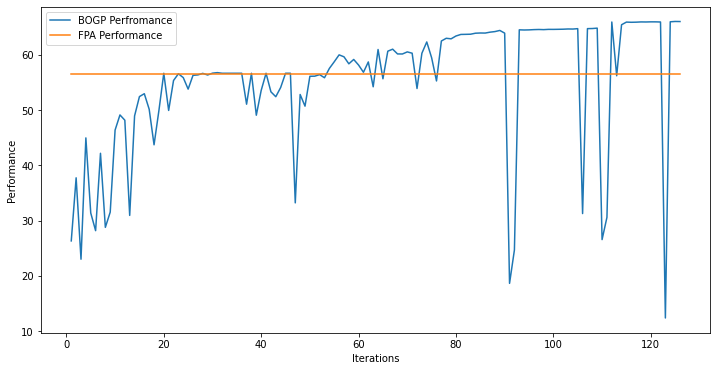

x_next is [ 27.03819346  29.98746457  29.99347883  19.07350816  29.98542866
  24.95684016  29.99209664  26.07726381  29.98787663  17.30349344
 -21.82107315  29.97448228  29.99853504  29.80905097  29.98637336
  23.35016306  29.99831411  29.98658771  20.35978281  29.97008743]
f()=66.038194, actual=66.033
125


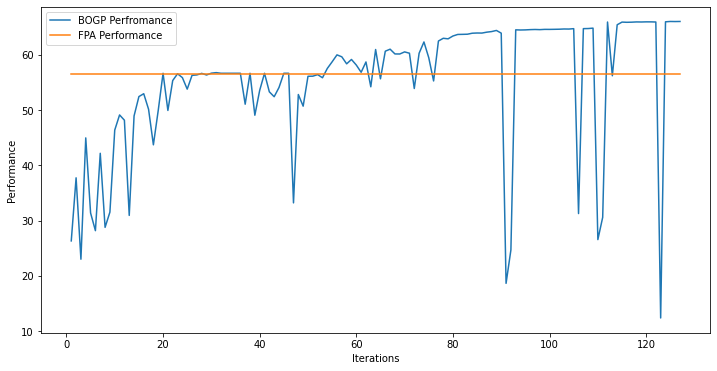

x_next is [ 26.87779657  30.          30.          19.15204377  30.
  25.1096875   30.          26.08536692  30.          16.90800845
 -21.61775944  30.          30.          29.95910255  30.
  23.35248718  30.          30.          20.26144142  30.        ]
f()=66.055618, actual=66.034
126


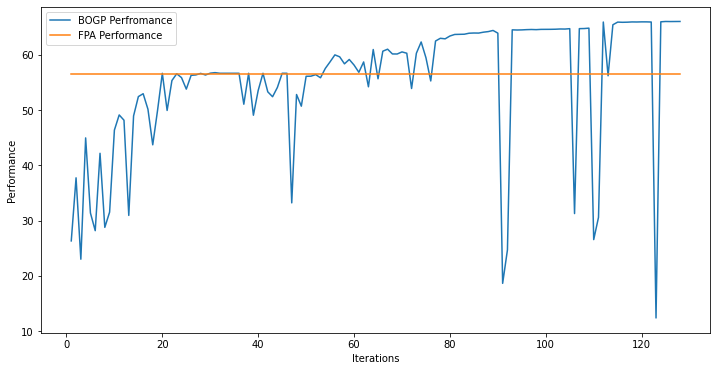

x_next is [ 27.20084249  29.99922377  29.99659655  19.18298172  29.98981318
  25.1656751   29.98515912  26.45723462  29.99862412  17.11344619
 -21.77261574  29.90979788  29.99749157  29.62222662  29.99916214
  23.21983439  29.99377761  29.99399903  20.27881695  28.27658121]
f()=66.037160, actual=66.442
127


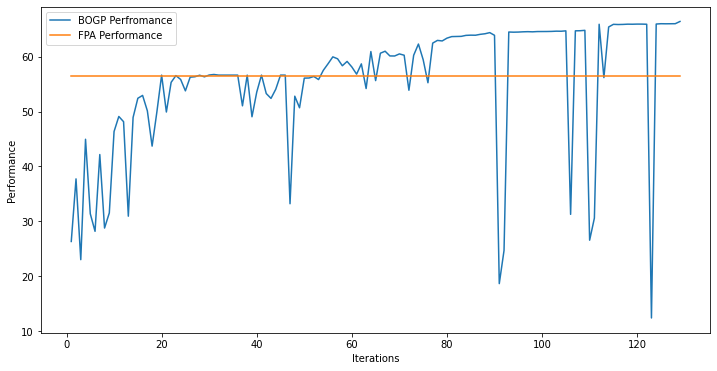

x_next is [ 26.6876989   29.99991932  29.99994265  17.95199795  29.99998004
  24.81673177  29.99990851  27.09990634  29.9999215   16.55658692
 -21.71542104  29.99982145  29.99977864  29.69849499  29.99998189
  22.08365225  29.99995106  29.99983056  20.43807563  23.33228268]
f()=66.715150, actual=66.786
128


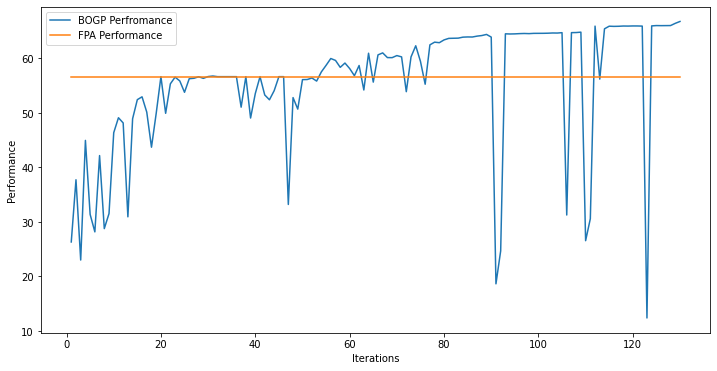

x_next is [ 27.32847543  29.99844181  29.99610705  17.97651071  29.97919892
  25.44615686  29.98884044  27.25685711  29.99261142  16.81002889
 -21.35727233  29.97548887  29.99919267  29.8051322   29.9957718
  22.17213766  29.99176726  29.99915562  20.59620679  24.20929745]
f()=66.779751, actual=66.813
129


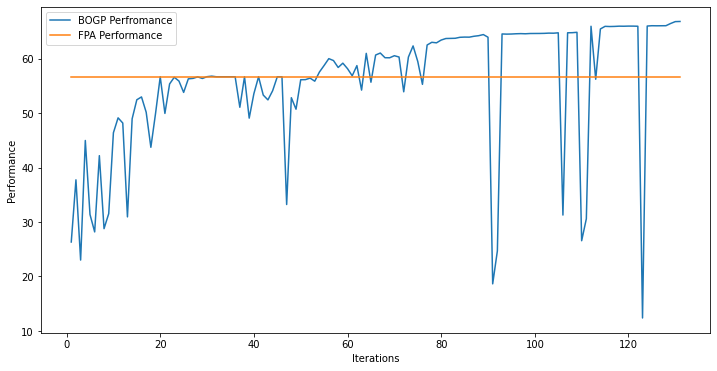

x_next is [ 27.37147589  29.99751968  29.98896032  17.47180637  29.99139124
  25.64974494  29.99350191  28.24229156  29.9918214   16.86381799
 -21.64011417  29.96737576  29.99241203  29.63287486  29.99773274
  21.64106278  29.99409774  29.99918948  20.3647922   23.57420573]
f()=66.783780, actual=66.691
130


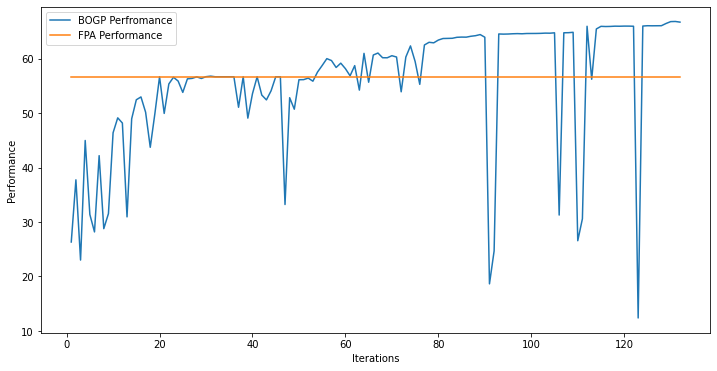

x_next is [ 29.74686933  29.54735651 -30.93281795 -30.95567048  28.94664081
  29.6662205   29.9535747   29.79074121 -30.96925466 -30.87750217
 -29.75301963 -30.78341985  29.88751895  29.57157811  29.01728092
 -30.62222208  29.84729376  29.54636323  29.97269318 -30.97784131]
f()=54.802627, actual=45.792
131


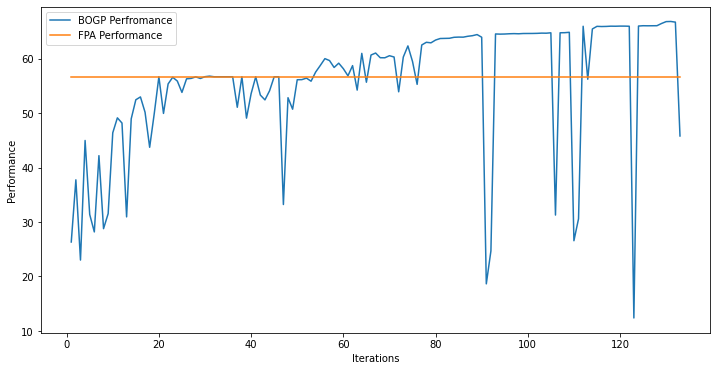

x_next is [ 27.4195982   29.99968349  29.98575011  18.35371388  29.99026925
  25.0588191   29.96977136  26.13449299  29.99833589  16.64640252
 -20.98018028  29.99810796  29.99878244  29.97631903  29.98530692
  22.38272612  29.99982846  29.99616168  20.94940642  24.32014345]
f()=66.841178, actual=66.839
132


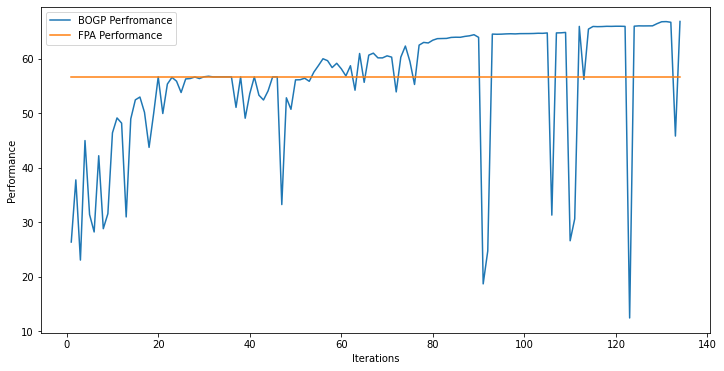

x_next is [ 26.96056938  29.99954429  29.99717016  18.8018291   29.99782874
  25.02725462  29.95459144  26.62097043  29.97894889  16.77559713
 -20.83909446  29.96196886  29.99733644  29.81844596  29.99716653
  22.84475532  29.98893841  29.99262621  20.56524889  24.25389994]
f()=66.825494, actual=66.725
133


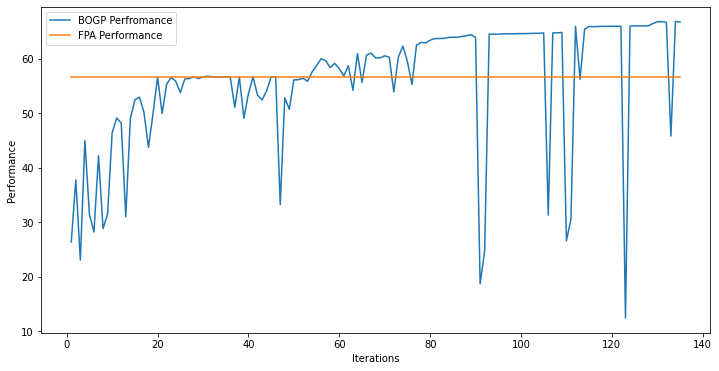

x_next is [ 27.48299451  29.99974476  29.99582021  16.95041445  29.9938147
  25.25690686  29.99503345  25.37179924  29.98989257  16.38879768
 -22.1262006   29.95701434  29.9963954   29.99028672  29.99810159
  21.15910262  29.99984796  29.99880269  21.69882532  23.41865554]
f()=66.902065, actual=67.019
134


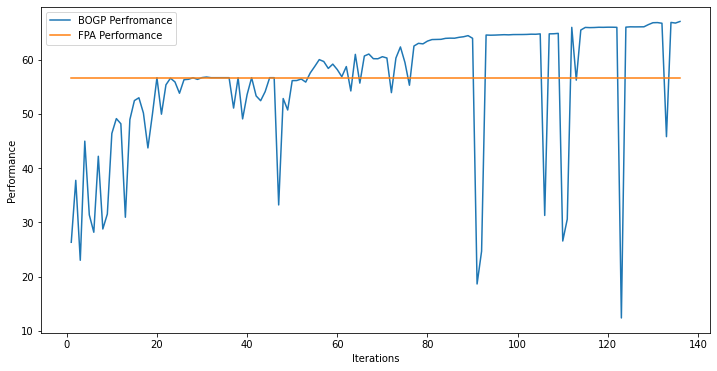

x_next is [ 27.49615974  29.99750598  29.99954711  15.4589487   29.99610954
  25.41515097  29.99872696  24.64815171  29.99647252  16.17327171
 -22.65988443  29.99695874  29.99999375  29.99889128  29.99743689
  19.97520249  29.99909869  29.99688648  22.7250707   21.90154368]
f()=66.984161, actual=66.995
135


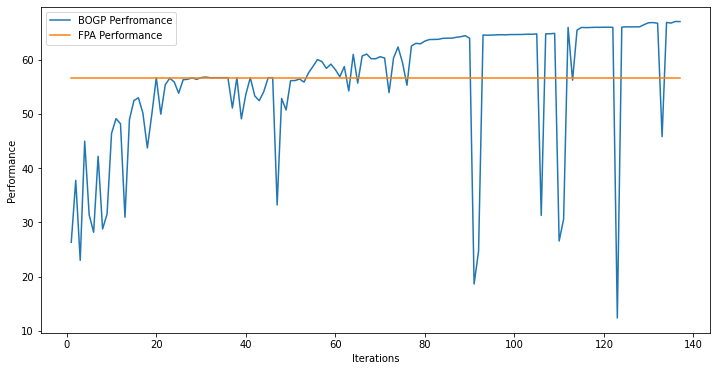

x_next is [-25.57891587 -19.91951659  21.12638796  19.01925613  -5.30412831
 -11.63024812 -16.78023476  -4.24233891  -0.44479813 -17.41527271
  -2.32804461 -11.13787462 -14.74818745  18.40634374  14.73185926
 -28.88566885 -24.93114044  13.20636357 -12.62989223  24.89877419]
f()=55.934740, actual=22.840
136


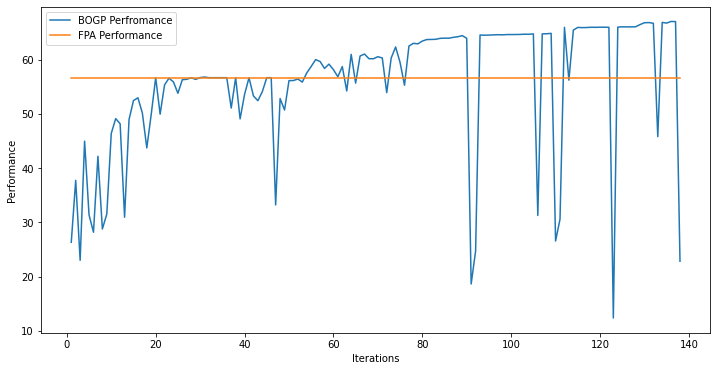

x_next is [-12.50404192  -3.76717841  24.94774791   1.3127554  -18.68811539
  29.27421753 -26.94293694  -9.52222877 -23.90477584 -23.60102185
 -26.93651323  28.31397437   1.68333193 -10.07053763   1.14883929
  25.40069286  10.34486299 -19.83712974  13.8313228    8.17542963]
f()=55.693949, actual=27.809
137


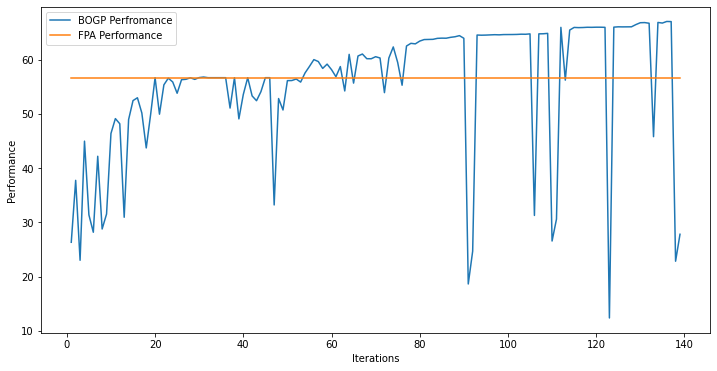

x_next is [ 27.21275363  29.99560618  29.98842385  16.06981923  29.99253675
  25.92339251  29.98088028  24.80220337  29.98719009  16.6753279
 -22.45000938  29.99416909  29.9998464   29.98916595  29.99850098
  20.78437722  29.99943299  29.99664003  21.54203231  22.89350905]
f()=67.011041, actual=67.073
138


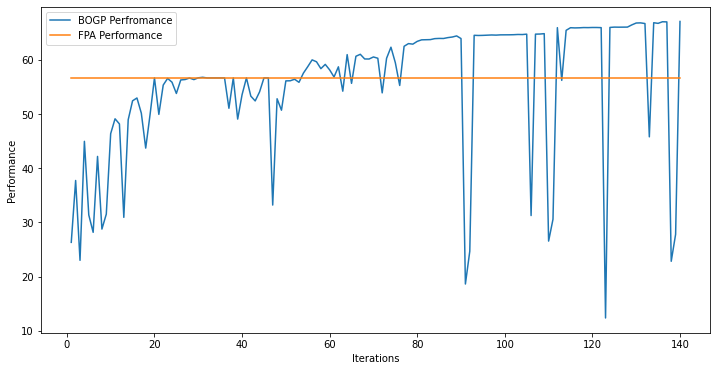

x_next is [ 27.03924154  29.99838955  29.99193365  15.94347924  29.9845295
  26.22587286  29.99222971  24.39491222  29.99253688  17.22737793
 -22.55883042  29.98385179  29.98937144  29.96504255  29.99423146
  20.81299622  29.99891918  29.9917242   21.45868354  23.17795434]
f()=67.065789, actual=67.070
139


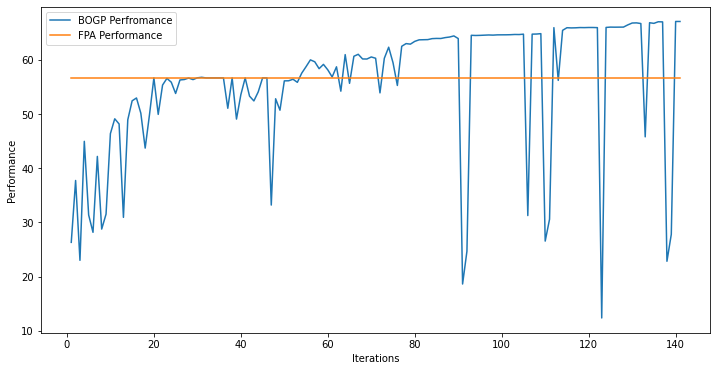

x_next is [ 26.73250906  29.9957355   29.99053678  15.77290005  29.97768656
  26.45407583  29.9920269   24.6208374   29.97610157  16.9840542
 -22.0952716   29.95623102  29.9743998   29.9993568   29.99356641
  20.33722214  29.99897943  29.99939798  21.6329287   22.84713832]
f()=67.056174, actual=67.066
140


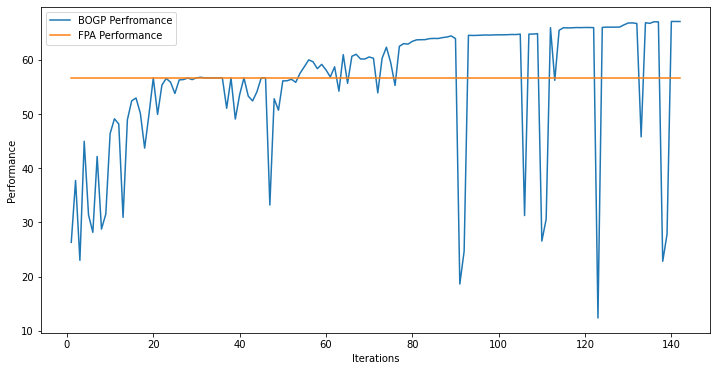

x_next is [ 25.68690611  29.96238503  29.87873424   3.41119924  29.73059858
  29.37167177  29.8734799   28.49737881  29.97229063   9.8632684
 -30.71613179  29.96836492  29.87699719  29.83644197  29.97992536
   6.81480444  29.95227201  29.94932824  28.45440684   5.24718074]
f()=64.678898, actual=57.052
141


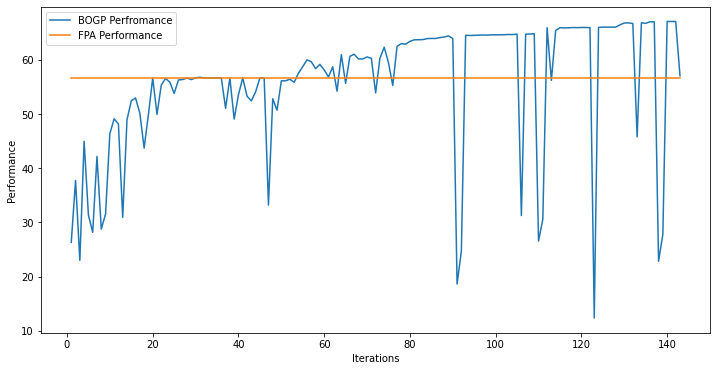

x_next is [ 27.32361696  29.99687619  29.98101962  15.60662193  29.99774374
  25.49652945  29.9993403   24.34045589  29.99122917  17.37289217
 -21.49976106  29.99571204  29.99973332  29.99240698  29.9977943
  20.56306599  29.99954198  29.99692215  21.56289754  22.72483076]
f()=67.069864, actual=67.089
142


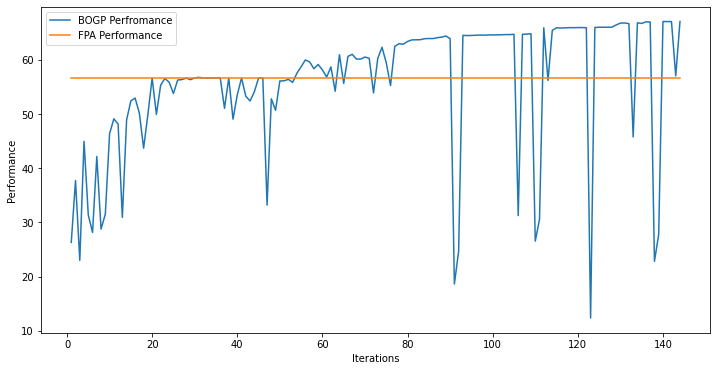

x_next is [ 21.63136976 -16.09286621 -27.99123784  16.35315177  23.34126602
  21.38592932  21.75615602  28.38519582  19.913297    28.91990292
 -29.49035255  11.26940668   9.00694993  15.60320336  29.45312908
  29.72737129   6.6533445   25.85046376  29.49575584 -23.12297761]
f()=55.825509, actual=41.981
143


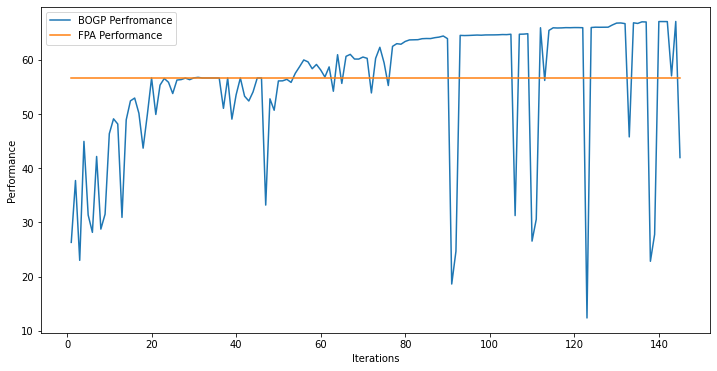

x_next is [ 27.08184884  29.99889507  29.99368144  15.79316694  29.97580778
  25.87904127  29.98993946  24.37275702  29.99757792  17.12432567
 -21.75842057  29.98787039  29.99829184  29.92469346  29.99846546
  20.90992051  29.99385648  29.99154036  21.88827377  22.77942219]
f()=67.088563, actual=67.047
144


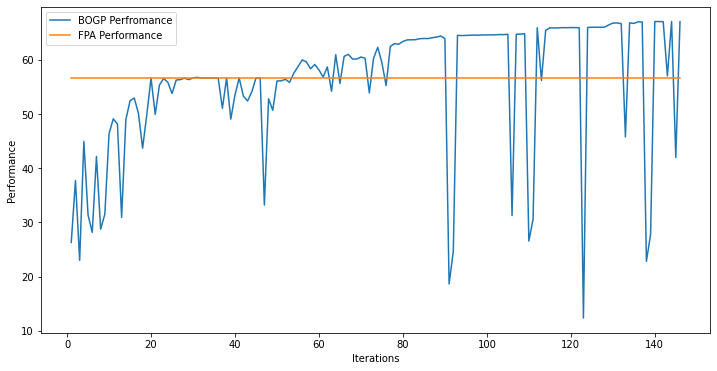

x_next is [ 27.48490987  29.99862284  29.99858341  15.5770024   29.98988588
  25.41502041  29.98637755  24.28404985  29.99796332  17.28927731
 -22.11939487  29.98953282  29.99298367  29.99885444  29.99416905
  19.46978116  29.99985605  29.99875821  20.92483023  22.75991109]
f()=67.129366, actual=67.147
145


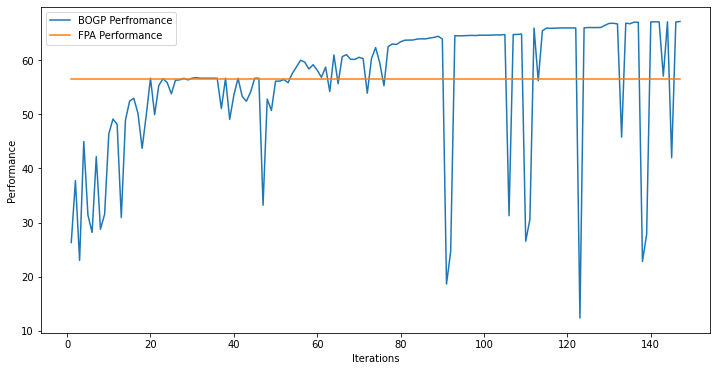

x_next is [ 27.65853216  29.9929986   29.99781416  15.92276598  29.98779674
  25.74106489  29.99994661  24.07052805  29.98007153  17.26093566
 -22.0324033   29.99413846  29.99368531  29.97514588  29.99845044
  19.64131433  29.9951256   29.9989326   20.91338449  22.6018624 ]
f()=67.138923, actual=67.118
146


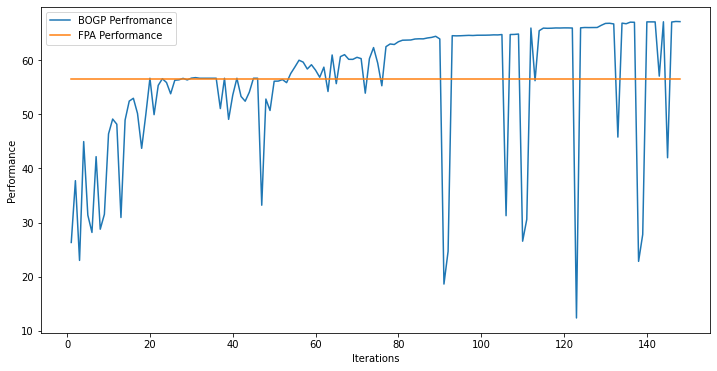

x_next is [ 29.54745055 -27.9905805   29.49731187  29.83556125  14.28486002
  19.18848241  27.31448399  -5.87592869  26.6572326  -27.64742694
 -10.41838313   9.40031818  23.48975478 -20.29013754  24.66645012
 -14.20771589  22.81890487   4.80261628 -21.60393294  11.30413962]
f()=55.960632, actual=37.060
147


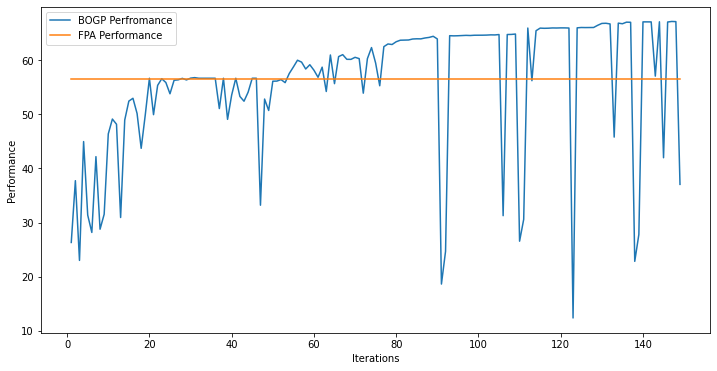

x_next is [ 26.92252104  29.99827154  29.98722529  15.24710883  29.96583022
  25.00292325  29.99104679  24.08876975  29.99162623  17.06360523
 -22.12865914  29.97074655  29.99493715  29.99977285  29.98809965
  19.24481884  29.99770817  29.96820341  20.70757429  22.76849047]
f()=67.132698, actual=67.184
148


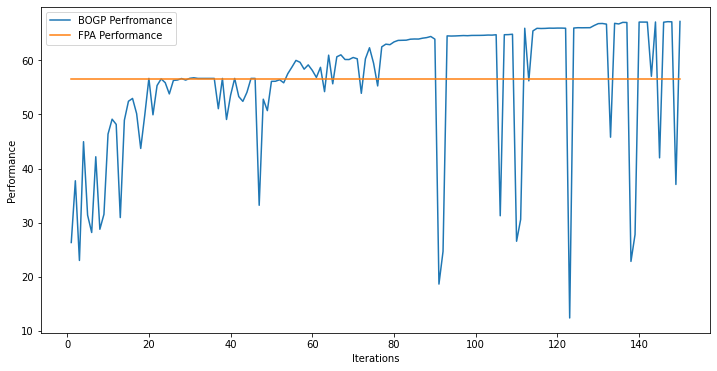

x_next is [ 26.7282072   29.99763791  29.99874117  15.10551808  29.99775904
  24.74650228  29.98785063  23.58272102  29.99855727  16.88589412
 -22.18996307  29.95352349  29.98830191  29.99585122  29.99960291
  19.45853365  29.99831562  29.99991952  20.45910939  22.77123578]
f()=67.197817, actual=67.177
149


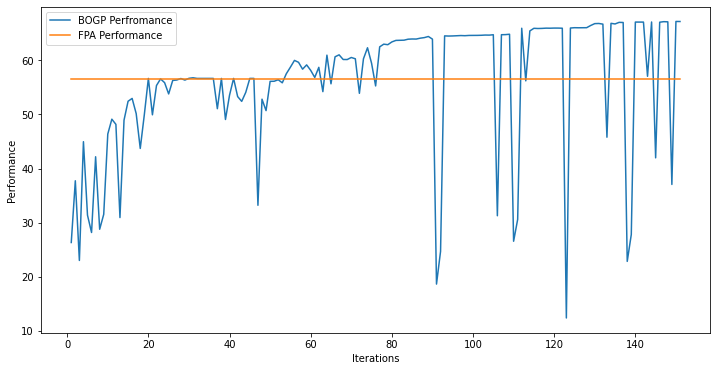

x_next is [ 26.64891209  29.99957572  29.99781322  15.37603544  29.99947763
  24.85994537  29.99721898  24.07551917  29.95277856  16.9393131
 -22.07339002  29.96779833  29.99930782  29.98525756  29.99880862
  19.30543837  29.99810173  29.97652097  20.86718855  22.73617568]
f()=67.189248, actual=67.171
150


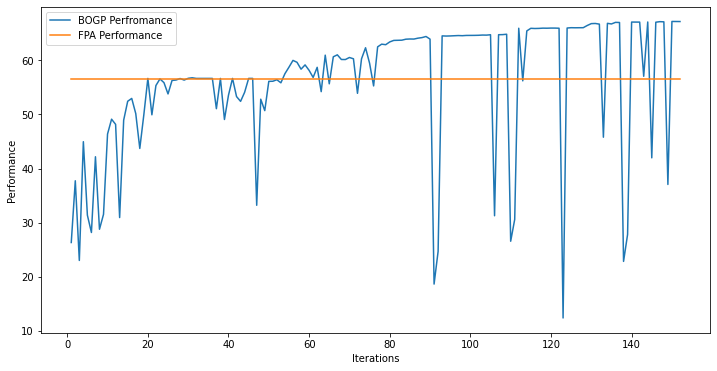

x_next is [ 26.97868883  29.99418819  29.99559297  14.70641939  29.12183769
  25.09903951  29.99712125  24.07188576  29.99641521  16.9493465
 -22.02762097  29.99434547  29.99478815  29.97474783  29.99876405
  19.12816175  29.99777732  29.99907729  20.36569094  22.60680063]
f()=67.172621, actual=67.235
151


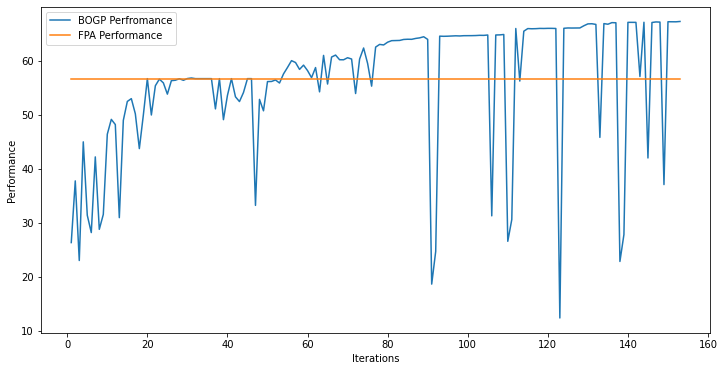

x_next is [ 26.93674543  30.          30.          14.63040234  28.74197609
  25.07264157  30.          24.04884907  30.          16.96531878
 -22.0016323   30.          30.          30.          30.
  19.16103331  30.          29.37154755  20.37138878  22.59167944]
f()=67.205633, actual=67.428
152


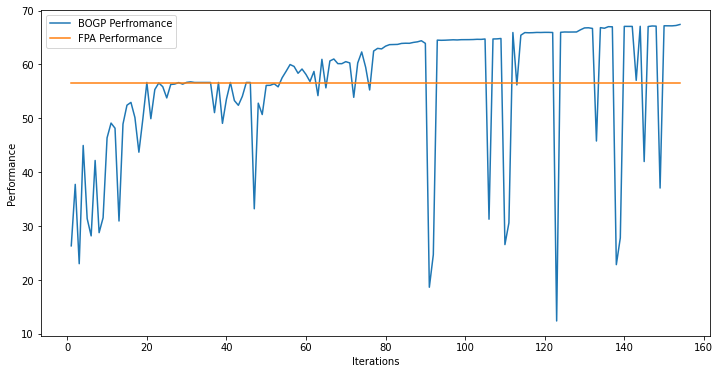

x_next is [ 26.92753691  29.99957536  29.99809665  13.76858417  28.02032504
  24.43778393  29.99677708  23.39013892  29.99987991  16.68096174
 -21.34976031  29.99997969  29.99949252  29.9989885   29.9998597
  18.59324438  29.99963044  22.74705664  19.91596851  21.97437443]
f()=68.010480, actual=67.811
153


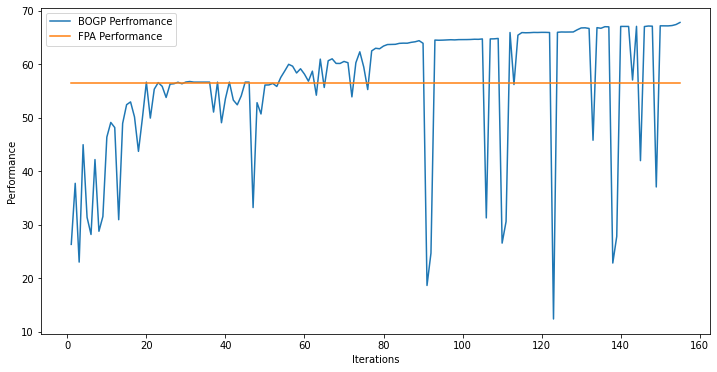

x_next is [ 26.9274889   29.99973051  29.99661257  14.6785518   28.17548522
  24.99139185  29.98977823  23.93800509  29.99382628  16.71437086
 -22.1106968   29.99124292  29.99514599  29.98954836  29.99999957
  19.28797488  29.9970185   25.05186183  20.45267048  22.61149228]
f()=67.917386, actual=67.923
154


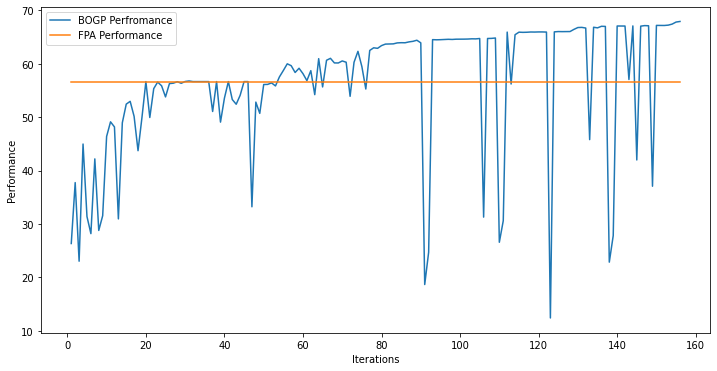

x_next is [ 29.95848314  29.94945197  29.94807738  29.96608442  29.99906457
  29.91849852  29.99104412  29.76739511  29.93457903  29.99175975
 -30.85918596  29.98318855  29.98264244  29.9690178   29.93121746
  29.98000898  29.99784201  29.97371792  29.6600109   29.9872787 ]
f()=56.353662, actual=56.735
155


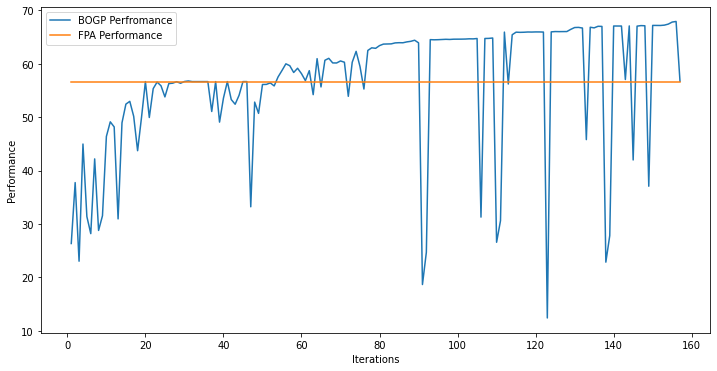

x_next is [ 30.          30.          30.          29.99991897  30.
  30.          30.          29.99988667  29.99993676  30.
 -30.99976835  30.          30.          30.          30.
  29.99983896  30.          30.          30.          30.        ]
f()=56.356258, actual=56.660
156


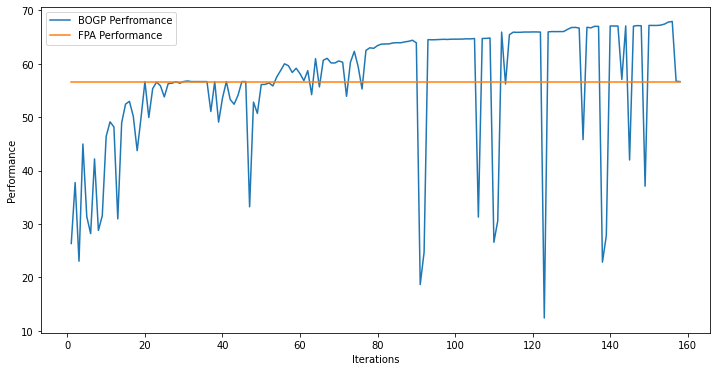

x_next is [ 26.32183452  29.95044536  29.99208551  15.18848452  26.77722258
  24.23625451  29.98909885  23.08504675  29.99014131  17.32555382
 -21.69349235  29.99993251  29.85969545  29.85384356  29.77674008
  19.29559007  29.98179955  24.1697168   19.87176469  21.96077223]
f()=67.726775, actual=67.728
157


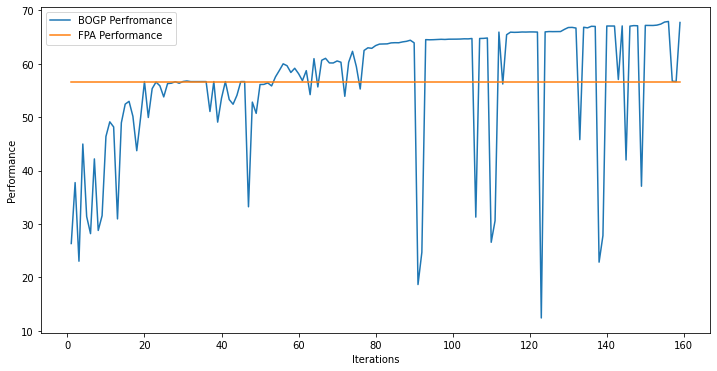

x_next is [ 26.28480322  29.99122202  29.792722    13.94122913  29.44930828
  25.02694445  29.67772015  23.00781895  29.9392185   16.43157161
 -21.76015806  29.6532662   29.95442318  29.97231644  29.96481355
  20.0585374   29.77766071  24.15672549  20.35666172  21.87773012]
f()=67.693936, actual=67.821
158


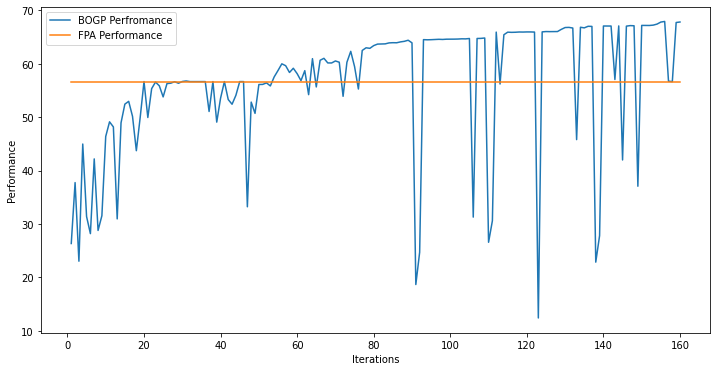

x_next is [ 26.80032498  29.88811601  29.39921621  14.22569552  29.50615058
  24.68232561  29.89387354  22.76048805  29.841944    17.11018248
 -22.00094756  29.93198394  29.85688063  29.85339987  29.93018926
  18.85301733  29.91859575  25.28877142  20.67785484  22.47081943]
f()=67.769373, actual=67.715
159


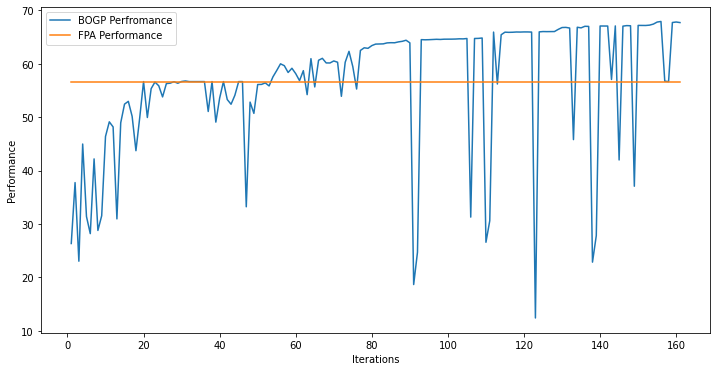

x_next is [ 27.03620046  29.99126828  29.98605367  13.6262472   28.09830836
  24.49537958  29.51308972  23.63990767  29.66701625  16.74732112
 -21.92447004  29.97555566  29.70416429  29.40953793  29.96252917
  20.69223102  29.92308167  24.54221171  19.60555104  23.19757287]
f()=67.701661, actual=67.740
160


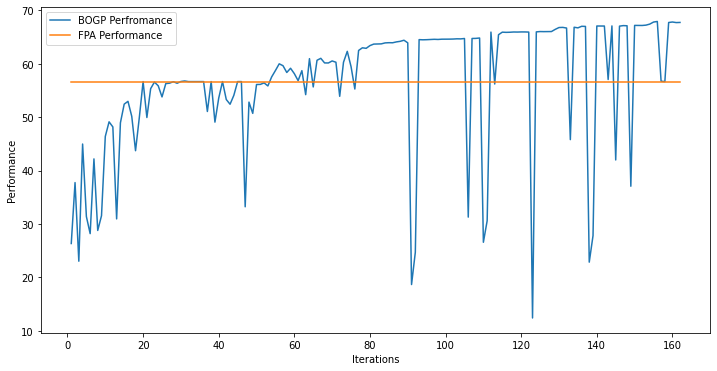

x_next is [-12.72793212   4.48166682  13.3598517   19.65758249 -16.17531421
 -15.8782885   12.27898557   2.0811574    4.37856415  24.75243895
 -15.19081062  17.91080122  20.92563877  22.73506794  24.76915244
  11.86121966  -0.32466338 -27.71155873  -2.31824966   6.81545164]
f()=56.639655, actual=30.665
161


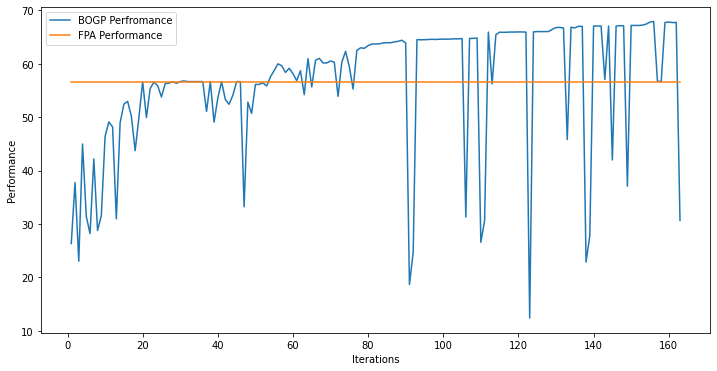

x_next is [ 26.50198536  29.84963189  29.9101995   14.69319283  28.40450487
  25.24545464  29.91591592  23.86358494  29.92957055  16.78179058
 -22.23900924  29.87764602  29.99769782  29.69076822  29.85177394
  20.66096874  29.93607319  24.10951823  20.43312785  22.45468475]
f()=67.817176, actual=67.737
162


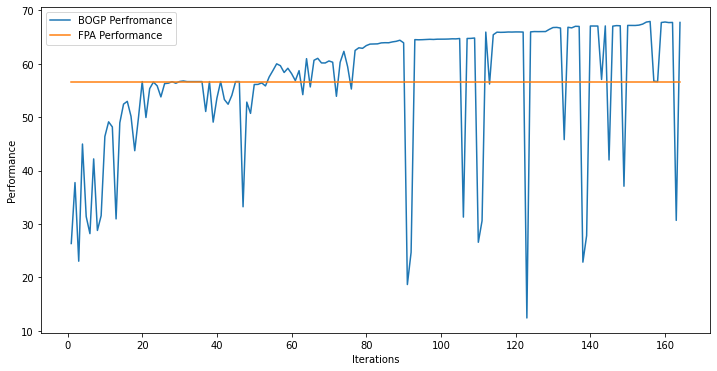

x_next is [ 26.12453349  29.7578414   29.93703938  14.38794788  28.03135756
  25.57005988  29.98926858  23.30041618  29.79575868  16.16981144
 -20.68631971  29.9286448   29.92043778  29.64824623  29.95244328
  20.3018578   29.89788469  25.22623767  19.99392153  21.57904621]
f()=67.744063, actual=67.783
163


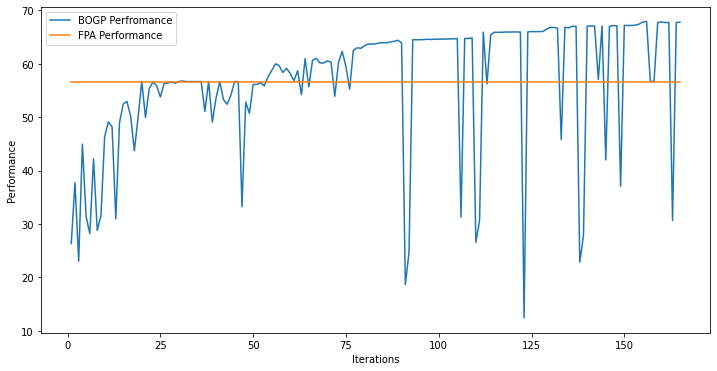

x_next is [ 25.95234924  29.95007385  29.91815279  14.23170597  28.59846022
  24.97448855  29.64688918  23.21814251  29.1699226   15.85542033
 -21.15148566  29.97413224  29.9085142   29.89054905  29.82280346
  19.37925672  29.94765973  24.95446651  19.42179745  20.933017  ]
f()=67.774816, actual=67.806
164


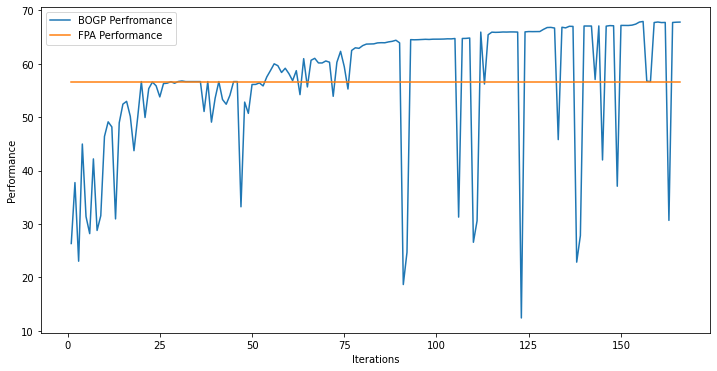

x_next is [ 27.80771557  29.79221921  29.84772793  13.53753608  27.99048252
  24.68548904  29.61885288  22.65130665  29.82341798  17.08180784
 -21.54150422  29.84154861  29.95702619  29.51296632  29.95662812
  19.1472499   29.86807991  25.36777842  18.91629948  22.28652676]
f()=67.718010, actual=67.737
165


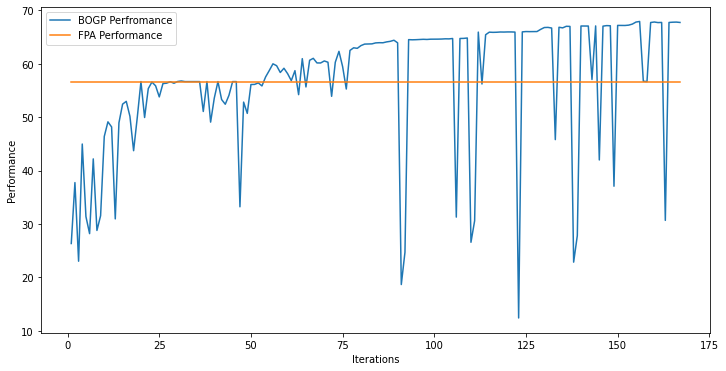

x_next is [ 26.25056328  30.          30.          13.94835428  29.16465864
  25.37064323  29.47474175  24.2581556   29.69470405  16.18843196
 -21.78385329  29.99999999  30.          29.09591899  29.83635443
  19.76725689  29.8296557   24.52012564  18.77615014  21.61588861]
f()=67.761645, actual=67.751
166


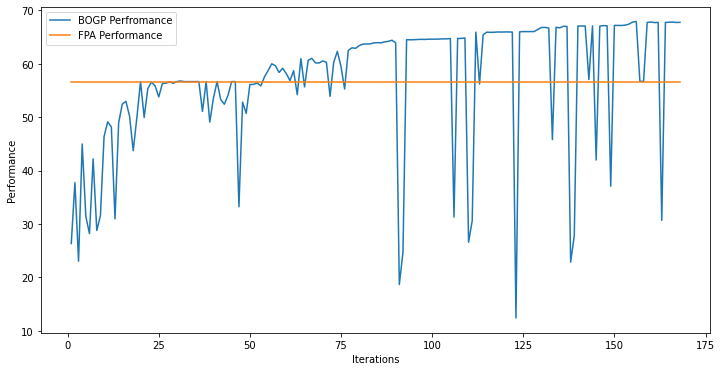

x_next is [ 26.52664757  29.92585388  29.98655189  13.51378541  27.84814845
  25.69492663  29.63862547  23.56540782  29.90083402  16.72407432
 -20.58966855  29.17080358  29.91261243  29.80829543  29.79576104
  18.4328709   29.9251051   25.53935346  19.74291532  21.0588888 ]
f()=67.763088, actual=67.885
167


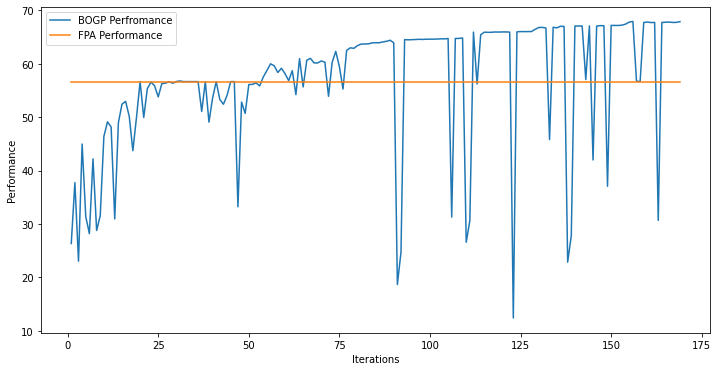

x_next is [ 26.40006762  29.7517451   29.97201699  12.01260884  26.79163637
  24.97440179  29.95186534  23.71223878  29.78863109  16.28136332
 -21.10517731  29.47108792  29.42078111  29.40697123  29.97357721
  18.75364108  29.84700401  24.46649886  19.04178828  22.20323709]
f()=67.682480, actual=67.794
168


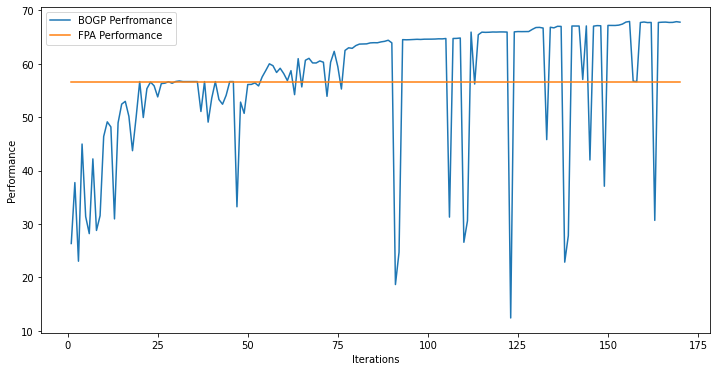

x_next is [ 25.9108651   29.89765542  29.68425603  12.80693156  27.14523388
  25.86377572  29.57103836  23.25107173  29.93070056  16.44677987
 -21.18056661  28.89126819  29.88889993  29.45998     29.9457707
  18.38928388  29.93951181  24.54638152  19.81262101  20.99961884]
f()=67.869469, actual=67.838
169


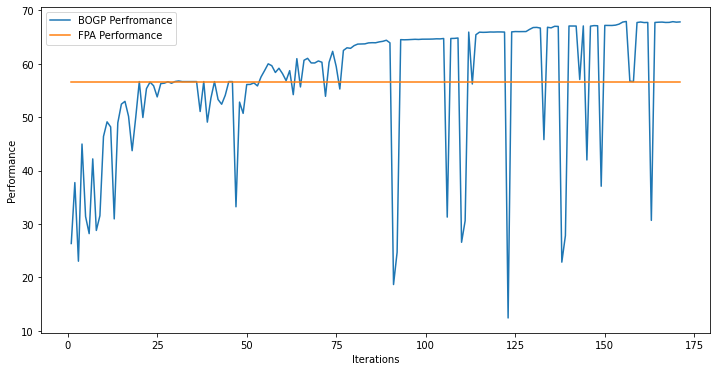

x_next is [-23.61004713  20.74185501 -29.97776572   5.76114868  16.25899459
 -11.71017605  24.51690357   7.45290923 -18.88749545  15.72251817
   1.92115854 -10.64655121 -23.1144654  -29.82135121  14.40984277
  18.35608147 -20.98238381  -5.72189742  10.55755122  -8.30301665]
f()=57.009357, actual=33.905
170


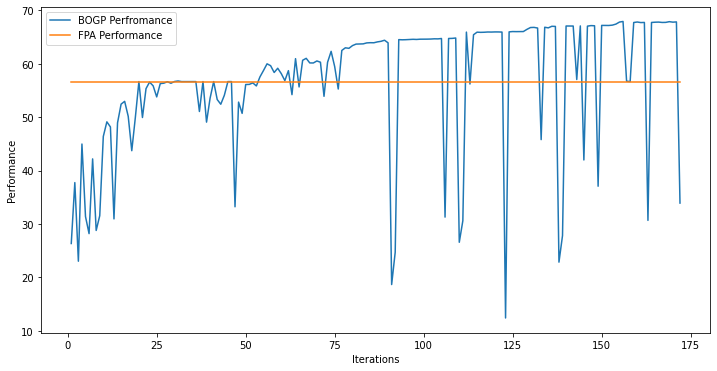

x_next is [ -5.68914706  23.73898267  27.33362675 -15.04676642  24.42576989
 -17.16169586 -26.16547162  -3.32027803  -7.01465089  -6.46179069
   5.74582074  14.66182853  18.49211738  -2.97664106 -21.59312778
  16.95018465  28.96613172  10.4126427   16.15099937  28.12138746]
f()=56.874761, actual=38.042
171


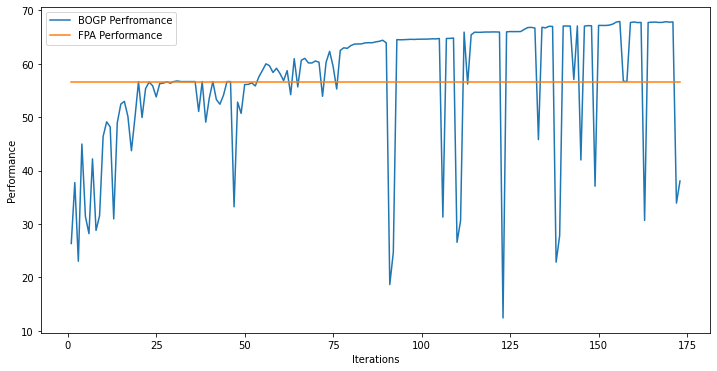

x_next is [ 29.97425274  29.99560809  29.96252782  29.95285711  29.97698767
  29.98854586  29.93694033  29.9962042   29.95806664  29.98086579
 -30.90220903  29.96302909  29.95893126  29.98973306  29.97862963
  29.9158838   29.98549935  29.99162266  29.94788435  29.97238001]
f()=56.765754, actual=56.673
172


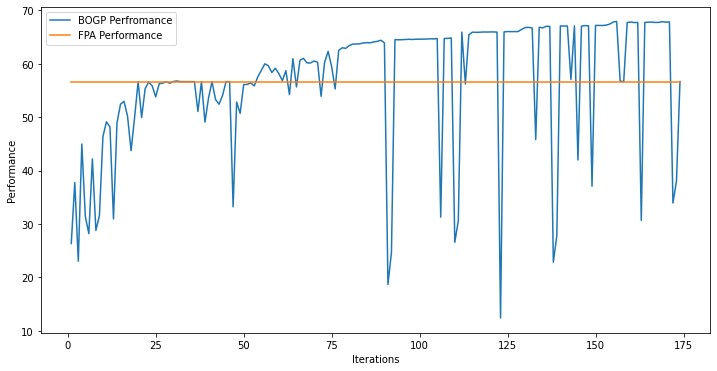

x_next is [ -7.26209673  -9.42925124  -2.10381432 -21.4313303  -24.58173568
  18.9548484  -10.13628403 -27.94885961 -15.4909687   10.7557391
  -6.05627092 -12.96082502 -27.88983285   0.54258817 -10.16233779
  11.52795354  -3.11562399 -20.00597073 -22.77279329 -28.00983489]
f()=56.765309, actual=17.849
173


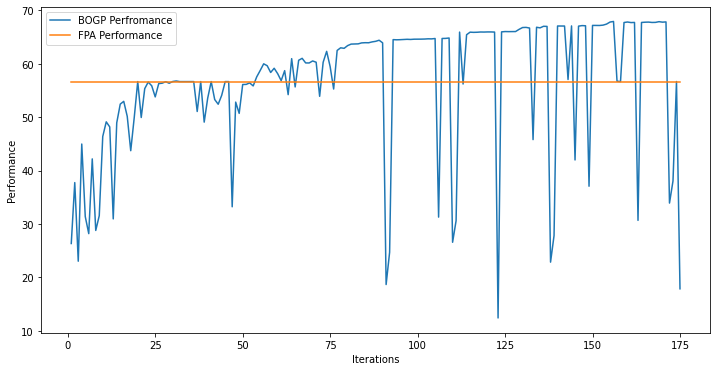

x_next is [-27.38878327 -25.87852192  -8.88290066  29.10474201 -19.32963557
  -7.66915285 -18.63813048  -3.17995663  26.70172939 -26.14539266
   0.49790706 -10.00434063  20.87991704 -16.29156536  -7.14198182
 -20.19811613  25.98075959   7.76260884  25.43092614   5.08276735]
f()=56.542084, actual=24.524
174


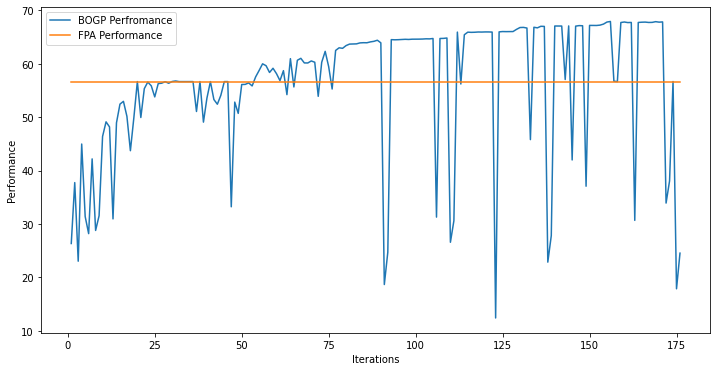

x_next is [ 25.66664523  29.9533377   29.69304332  13.45661173  27.81745978
  24.41282638  29.75066454  24.05162069  29.5897304   16.33611317
 -20.3040092   28.71458103  29.69484884  29.70720343  29.84301762
  18.48279376  29.81022715  24.32418833  19.74601117  20.88818525]
f()=67.795946, actual=68.042
175


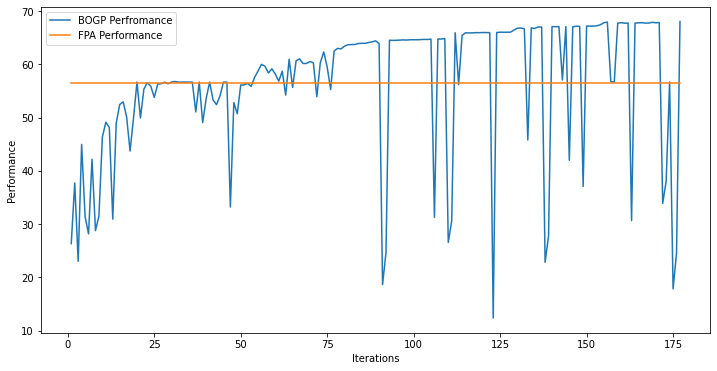

x_next is [ 25.84504042  29.97104558  29.93759064  12.79789044  27.11339769
  24.01502408  29.61148779  25.26295216  28.42725196  15.19851411
 -20.08366676  26.5766533   29.99430555  29.53288392  29.75582689
  18.56783213  29.89641077  23.09903911  18.90483283  21.32188214]
f()=67.995110, actual=68.004
176


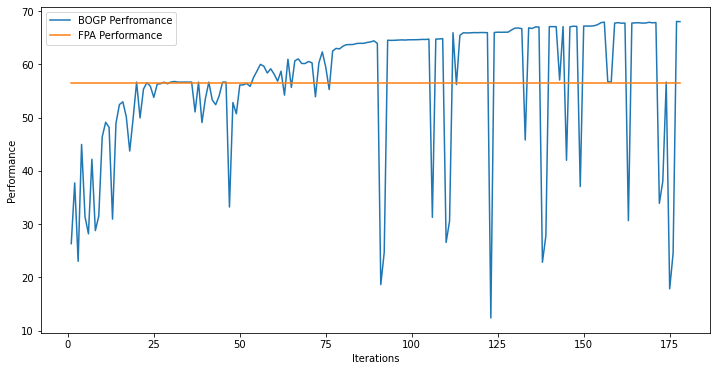

x_next is [ 26.05511322  29.84927564  29.07934029  13.48598182  26.9195003
  22.51176927  29.94563437  24.85753773  29.74908452  15.76050169
 -20.6843855   24.45806549  29.39857727  29.16785303  29.64403214
  18.35218258  29.71191808  22.80473187  18.87228891  20.42359145]
f()=67.827592, actual=67.946
177


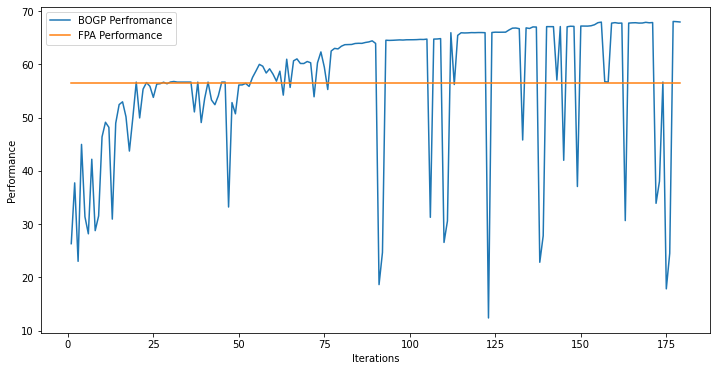

x_next is [ 27.05126275  29.87457534  29.44374773  12.16384426  27.10983984
  21.00897453  29.822578    26.07361131  28.79003269  16.15141777
 -18.9859051   25.58885125  29.25688057  29.8900842   29.93391111
  17.64047357  29.25540973  23.36915175  20.06611766  19.73040543]
f()=67.821635, actual=67.576
178


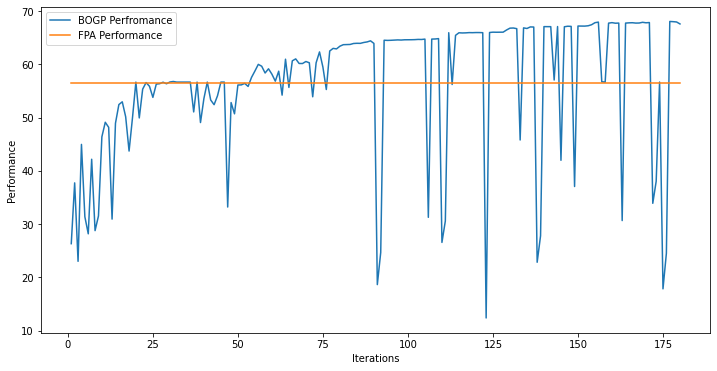

x_next is [ 25.08138003  29.84232239  29.5395641   13.04266349  27.81082427
  24.23952889  29.89843517  24.87432371  29.61823607  15.90129578
 -20.76389844  26.79230829  28.96058427  29.87240947  29.80283806
  18.42810506  29.92102549  24.59047682  18.82667162  19.21774732]
f()=67.978933, actual=67.878
179


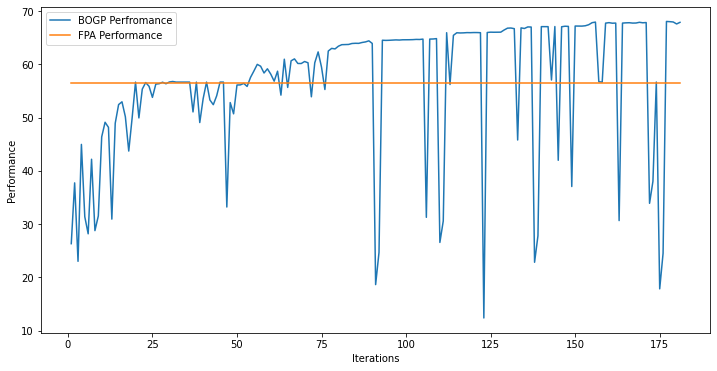

x_next is [ 25.36735358  29.98616353  29.81297554  12.86495784  28.00041693
  23.3462562   29.96998077  23.90273109  29.76924455  16.47333301
 -20.90346613  26.68293728  29.8884173   29.10155814  29.56235719
  17.48638822  29.98004532  24.04723647  18.91080829  21.1231744 ]
f()=68.108170, actual=68.241
180


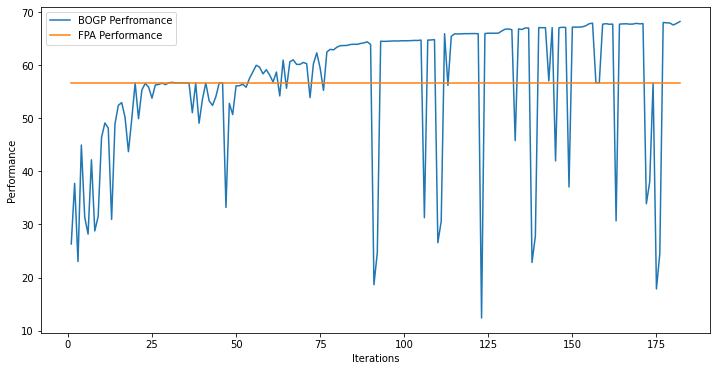

x_next is [ 26.62436611  29.87264421  29.76322052  12.13973302  27.66256513
  22.55939025  29.97306597  23.2705847   29.9066717   17.14450806
 -20.02165031  26.17339746  29.99630922  29.78425912  29.89110226
  18.38444596  29.8441136   23.92983749  18.97875931  22.05519396]
f()=68.192316, actual=68.075
181


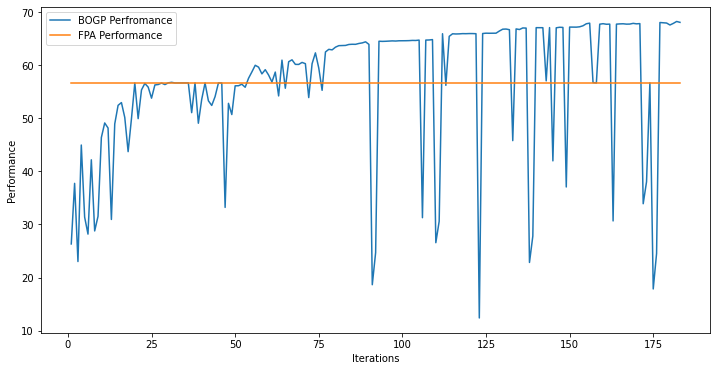

x_next is [ 26.15235125  29.90974348  29.58012639  13.74507076  28.77028658
  22.5538258   29.96043968  23.87682556  29.43297846  16.10499894
 -21.48190528  25.98924838  29.83057207  29.21115097  29.74834405
  17.7045508   29.49237549  22.96901558  19.05980046  21.2080401 ]
f()=68.077726, actual=68.254
182


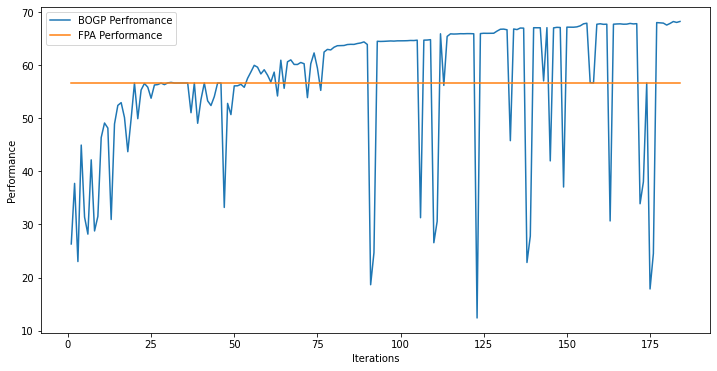

x_next is [ 25.85203455  30.          29.99999994  13.91497157  28.55979037
  22.82067617  29.99857013  23.7356585   29.04324714  16.15158359
 -21.47464011  25.56520968  29.97236346  28.88719448  29.99999999
  18.21106896  29.99999999  23.76348637  19.40962316  21.15317355]
f()=68.388998, actual=68.296
183


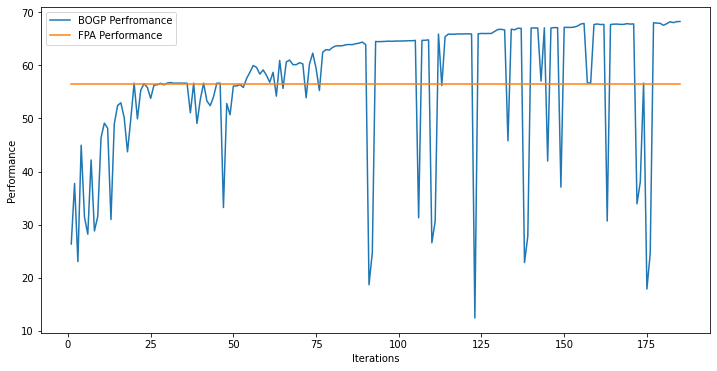

x_next is [ -5.98663266 -22.64293558  28.54367265   8.06158015 -17.24841034
  11.3332468   -1.96460941 -22.74905003  26.40735101  19.95505902
 -29.13569001  29.17192977 -20.56754559   4.34775895   2.76527596
  -2.82346908  10.5164083   26.18174494  17.08491439 -14.23591416]
f()=56.927888, actual=32.913
184


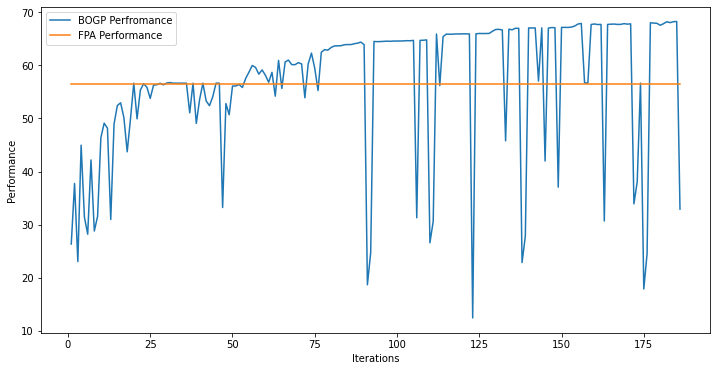

x_next is [ 25.71092758  29.82945427  29.62645212  13.33458924  29.55767
  22.72441843  29.85289768  23.59106269  29.70787407  15.19354483
 -20.9435146   25.38347187  29.97417402  29.72354813  29.83004426
  17.12389433  29.90439369  22.47470916  18.73842522  21.09801369]
f()=68.242213, actual=68.237
185


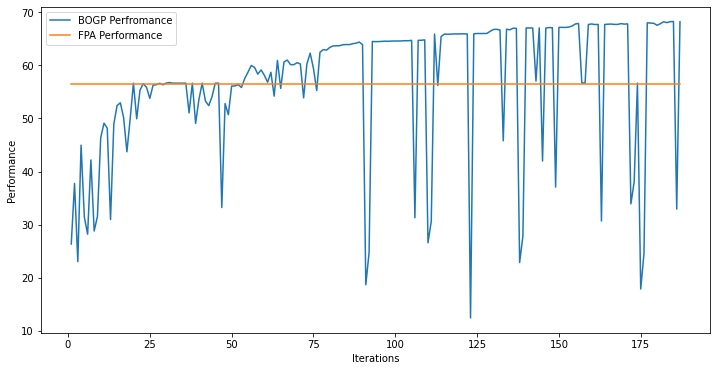

x_next is [ 29.00423589  29.15379088  29.89355296  29.30318921  29.91898772
  29.81364291  29.83778411  29.94780223  29.79761842  29.77088706
 -30.85287277  29.71304712  29.7453421   28.76006979  29.66169318
  29.92182961  29.69151241  28.9987568   29.35613746  29.14379049]
f()=56.859730, actual=56.711
186


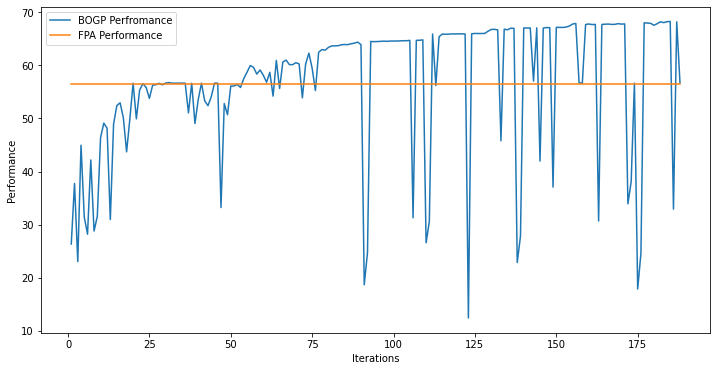

x_next is [ 25.23846096  29.9672047   29.72122886  12.91235181  28.9001584
  22.11654076  29.85574127  23.62570362  29.7800602   16.3830306
 -22.23373937  25.80515108  29.52428926  29.36313905  29.6988541
  17.02209272  29.86230015  22.26410122  18.84319909  21.378158  ]
f()=68.187464, actual=68.081
187


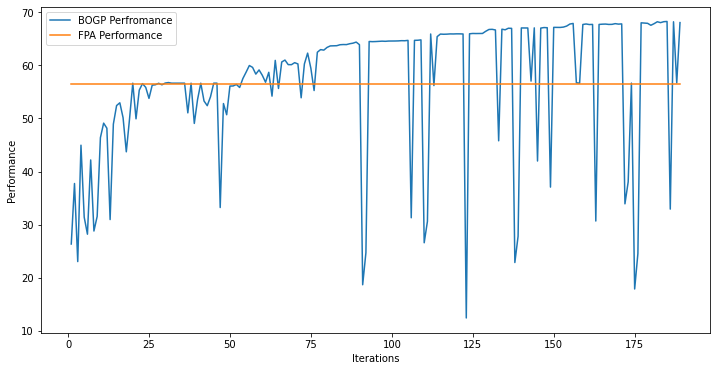

x_next is [-29.25949072 -22.989585   -24.89166306  -9.81274529  -4.61504153
  28.31067485   8.77171729  16.11770312 -30.0881631  -29.41893499
  13.28433456 -15.66297643  26.4142102  -12.40811694  10.17689187
 -16.48451934  18.28506409 -26.78721523 -12.99974784  -0.31407356]
f()=21.910774, actual=27.833
188


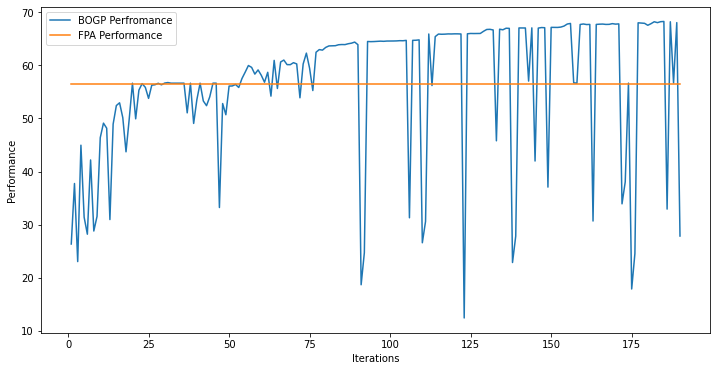

x_next is [ 26.21511961  29.96444514  29.92426597  13.94215933  27.94710612
  23.19464445  29.96910306  23.63987719  29.57964333  15.55736709
 -20.80253176  27.17104691  29.66147143  28.96670341  29.89547271
  18.11842785  29.80483664  23.88359293  18.47473408  21.89860496]
f()=68.268369, actual=68.427
189


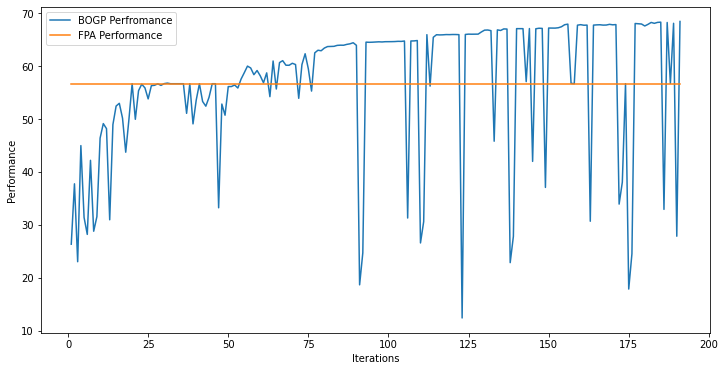

x_next is [ 26.8868459   29.87130375  29.84500619  15.02783588  28.26082785
  23.02865595  29.97564059  23.83301459  29.68345537  14.18884141
 -21.04626201  26.85285955  29.88144305  28.48492946  29.9722095
  17.87676056  29.22306176  23.59085922  18.55570629  22.26620766]
f()=68.349298, actual=68.525
190


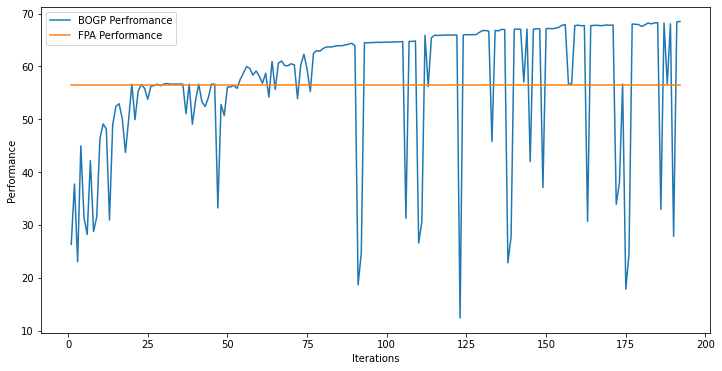

x_next is [ 26.63970188  29.98322895  29.69882086  14.30421339  28.81219797
  22.79491613  29.36400594  23.47879934  29.92279781  13.9774905
 -21.19020499  26.56187667  29.76640486  29.02322807  29.95787914
  16.88970766  29.71754416  23.69691881  18.89596398  22.51910785]
f()=68.462170, actual=68.460
191


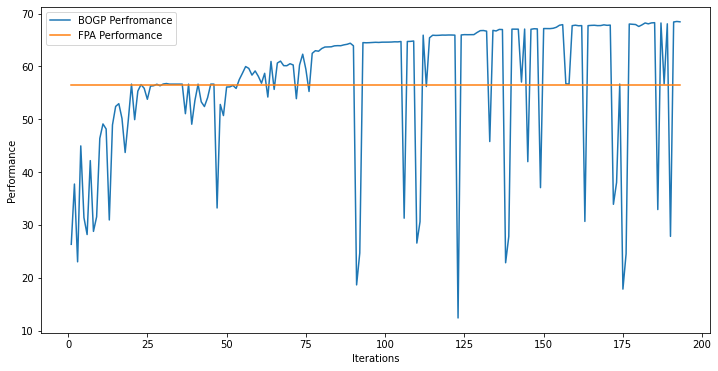

x_next is [ 29.97903026  29.99364254  29.99788388  29.99702451  29.99061129
  29.98687285  29.99490114  29.97743195  29.99472167  29.99580861
 -30.98646111  29.99297999  29.98892063  29.98855191  29.99731151
  29.99033971  29.99137149  29.98653068  29.99387229  29.99580684]
f()=56.947017, actual=56.654
192


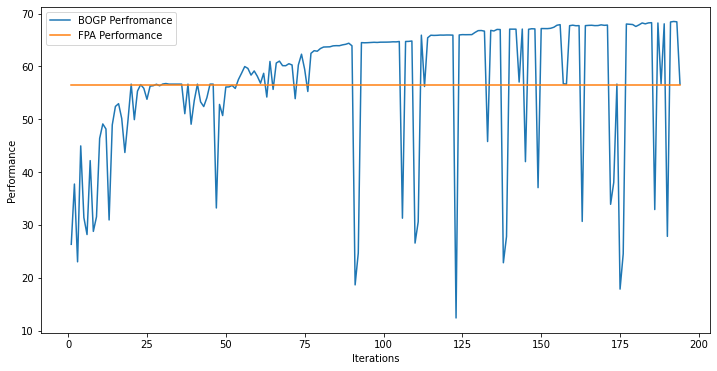

x_next is [ 26.93731768  29.85036775  29.5649572   14.02892914  27.71341642
  20.39958155  29.94912932  24.32437315  29.41427872  12.21436439
 -21.24176518  26.11463566  29.32227409  27.98795758  29.69908701
  17.16820436  28.62565382  22.53492267  17.90729514  21.54955197]
f()=68.184990, actual=68.538
193


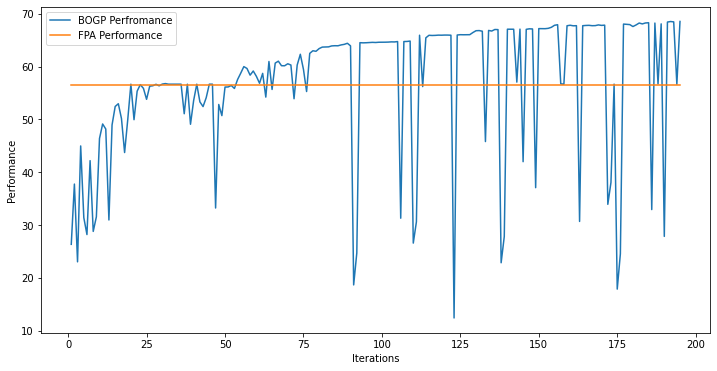

x_next is [ 26.48390313  29.91446128  29.26839747  14.40780428  27.12538314
  19.68483729  29.904983    22.52054399  29.45003077  11.72877586
 -20.09913161  26.660594    29.7094138   27.02675578  29.66489332
  16.21501789  29.39967458  21.69375262  18.13298569  21.45075086]
f()=68.491404, actual=68.533
194


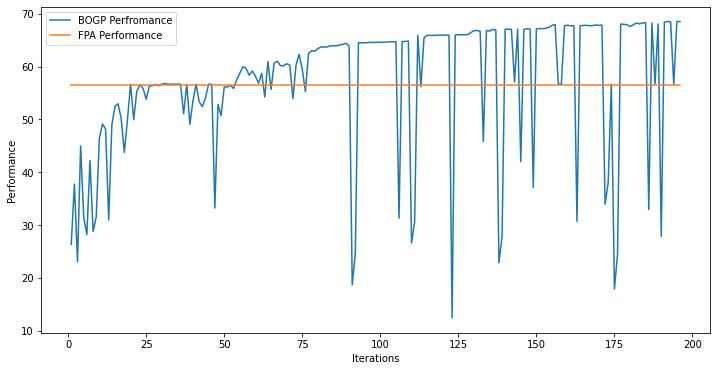

x_next is [ 11.35757553   6.91685505   7.74959555  20.5210578    8.77867259
  18.73795623  -0.60558955   1.75711      9.48911784 -16.24499457
 -27.86047733  -1.86075317  22.87453233  -3.3130672   10.76954679
   7.33344613   1.19926687  18.30561445  -0.48441863   8.41816052]
f()=57.063904, actual=36.074
195


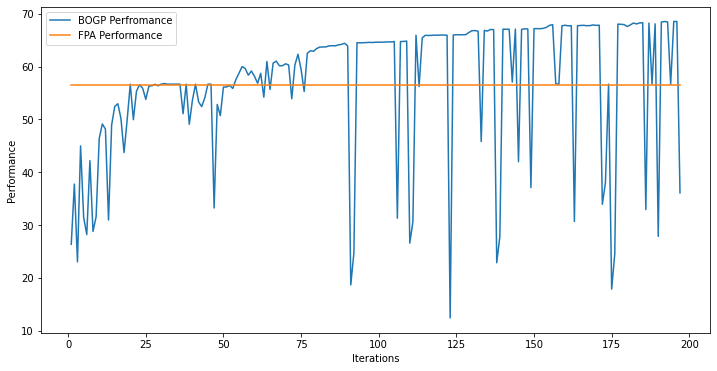

x_next is [ 26.36451124  29.80713993  29.8110331   12.77853014  26.64416332
  21.14935293  29.94501363  23.3092626   29.68524375  11.9188601
 -21.39277373  25.9760155   29.40647491  27.11160249  29.67139408
  15.84020109  29.3320826   21.88359351  17.28667148  21.85565022]
f()=68.474912, actual=68.577
196


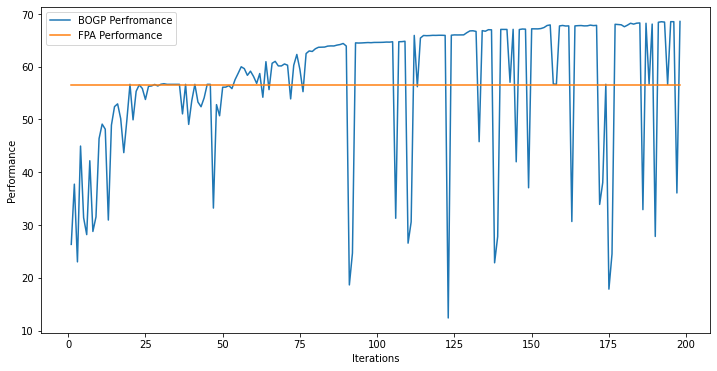

x_next is [ 29.99453977  29.99442324  29.99459853  29.97829585  29.99493411
  29.99551422  29.99970935  29.99515592  29.98394332  29.98673458
 -30.99920005  29.99731204  29.99759766  29.99522826  29.99816592
  29.99228974  29.99701153  29.99230229  29.98943436  29.99687923]
f()=57.015920, actual=56.676
197


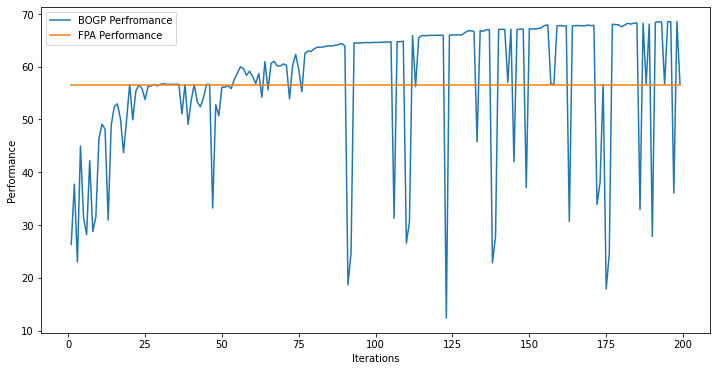

x_next is [-15.3396274  -23.23445931  23.21392564 -25.46357011   7.19614198
  -2.42609363 -23.58604595  26.36254038 -16.31168889 -23.11912445
 -27.15715564 -22.6944169   -0.35506221   9.58289391  18.35654266
 -14.9307441   14.94423186   0.32956283  -4.64715242  -2.93609124]
f()=57.014284, actual=22.519
198


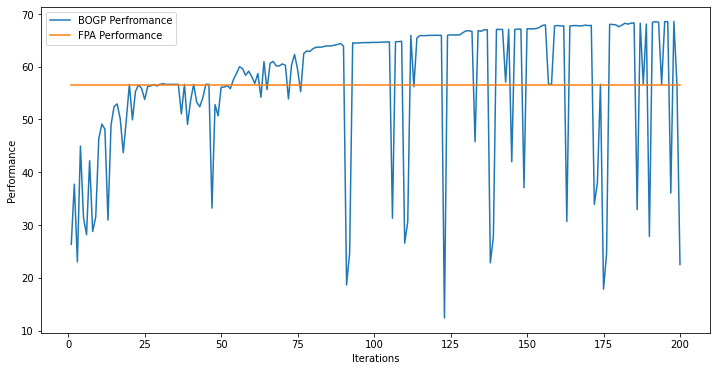

x_next is [ 26.73656921  29.99028755  29.91532775  14.08204024  27.40590323
  20.37748315  29.6081187   22.99595484  29.8141043   11.95794275
 -20.90243556  25.62710869  29.84352964  26.57231344  29.87311009
  15.91006212  28.64399608  21.73255851  18.10506634  21.92360889]
f()=68.670718, actual=68.723
199


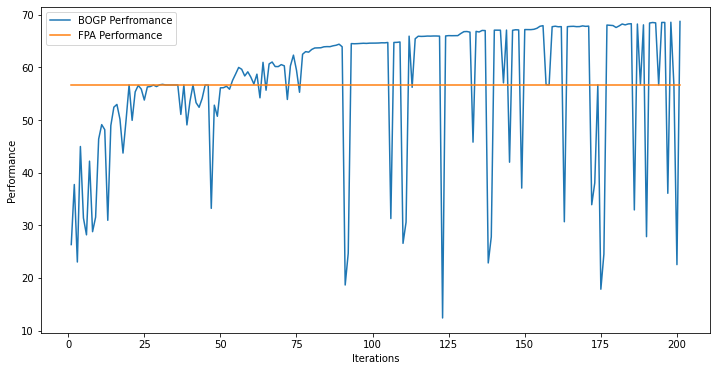

x_next is [ 26.59912856  29.84088791  29.8570288   12.84023508  27.01226175
  20.02764298  29.59924563  22.30864543  29.96873496  12.30759464
 -20.92485935  25.91923762  29.94689992  27.09212896  29.87395948
  16.72978271  28.33314426  21.24723187  18.08966839  21.64901564]
f()=68.633951, actual=68.889
200


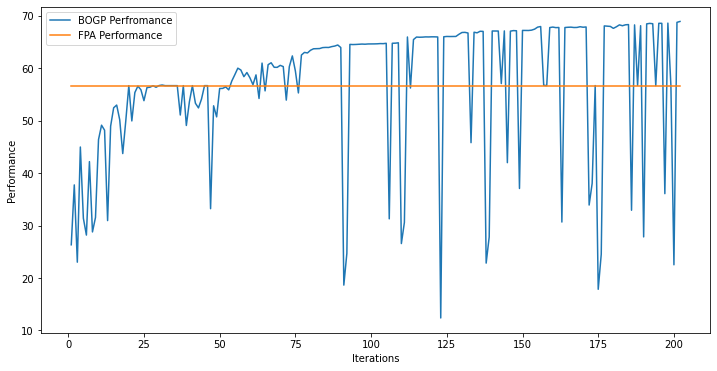

x_next is [ 13.65188838   6.91744884  16.43030152 -17.4446841  -12.78545889
  -7.08861157 -13.93866451 -20.14580592  23.35438285 -24.74633741
   8.6433793   24.13714878  28.17652664  22.25158775 -14.96426036
  -2.46301366  -1.54213214  29.91089963  -8.87450651  15.70277732]
f()=30.689700, actual=29.848
201


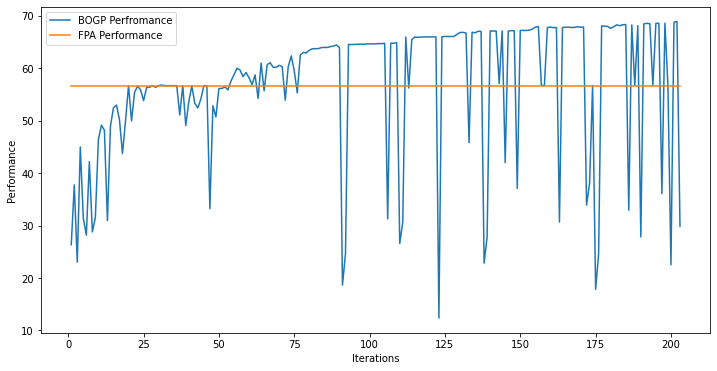

x_next is [ 26.59273038  29.99280113  29.99886949  12.9918416   26.08421466
  19.91591705  29.92163391  21.46448421  29.86550404  10.89141372
 -20.9118801   25.29744403  29.7861218   25.77782342  29.88642466
  16.90966202  27.66633951  20.71516536  17.78936091  20.22082556]
f()=68.853758, actual=68.947
202


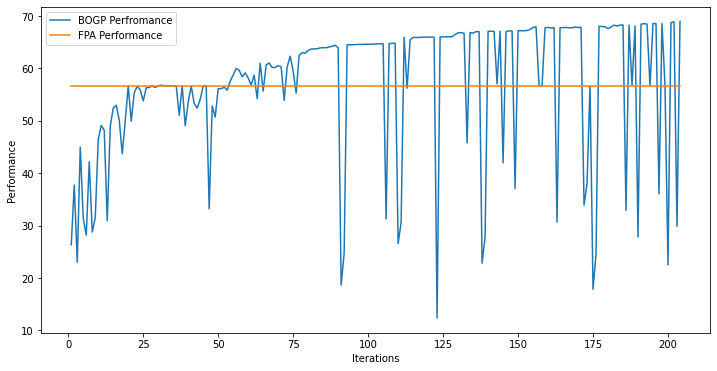

x_next is [ 26.25177188  29.90925587  29.87553526  12.42183616  26.90199121
  19.1727487   29.85602566  21.55073393  29.60707798  12.32136451
 -20.74488294  26.31321048  29.91945212  27.0681966   29.9413363
  16.68948506  27.20651771  21.32650395  17.57175295  19.42303148]
f()=68.922465, actual=68.986
203


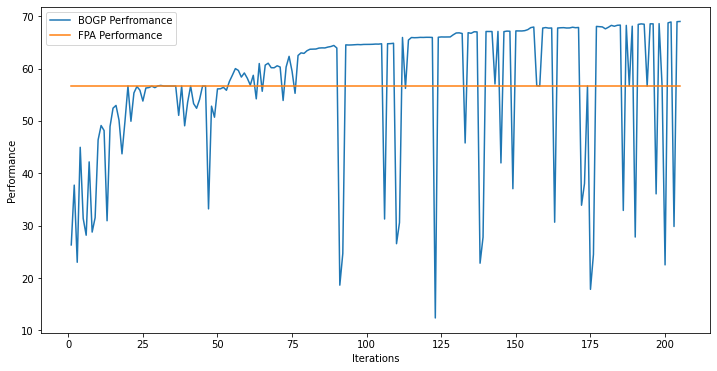

x_next is [ 25.30020253  29.83309818  29.96536774  12.23908677  27.40325647
  19.35738463  29.83237904  22.48537907  29.88932093  11.56085376
 -20.7041601   26.49037633  29.83659088  27.5836345   29.86101051
  16.83342538  26.92103345  20.34686146  17.57787154  18.91576332]
f()=68.898479, actual=68.926
204


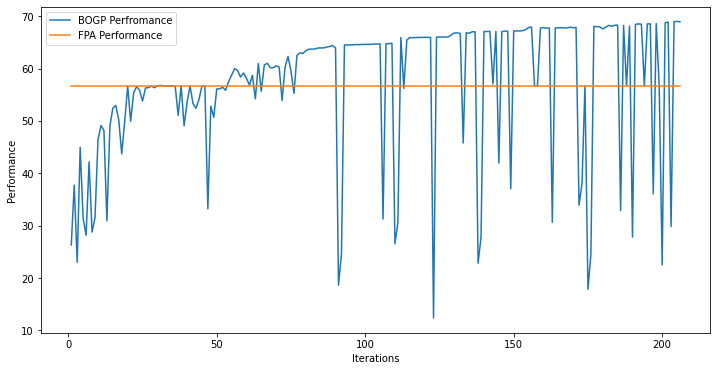

x_next is [ 23.40560533  29.68962419  29.48229951  13.23449574  27.87405595
  13.37991229  28.6248164   21.31338106  29.88201333   7.91266058
 -17.6911058   24.90281533  29.36022996  27.25079023  29.7562149
  15.70402277  24.70759067  17.65385243  15.37050743  18.4329902 ]
f()=67.961200, actual=67.372
205


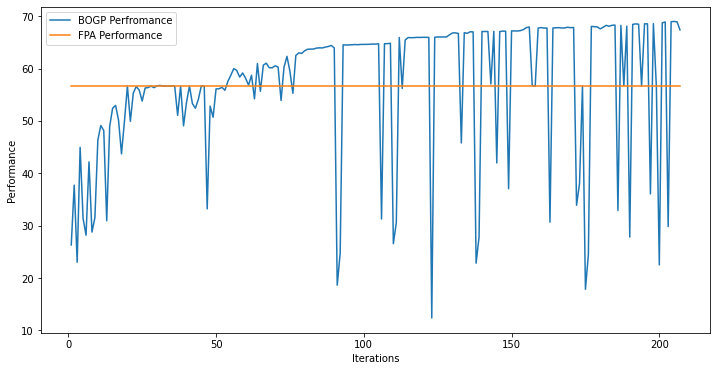

x_next is [ 6.22990792  5.76051031 -0.24013727  3.21790011  0.15481875 -2.75830209
  1.48311656 -2.06962613  2.73375439 -3.39204746 -2.31560927 -1.93069996
  4.35435429 -2.21154892 -4.88257987  4.19509497 -0.89002377  3.70511936
  4.58632871 -1.39733979]
f()=14.580175, actual=29.117
206


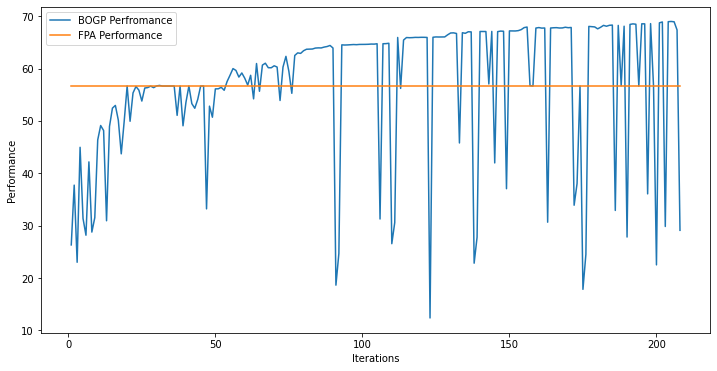

x_next is [ 26.44527093  29.95979924  29.98750516  12.83627723  28.25415913
  18.57510575  29.70027114  20.80656822  29.86605471  10.82401488
 -20.92460868  26.01392771  29.3120557   26.03094933  29.95906002
  16.83352114  26.29705073  19.47625526  17.74997497  18.78698111]
f()=68.810566, actual=68.702
207


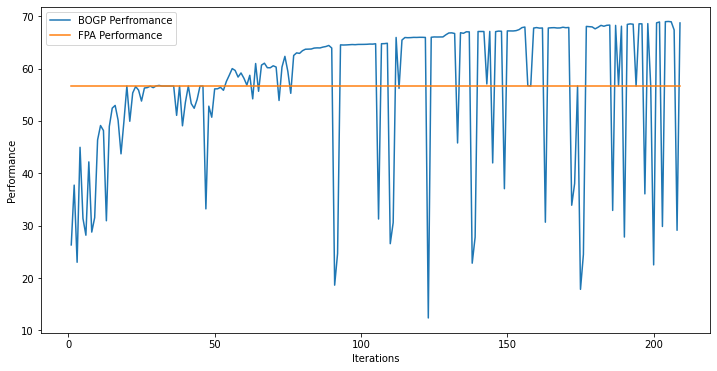

x_next is [ 26.3279959   29.89644225  29.90296611  12.13836779  25.49991097
  18.13097564  29.31524227  21.70334905  29.68305055  10.93392086
 -20.23938839  26.36749522  29.72716494  27.34081065  29.95455292
  16.56881066  25.81667926  20.98073523  18.35530978  19.08119726]
f()=68.815690, actual=68.816
208


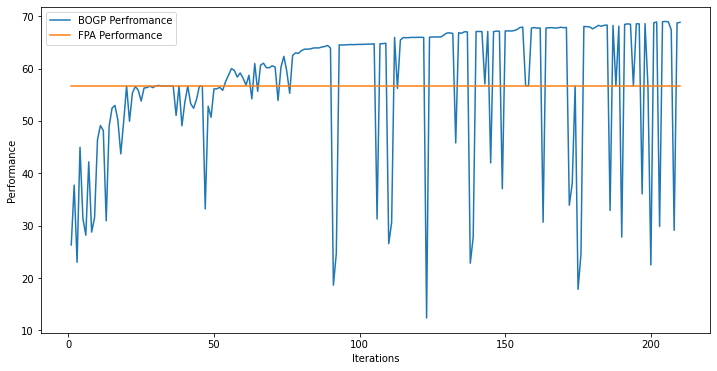

x_next is [ 26.44746703  29.7763446   29.61632358  12.76237772  27.13372613
  20.36973296  29.77421001  21.2635984   29.61058492  11.55087805
 -21.05032662  25.63628714  29.55849393  27.38818242  29.76425451
  18.3009571   26.54187805  21.73345661  18.7500486   19.88849676]
f()=68.756833, actual=68.851
209


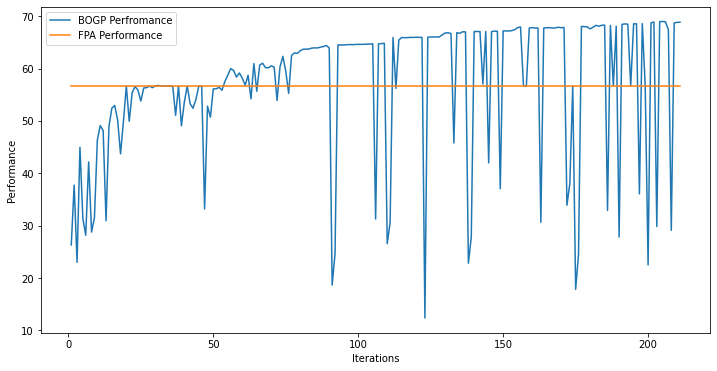

x_next is [ 26.09534951  29.92562588  29.83918122  12.16318715  26.16347445
  20.39007885  29.84523344  21.43944505  29.89690789  11.12472608
 -20.49042181  25.68458132  29.77410647  26.66399813  29.96933144
  16.17734046  27.47237639  20.98924753  17.67763009  19.85110152]
f()=68.995314, actual=69.080
210


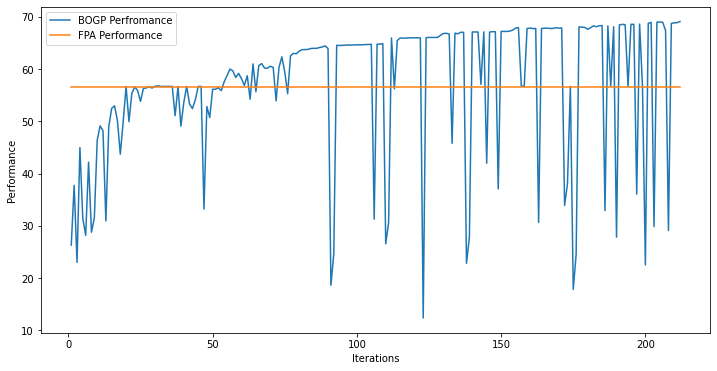

x_next is [ 25.0472637   29.95658603  29.98895286  12.33257871  26.77951336
  20.29138645  29.91719355  21.2206588   29.96609217  11.60058542
 -20.13137859  26.04060515  29.88975784  27.5322888   29.97872257
  16.16243304  26.13207211  21.25204425  17.41576907  20.58201499]
f()=69.140359, actual=69.153
211


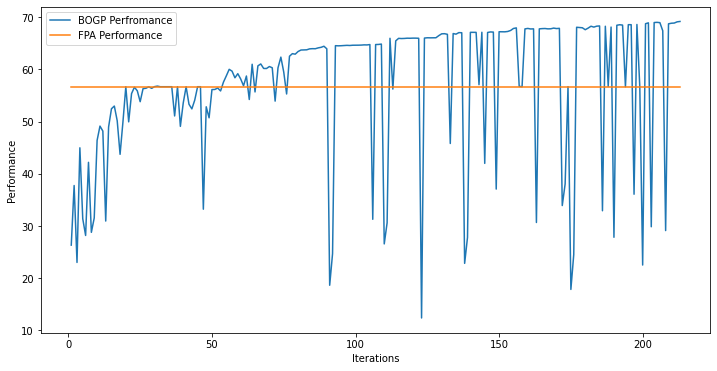

x_next is [ 25.90539979  29.99620673  29.77696344  12.07823852  27.08924397
  19.99260624  29.73071648  21.21001563  29.62591051  11.68668026
 -19.86631534  24.93330286  29.86142839  27.27227804  29.98849726
  16.08103132  26.43406739  20.80139188  17.7568427   19.94796403]
f()=69.071107, actual=69.074
212


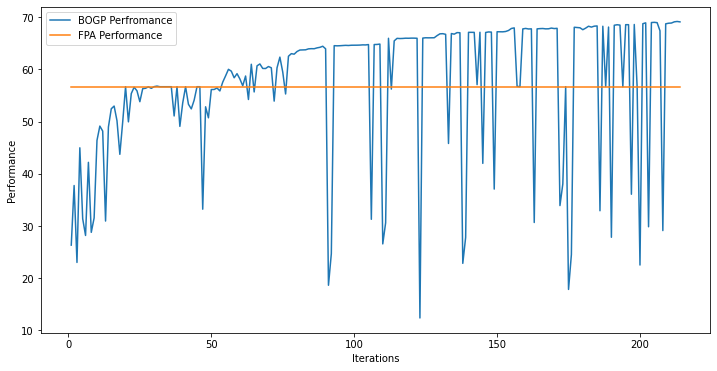

x_next is [ 25.82948558  29.91633686  29.89450495  11.28619109  26.8083942
  19.93376535  29.71726374  20.35249661  29.72797558  11.62704212
 -20.72039591  25.49514695  29.95469298  27.88371344  29.94178489
  15.99038104  27.07711435  22.14569104  17.55515044  19.38895277]
f()=69.024462, actual=69.135
213


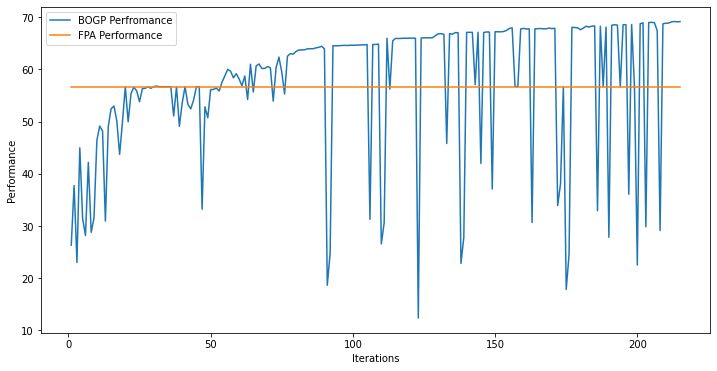

x_next is [ 29.99978268  29.99999999  29.99998562  29.99999996  30.
  30.          29.99994241  30.          29.99999992  29.99999997
 -30.99990864  29.99999998  30.          29.99999998  29.99993901
  29.99991899  29.99958842  29.99999993  29.99999997  29.99998543]
f()=57.310937, actual=56.660
214


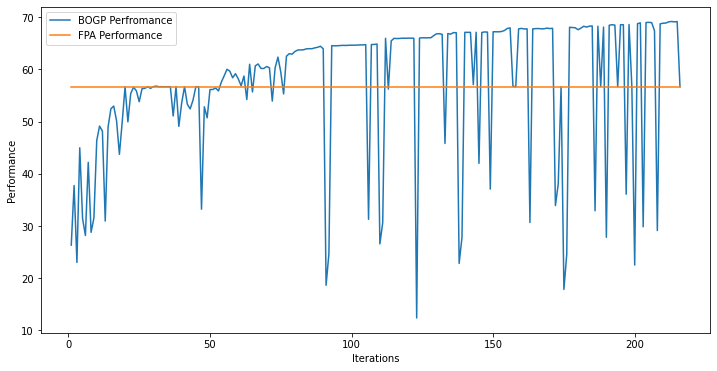

x_next is [ 23.4510614  -26.7050458   10.59484617 -19.8677813  -13.80103282
  21.31253187  -2.45708165 -30.80063375 -10.25839181 -11.68423826
 -16.66523459 -22.37030126  -2.58997015  -3.84860195 -21.13203877
   1.90885409 -24.69222824  -8.72898783  -0.61700439  13.56683917]
f()=17.064845, actual=25.515
215


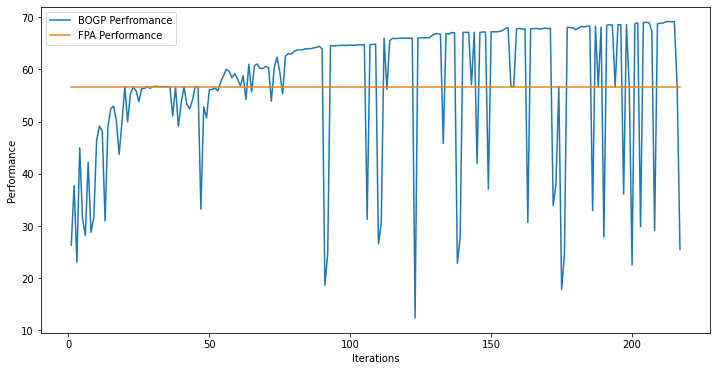

x_next is [ 25.4551687   29.98959984  29.89228198  11.49807759  26.47678438
  20.37727678  29.94881908  20.7032526   29.67204406  10.6721202
 -20.42770352  24.63204571  29.97489787  27.99898089  29.91258326
  15.27205393  26.74331067  22.25024869  18.39670526  20.91890399]
f()=69.106823, actual=69.014
216


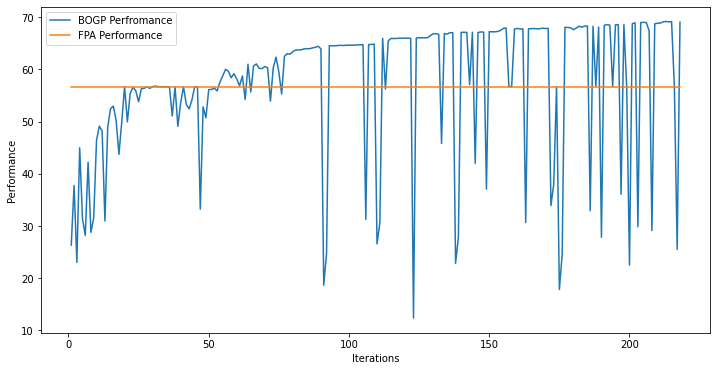

x_next is [ 25.58915942  29.95852689  29.99556843  10.9509387   26.10797865
  20.02397696  29.6395375   19.79029086  29.787017    11.37593966
 -20.6518189   26.01274575  29.88844359  27.72423735  29.90912316
  16.28814751  26.45151523  21.15663974  16.68522615  19.77705696]
f()=69.097097, actual=69.048
217


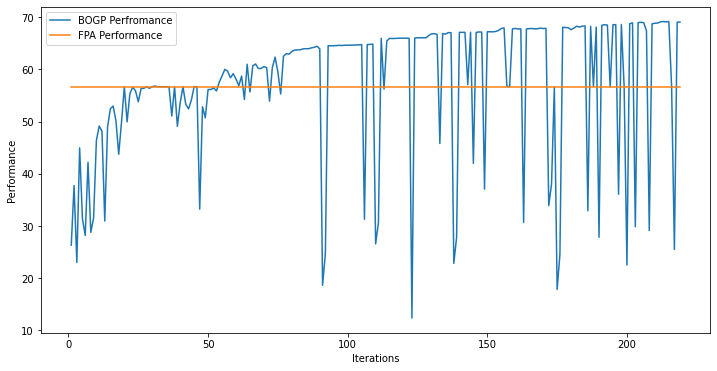

x_next is [ 25.50710923  29.85740802  29.94677032  11.21528748  25.60639007
  20.39251907  29.97185089  21.25892503  29.94047218  10.58737238
 -19.45668488  26.31030691  29.98091344  27.99352716  29.87745607
  15.60538632  25.96592069  20.97671452  17.80897908  19.27855328]
f()=69.033341, actual=69.018
218


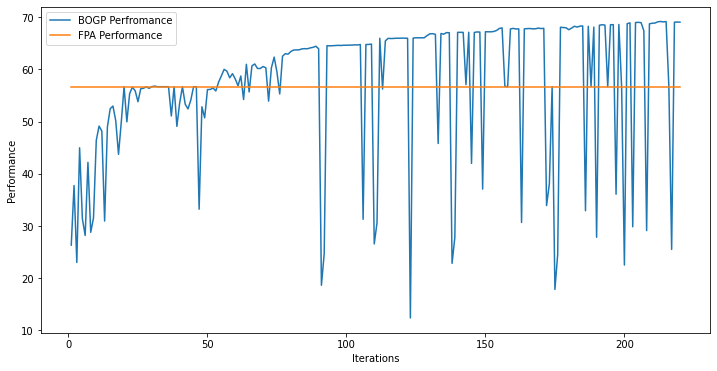

In [ ]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective_FPA(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(250):
  x_next = opt_acquisition(X, y, model, X.shape[0]+1)

  np.save("/content/drive/MyDrive/trainingx_BOGP_2.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_2.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_2.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective_FPA(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)
  
  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


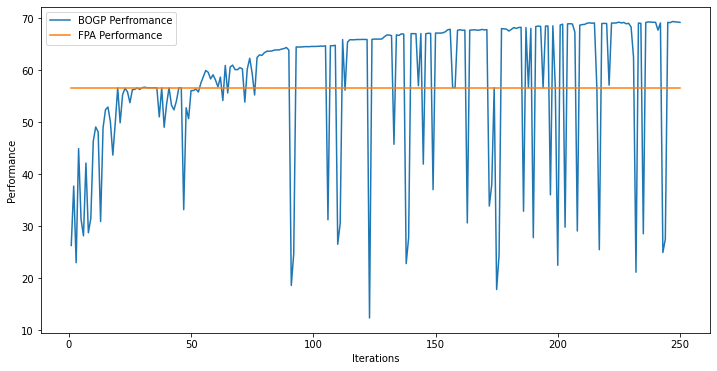

P_max = 30.000, Optimal_SE = 69.415
P_max = 30.000, Optimal_SE_FPA = 56.571


In [10]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 
ix = 0
ix = argmax(y)
print('P_max = %.3f, Optimal_SE = %.3f' % (P_max, y[ix]))

ix_FPA=0
ix_FPA=argmax(y_FPA)
print('P_max = %.3f, Optimal_SE_FPA = %.3f' % (P_max, y_FPA[ix_FPA]))

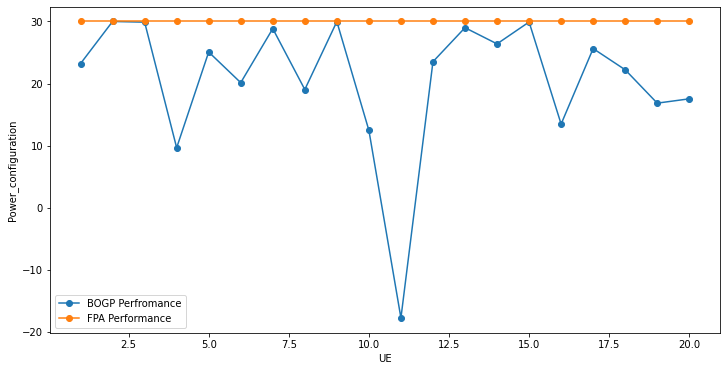

Power_configuration_BOGP is [ 23.21306849  29.99999843  29.88740649   9.65620236  25.07803493
  20.1407395   28.84605287  19.03593266  29.9774716   12.46077961
 -17.77257172  23.5166918   28.99628048  26.38923266  29.91211228
  13.47144625  25.63233932  22.21548062  16.83975444  17.53650851]


In [9]:
X_FPA = P_max * np.ones([1,var], dtype = "float").reshape((int)(20), 1)
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("UE")
pyplot.ylabel("Power_configuration")
pyplot.plot(np.arange(1,21),X[ix][:], '-o')
pyplot.plot(np.arange(1,21),X_FPA[:], '-o')
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show()
print("Power_configuration_BOGP is", X[ix])

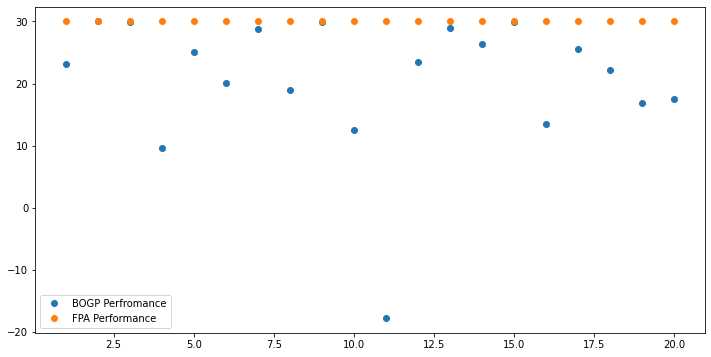

Power_configuration_BOGP is [ 23.21306849  29.99999843  29.88740649   9.65620236  25.07803493
  20.1407395   28.84605287  19.03593266  29.9774716   12.46077961
 -17.77257172  23.5166918   28.99628048  26.38923266  29.91211228
  13.47144625  25.63233932  22.21548062  16.83975444  17.53650851]


In [11]:
import matplotlib.pyplot as plt
X_FPA=np.linspace(P_max,P_max,20)
plt.figure(figsize = (12, 6)) 
plt.plot(np.arange(1,21),X[ix][:], 'o')
plt.plot(np.arange(1,21),X_FPA[:], 'o')
plt.legend(["BOGP Perfromance","FPA Performance"])
plt.show()
print("Power_configuration_BOGP is", X[ix])